In [975]:
import numpy as np 
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt
import folium

pd.set_option('display.max_columns', None)




# **Feature Engineering and Customer Segmentation**

## **Introduction**

This project focuses on analyzing user transaction data collected from March 1st to May 31st, 2024. The primary goal is to extract and engineer user features to create effective customer segments. These segments will assist the Marketing Department in developing strategies to attract and retain customers.

The dataset includes the following variables:

| Feature                  | Description                                                                                     |
|--------------------------|-------------------------------------------------------------------------------------------------|
| transaction_id           | Unique identifier for each transaction.                                                        |
| user_id                  | Unique identifier for each user.                                                               |
| transaction_amount       | The amount of money transacted.                                                                 |
| transaction_date         | The date and time when the transaction occurred.                                               |
| merchant_name            | Name of the merchant.                                                                          |
| merchant_category_id     | Identifier for the merchant category (Visa MCC category ID).                                   |
| geo_location             | The geographical location of the transaction (latitude and longitude).                         |
| payment_method           | The method of payment used (e.g., balance, credit card).                                      |
| user_agent               | Type of device used for the transaction.                                                       |
| loyalty_program          | Indicates whether the user is part of a loyalty program (yes or no).                           |
| discount_applied         | Indicates whether a discount was applied to the transaction (yes or no).                       |
| promo_amount             | The amount discounted due to promotions.                                                      |
| transaction_notes        | Additional notes or descriptions related to the transaction.                                   |
| merchant_rating          | User's rating of the merchant, if applicable (on a scale of 1-5).                             |
| transaction_status       | Status of the transaction (e.g., completed, pending, canceled).                               |
| is_refunded              | Indicates whether the transaction was refunded (yes or no).                                    |

### **Customer Segmentation**

Customer segmentation involves categorizing users into distinct groups based on various characteristics. This can include:

- **Demographic Segmentation**: Age, gender, income, education, etc.
- **Behavioral Segmentation**: Spending patterns, product preferences, etc.
- **Geographic Segmentation**: User's home and work locations.

**Priority Features for Segmentation**


| **1st Priority Features**             | **2nd Priority Features**           |
|---------------------------------------|-------------------------------------|
| Big Five Personality Score            | Working Status                      |
| Gender                                | Industry of Employment              |
| Age                                   | Health Status                       |
| Income Level                          | Homeownership Status                |
| Educational Background                | Marital Status                      |
| Home Location                         | Parental Status                     |
| Work Location                         | Vehicle Ownership                   |

### **Business Problems**

The primary business problems addressed in this project include:

- **Understanding Customer Behavior**: Identifying how different user segments behave in terms of spending, preferences, and transaction patterns.


### **Goals**

The goals of this project are:

1. To create features that facilitate effective segmentation for targeted marketing.
2. To develop a clear understanding of user segments based on transaction data.
3. To provide actionable insights that the Marketing Department can implement to improve customer acquisition and retention strategies.

### **Approach and Method**

The approach involves several key steps:

1. **Data Preprocessing**: Cleaning and transforming the raw transaction data to prepare it for analysis.
2. **Feature Engineering**: Creating relevant features based on user demographics and transaction behaviors.
3. **Segmentation Analysis**: Utilizing clustering techniques to group users into distinct segments based on the engineered features.

### **Evaluation Method**

The effectiveness of the segmentation will be evaluated using the following methods:

- **Elbow Method**: Identifying the optimal number of clusters by analyzing the variance explained as a function of the number of clusters.
- **Insight Generation**: By analyzing the segments, we can extract valuable insights that inform better strategies and business decisions, helping to align our offerings with customer needs and preferences.

## **Load Data**

In [976]:
df = pd.read_csv("transactions.csv")
df.head()

,transaction_id,user_id,transaction_amount,transaction_date,merchant_id,merchant_name,merchant_category_id,geo_location,payment_method,user_agent,loyalty_program,discount_applied,promo_amount,transaction_notes,merchant_rating,transaction_status,is_refunded
0,4a71b7d1-34fa-45cf-b40a-a730d16ce617,U10578,23500.0,2024-05-09,M04936,Cox Inc,5732,"-7.974781, 112.633863",balance,Android 9,no,no,0.0,no,5,completed,no
1,b29665c0-8373-4ec1-a121-a041c77ffb51,U08353,150500.0,2024-05-30,M06359,"King, Rice and Ramirez",5812,"-6.188155, 106.817086",balance,iPhone; CPU iPhone OS 3_1_3 like Mac OS X,no,no,0.0,yes,2,completed,no
2,3e32187b-b374-4f1b-a64e-b1ebcc856563,U04564,65800.0,2024-03-08,M01710,"Lyons, Porter and Williams",5812,"-7.962043, 112.637274",credit_card,Android 2.0.1,no,no,0.0,no,3,completed,no
3,df8ad42e-aaf6-46d2-8d8f-1e291a4554bd,U22797,45600.0,2024-05-14,M02852,Smith Ltd,5411,"-6.592793, 106.806543",balance,iPad; CPU iPad OS 9_3_5 like Mac OS X,no,no,0.0,no,3,completed,no
4,334468df-4d71-4e4a-935c-32c17c306611,U18053,8500.0,2024-04-09,M00722,Bush Group,5411,"-6.269386, 106.979043",balance,Android 2.0.1,yes,no,0.0,no,4,completed,no


In [977]:
# Change dtype of transaction date
df['transaction_date']=pd.to_datetime(df['transaction_date'])

# Change merchant_category_id into object 
df['merchant_category_id']=df['merchant_category_id'].astype(str)

In [978]:
# Know the period of time
print("Minimum date : ",df['transaction_date'].min())
print("Maximum date : ",df['transaction_date'].max())

Minimum date :  2024-03-01 00:00:00
Maximum date :  2024-05-31 00:00:00


In [979]:
df.describe()

,transaction_amount,transaction_date,promo_amount,merchant_rating
count,278932.000000,278932,278932.000000,278932.00000
mean,50098.301378,2024-04-14 21:11:21.921041664,4311.858087,3.80046
min,1000.000000,2024-03-01 00:00:00,0.000000,1.00000
25%,14400.000000,2024-03-26 00:00:00,0.000000,3.00000
50%,34800.000000,2024-04-12 00:00:00,0.000000,4.00000
75%,69400.000000,2024-05-06 00:00:00,0.000000,5.00000
max,587100.000000,2024-05-31 00:00:00,422600.000000,5.00000
std,50021.138491,NaN,16527.140346,1.16671


In [980]:
df.isna().sum()

transaction_id          0
user_id                 0
transaction_amount      0
transaction_date        0
merchant_id             0
merchant_name           0
merchant_category_id    0
geo_location            0
payment_method          0
user_agent              0
loyalty_program         0
discount_applied        0
promo_amount            0
transaction_notes       0
merchant_rating         0
transaction_status      0
is_refunded             0
dtype: int64

In [981]:
df.duplicated().sum()

0

The dataset comprises 278,932 transactions, with transaction amounts ranging from Rp 1,000 to Rp 587,100. Most merchants in this dataset receive ratings between 4 and 5 stars, indicating a generally positive customer experience.

A notable aspect of this dataset is the promo_amount feature. The analysis reveals that there are no values recorded between the first quartile (Q1) and third quartile (Q3) for this variable. However, it is striking that the maximum promo_amount reaches Rp 422,600. This discrepancy warrants further investigation to understand the factors contributing to such a high maximum value despite the absence of intermediate values.

### **Separate categoric and numeric features**

In [982]:
# Divide feature numeric vs categoric
num_feature = df.select_dtypes(include = ['int64','Float64']).columns
print('Numeric features : ')
print(num_feature)

cat_feature = [fea for fea in df.columns if fea not in num_feature] 
print('Categoric features :')
print(cat_feature)

Numeric features : 
Index(['transaction_amount', 'promo_amount', 'merchant_rating'], dtype='object')
Categoric features :
['transaction_id', 'user_id', 'transaction_date', 'merchant_id', 'merchant_name', 'merchant_category_id', 'geo_location', 'payment_method', 'user_agent', 'loyalty_program', 'discount_applied', 'transaction_notes', 'transaction_status', 'is_refunded']


### **EDA**

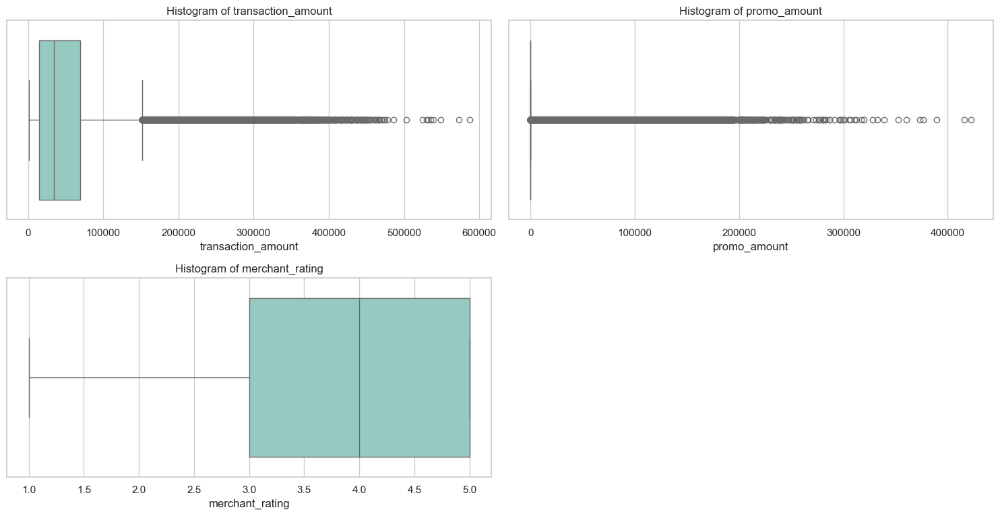

In [983]:

plt.figure(figsize=(15,15))
plotnumber = 1 
num_feature_1 = ['transaction_amount', 'promo_amount', 'merchant_rating']

for i in num_feature_1 :
    plt.subplot(4,2,plotnumber)

    sns.boxplot(data=df,x=i)

    plt.xlabel(i)
    plt.title(f'Histogram of {i}')
    plt.tight_layout()
    plotnumber += 1

In [984]:
# Find unique values in each categoric features
for i in cat_feature : 
    print (i)
    print ("Number of unique value", df[i].nunique())
    print (df[i].unique(),'\n')

transaction_id
Number of unique value 278932
['4a71b7d1-34fa-45cf-b40a-a730d16ce617'
 'b29665c0-8373-4ec1-a121-a041c77ffb51'
 '3e32187b-b374-4f1b-a64e-b1ebcc856563' ...
 'f12b9af5-d3e5-48d5-98e6-1c0649cf20ad'
 '2648fd0d-e071-4dac-9852-7b367c6876ae'
 '61c76cf6-dbf0-4f9e-beee-8476f3b8fc0d'] 

user_id
Number of unique value 24321
['U10578' 'U08353' 'U04564' ... 'U13010' 'U05019' 'U08058'] 

transaction_date
Number of unique value 92
<DatetimeArray>
['2024-05-09 00:00:00', '2024-05-30 00:00:00', '2024-03-08 00:00:00',
 '2024-05-14 00:00:00', '2024-04-09 00:00:00', '2024-05-17 00:00:00',
 '2024-03-14 00:00:00', '2024-03-02 00:00:00', '2024-04-10 00:00:00',
 '2024-03-25 00:00:00', '2024-05-16 00:00:00', '2024-03-31 00:00:00',
 '2024-03-17 00:00:00', '2024-04-21 00:00:00', '2024-03-28 00:00:00',
 '2024-04-07 00:00:00', '2024-04-26 00:00:00', '2024-04-12 00:00:00',
 '2024-03-01 00:00:00', '2024-04-08 00:00:00', '2024-04-06 00:00:00',
 '2024-04-18 00:00:00', '2024-05-05 00:00:00', '2024-03-18 0

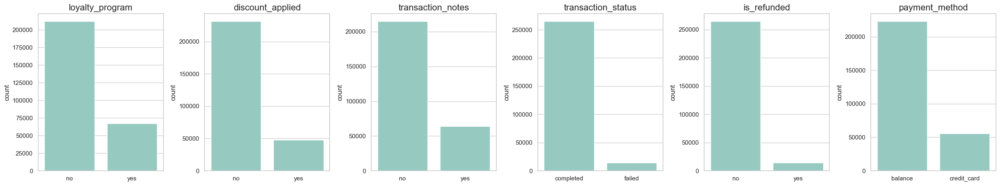

In [985]:

plt.figure(figsize=(25, 5), facecolor='white')
sns.set(style='whitegrid', palette='Set3')

cat_features = ['loyalty_program', 'discount_applied', 'transaction_notes', 'transaction_status', 'is_refunded','payment_method']

# Number of plots
num_features = len(cat_features)
rows = (num_features // 6) + (num_features % 6)  # Determine number of rows needed

plotnumber = 1

for feature in cat_features:
    # Create subplot
    ax = plt.subplot(rows, 6, plotnumber)
    
    # Count plot for the feature
    sns.countplot(x=feature, data=df)
    
    plt.xlabel(" ")
    plt.title(feature, fontsize=16)
    
    plotnumber += 1

plt.tight_layout()
plt.show()


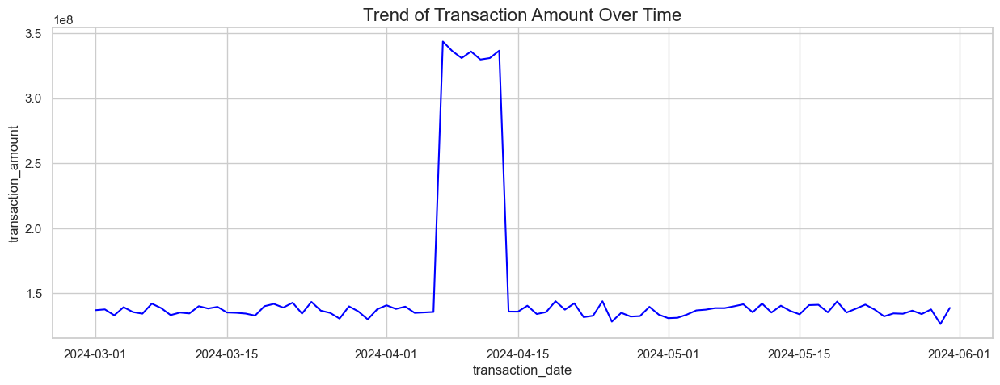

In [986]:
trend_transaction = df.groupby('transaction_date')['transaction_amount'].sum().reset_index()
trend_transaction

plt.figure(figsize=(15, 5), facecolor='white')
sns.set(style='whitegrid', palette='Set3')

# Set the color of the line to blue
sns.lineplot(data=trend_transaction, x='transaction_date', y='transaction_amount', color='blue')

# Create the title for the plot
plt.title('Trend of Transaction Amount Over Time', fontsize=16)

# Display the plot
plt.show()


In [987]:
trend_transaction[trend_transaction['transaction_amount']>300000000]['transaction_date'].unique()

<DatetimeArray>
['2024-04-07 00:00:00', '2024-04-08 00:00:00', '2024-04-09 00:00:00',
 '2024-04-10 00:00:00', '2024-04-11 00:00:00', '2024-04-12 00:00:00',
 '2024-04-13 00:00:00']
Length: 7, dtype: datetime64[ns]

Analysis Summary:

- The dataset contains 24,321 unique users.
- There are 6,489 unique merchant IDs and 5,820 unique merchant names.
- The dataset includes 21 distinct merchant category IDs.
- There are 136 unique values in the user agent, which help identify the types of devices used by customers.
- 35% of users are enrolled in a loyalty program.
- Less than 25% of users are not utilizing discounts.
- Over 50,000 users have provided notes, which may indicate the potential for further exploration into whether their transactions are digital in nature.
- 25% of users are using credit cards for their transactions.
- There was a sudden increase in the second week of April, and we can explore further to see if there were any promotions running or if there are possibilities of outliers

### **Delete Outlier**

**Reason:**

1. To focus on normal transactions in order to better capture user characteristics.
2. After running several analyses, removing outliers has proven to yield better results.

In [988]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df['transaction_amount'].quantile(0.25)
Q3 = df['transaction_amount'].quantile(0.75)

# Calculate IQR
IQR = Q3 - Q1

# Define the lower and upper bounds for detecting outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the data to remove outliers
df = df[(df['transaction_amount'] >= lower_bound) & (df['transaction_amount'] <= upper_bound)]

# Check the result

print("Data Shape without Outliers:", df.shape)


Data Shape without Outliers: (265546, 17)


In [989]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df['promo_amount'].quantile(0.25)
Q3 = df['promo_amount'].quantile(0.75)

# Calculate IQR
IQR = Q3 - Q1

# Define the lower and upper bounds for detecting outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the data to remove outliers
df = df[(df['promo_amount'] >= lower_bound) & (df['promo_amount'] <= upper_bound)]

# Check the result

print("Data Shape without Outliers:", df.shape)


Data Shape without Outliers: (220461, 17)


## **Merchant Category ID**

The merchant_category_id feature corresponds to Visa Merchant Category Codes (MCC), which are used to categorize businesses based on the types of goods or services they offer. To make the data more interpretable, I added an additional column that translates each MCC code into its corresponding business description.

In [990]:
# Dictionary mapping MCC to categories
mcc_to_category = {
    '5732': 'Electronics Stores',
    '5812': 'Eating Places and Restaurants',
    '5411': 'Grocery Stores, Supermarkets',
    '5814': 'Fast Food Restaurants',
    '5964': 'Direct Marketing - Catalog Merchants',
    '5311': 'Department Stores',
    '5999': 'Miscellaneous and Specialty Retail Stores',
    '5912': 'Drug Stores and Pharmacies',
    '5541': 'Service Stations (with or without ancillary services)',
    '5942': 'Book Stores',
    '7230': 'Beauty and Barber Shops',
    '5661': 'Shoe Stores',
    '5712': 'Furniture, Home Furnishings, and Equipment Stores',
    '5651': 'Family Clothing Stores',
    '8220': 'Colleges, Universities, and Professional Schools',
    '5412': 'Convenience Stores',
    '5941': 'Sporting Goods Stores',
    '8211': 'Elementary and Secondary Schools',
    '4722': 'Travel Agencies and Tour Operators',
    '5251': 'Hardware Stores',
    '7994': 'Video Game Arcades/Establishments'
}

# Creating the new category column
df.insert(df.columns.get_loc('merchant_category_id')+1,'category',df['merchant_category_id'].map(mcc_to_category))


# Create broad category 
mcc_to_broad_category = {
    '5732': 'Retail',
    '5812': 'Food and Beverage',
    '5411': 'Food and Beverage',
    '5814': 'Food and Beverage',
    '5964': 'Retail',
    '5311': 'Retail',
    '5999': 'Retail',
    '5912': 'Health and Wellness',
    '5541': 'Food and Beverage',
    '5942': 'Retail',
    '7230': 'Health and Wellness',
    '5661': 'Retail',
    '5712': 'Home and Lifestyle',
    '5651': 'Retail',
    '8220': 'Education',
    '5412': 'Food and Beverage',
    '5941': 'Retail',
    '8211': 'Education',
    '4722': 'Travel',
    '5251': 'Home and Lifestyle',
    '7994': 'Entertainment'
}

# Creating the new category column
df.insert(df.columns.get_loc('merchant_category_id')+2,'broad_category',df['merchant_category_id'].map(mcc_to_broad_category))


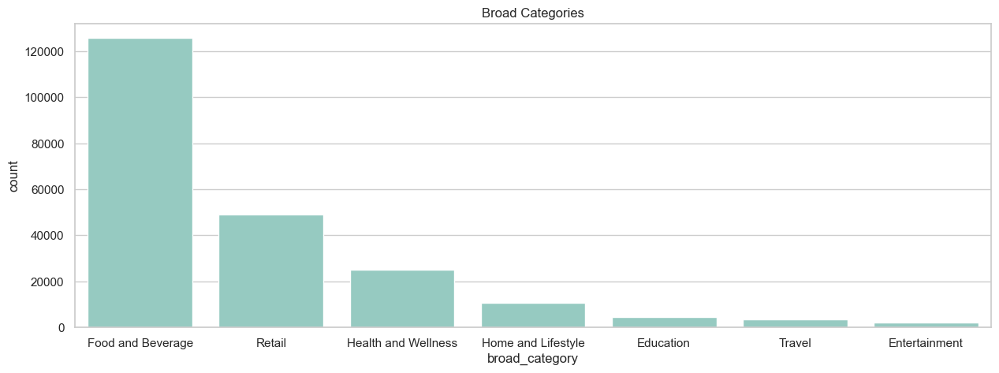

In [991]:
# Calculate counts of each broad_category
broad_category_value= df['broad_category'].value_counts()

# Create a sorted list of the broad_category by count for tablet users
broad_category_sorted = broad_category_value.index

# Create the count plot with sorted order for tablet users
plt.figure(figsize=(15, 5), facecolor='white')
sns.countplot(x='broad_category', data=df, order=broad_category_sorted)
plt.title('Broad Categories')
plt.xticks()
plt.show()

## **User Agent**

The user agent feature categorizes the device type used by customers for their transactions, primarily distinguishing between two types: phones and tablets. Within the phone category, devices are further divided into Android and iOS operating systems, while tablets are represented by iPads.

To gain deeper insights into this feature, I would like to extract additional details based on device type and OS version to determine whether the devices are considered old or new.

In [992]:
import re

# Function to extract OS type (Android or iPhone)
def extract_os(user_agent):
    if 'Android' in user_agent:
        return 'Android'
    elif 'iPhone' in user_agent or 'iPad' in user_agent:
        return 'iOS'
    else:
        return 'Other'

# Function to extract OS version
def extract_os_version(user_agent):
    android_version = re.search(r'Android (\d+(\.\d+)*)', user_agent)
    ios_version = re.search(r'OS (\d+(_\d+)*)', user_agent)
    
    if android_version:
        return android_version.group(1)  # Returns the Android version number
    elif ios_version:
        return ios_version.group(1).replace('_', '.')  # Returns the iOS version number, replacing underscores with dots
    else:
        return 'Unknown'

# Function to determine device type (Phone or Tablet)
def extract_device_type(user_agent):
    if 'iPad' in user_agent:
        return 'Tablet'
    elif 'iPhone' in user_agent or 'Android' in user_agent:
        return 'Phone'
    else:
        return 'Other'

# Applying the functions to create new features
df['os_type'] = df['user_agent'].apply(extract_os)
df['os_version'] = df['user_agent'].apply(extract_os_version)
df['device_type'] = df['user_agent'].apply(extract_device_type)

# Example of defining device age (new vs old based on OS version)
def device_age(version):
    # Convert versions to float or handle edge cases
    try:
        version = float(version.split('.')[0])
        if version >= 10:  # Example threshold for newer devices
            return 'New'
        else:
            return 'Old'
    except:
        return 'Unknown'

df['device_age'] = df['os_version'].apply(device_age)


The first step in this analysis is to determine any differences in consumption between phone users and tablet users. Therefore, I would like to create a visualization to compare these two factors based on the merchant_category ID.

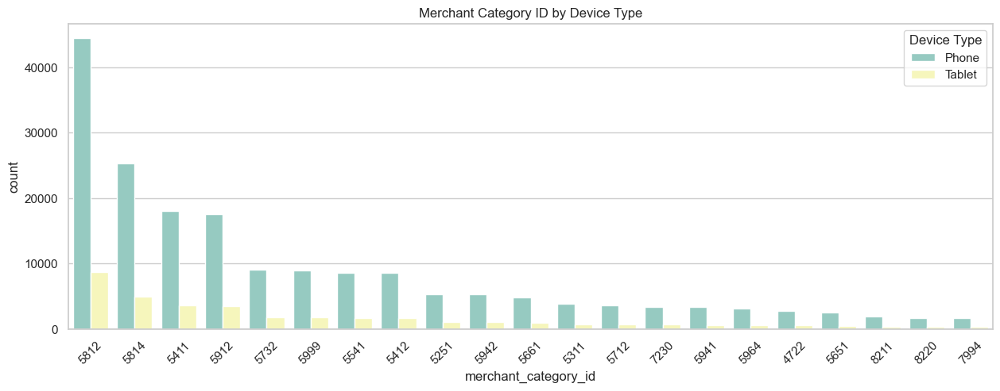

In [993]:
# Calculate counts of each merchant_category_id
merchant_counts = df['merchant_category_id'].value_counts()

# Create a sorted list of the merchant_category_id by count
sorted_categories = merchant_counts.index

# Create the count plot with sorted order and hue based on device_type
plt.figure(figsize=(15, 5), facecolor='white')
sns.countplot(x='merchant_category_id', data=df, order=sorted_categories, hue='device_type')
plt.title('Merchant Category ID by Device Type')
plt.xticks(rotation=45)
plt.legend(title='Device Type', loc='upper right')
plt.show()


From this bar chart, we can see that there is no difference in preference, as the sorting shows similarities. Therefore, we will not prioritize this feature too much and will explore the possibility of combining it with other factors.

## **Work/Home**

The dataset provides latitude and longitude for each transaction. Using this data, I aim to predict the home and work locations for each user. Here's my approach:

1. First, I utilize the `transaction_date` feature to determine whether a transaction occurred on a weekday or a weekend. I create a new column where `weekend = 1` and `weekday = 0`.
   
2. Next, I group the data by clusters based on the `is_weekend` column and calculate the mean value for each group. If the transactions occur predominantly on weekdays, it's likely the location represents their workplace. If the transactions mostly occur on weekends, it's likely to be their home or somewhere near their home.

In [994]:
# Create a new variable
df_folium = df

In [995]:
# Create a new column 'is_weekend' where 0 = weekday and 1 = weekend
df_folium['is_weekend'] = df_folium['transaction_date'].dt.dayofweek.apply(lambda x: 1 if x > 5 else 0)

# Display the updated DataFrame
df_folium.head(3)

,transaction_id,user_id,transaction_amount,transaction_date,merchant_id,merchant_name,merchant_category_id,category,broad_category,geo_location,payment_method,user_agent,loyalty_program,discount_applied,promo_amount,transaction_notes,merchant_rating,transaction_status,is_refunded,os_type,os_version,device_type,device_age,is_weekend
0,4a71b7d1-34fa-45cf-b40a-a730d16ce617,U10578,23500.0,2024-05-09,M04936,Cox Inc,5732,Electronics Stores,Retail,"-7.974781, 112.633863",balance,Android 9,no,no,0.0,no,5,completed,no,Android,9,Phone,Old,0
1,b29665c0-8373-4ec1-a121-a041c77ffb51,U08353,150500.0,2024-05-30,M06359,"King, Rice and Ramirez",5812,Eating Places and Restaurants,Food and Beverage,"-6.188155, 106.817086",balance,iPhone; CPU iPhone OS 3_1_3 like Mac OS X,no,no,0.0,yes,2,completed,no,iOS,3.1.3,Phone,Old,0
2,3e32187b-b374-4f1b-a64e-b1ebcc856563,U04564,65800.0,2024-03-08,M01710,"Lyons, Porter and Williams",5812,Eating Places and Restaurants,Food and Beverage,"-7.962043, 112.637274",credit_card,Android 2.0.1,no,no,0.0,no,3,completed,no,Android,2.0.1,Phone,Old,0


In [996]:
# Separate the latitude and longitude
df[['latitude', 'longitude']] = df['geo_location'].str.split(',', expand=True)
df['latitude'] = df['latitude'].astype(float)
df['longitude'] = df['longitude'].astype(float)
df.head()

,transaction_id,user_id,transaction_amount,transaction_date,merchant_id,merchant_name,merchant_category_id,category,broad_category,geo_location,payment_method,user_agent,loyalty_program,discount_applied,promo_amount,transaction_notes,merchant_rating,transaction_status,is_refunded,os_type,os_version,device_type,device_age,is_weekend,latitude,longitude
0,4a71b7d1-34fa-45cf-b40a-a730d16ce617,U10578,23500.0,2024-05-09,M04936,Cox Inc,5732,Electronics Stores,Retail,"-7.974781, 112.633863",balance,Android 9,no,no,0.0,no,5,completed,no,Android,9,Phone,Old,0,-7.974781,112.633863
1,b29665c0-8373-4ec1-a121-a041c77ffb51,U08353,150500.0,2024-05-30,M06359,"King, Rice and Ramirez",5812,Eating Places and Restaurants,Food and Beverage,"-6.188155, 106.817086",balance,iPhone; CPU iPhone OS 3_1_3 like Mac OS X,no,no,0.0,yes,2,completed,no,iOS,3.1.3,Phone,Old,0,-6.188155,106.817086
2,3e32187b-b374-4f1b-a64e-b1ebcc856563,U04564,65800.0,2024-03-08,M01710,"Lyons, Porter and Williams",5812,Eating Places and Restaurants,Food and Beverage,"-7.962043, 112.637274",credit_card,Android 2.0.1,no,no,0.0,no,3,completed,no,Android,2.0.1,Phone,Old,0,-7.962043,112.637274
3,df8ad42e-aaf6-46d2-8d8f-1e291a4554bd,U22797,45600.0,2024-05-14,M02852,Smith Ltd,5411,"Grocery Stores, Supermarkets",Food and Beverage,"-6.592793, 106.806543",balance,iPad; CPU iPad OS 9_3_5 like Mac OS X,no,no,0.0,no,3,completed,no,iOS,9.3.5,Tablet,Old,0,-6.592793,106.806543
4,334468df-4d71-4e4a-935c-32c17c306611,U18053,8500.0,2024-04-09,M00722,Bush Group,5411,"Grocery Stores, Supermarkets",Food and Beverage,"-6.269386, 106.979043",balance,Android 2.0.1,yes,no,0.0,no,4,completed,no,Android,2.0.1,Phone,Old,0,-6.269386,106.979043


In [997]:
# Group by user_id and is_weekend, then calculate the mean of latitude and longitude
grouped_df_folium = df_folium.groupby(['user_id', 'is_weekend']).agg(
    mean_latitude=('latitude', 'mean'),
    mean_longitude=('longitude', 'mean')
).reset_index()

# Display the grouped DataFrame
grouped_df_folium.head()

,user_id,is_weekend,mean_latitude,mean_longitude
0,U00001,0,-6.311689,106.814724
1,U00001,1,-6.203557,106.813459
2,U00002,0,-7.608149,112.690022
3,U00002,1,-7.258854,112.753964
4,U00003,0,-6.222149,106.864786


In [998]:
grouped_df_folium[grouped_df_folium['is_weekend']==1]

,user_id,is_weekend,mean_latitude,mean_longitude
1,U00001,1,-6.203557,106.813459
3,U00002,1,-7.258854,112.753964
5,U00003,1,-6.278574,106.973935
7,U00004,1,-6.342578,106.810639
9,U00005,1,-6.399103,106.803250
...,...,...,...,...
41911,U24314,1,-7.959962,112.624092
41913,U24315,1,-6.161632,106.646024
41916,U24317,1,-6.190229,106.816870
41918,U24318,1,-6.169706,106.641183


In [999]:
# Pivot the DataFrame to wide format
wide_df = grouped_df_folium.pivot_table(index='user_id', 
                                        columns='is_weekend', 
                                        values=['mean_latitude', 'mean_longitude'], 
                                        aggfunc='first')

# Flatten the MultiIndex columns with updated logic
wide_df.columns = [f"{col[0]}_home" if col[1] == 1 else f"{col[0]}_work" for col in wide_df.columns]

# Reset index to convert the MultiIndex DataFrame to a regular DataFrame
wide_df.reset_index(inplace=True)

# Display the result
wide_df


,user_id,mean_latitude_work,mean_latitude_home,mean_longitude_work,mean_longitude_home
0,U00001,-6.311689,-6.203557,106.814724,106.813459
1,U00002,-7.608149,-7.258854,112.690022,112.753964
2,U00003,-6.222149,-6.278574,106.864786,106.973935
3,U00004,-6.304743,-6.342578,106.811828,106.810639
4,U00005,-6.243645,-6.399103,106.770801,106.803250
...,...,...,...,...,...
24316,U24317,-6.321744,-6.190229,106.828839,106.816870
24317,U24318,-6.278418,-6.169706,106.838849,106.641183
24318,U24319,-6.291882,NaN,106.840714,NaN
24319,U24320,-7.610460,NaN,112.694864,NaN


In [1000]:
# wide_df.to_csv('wide.csv',index=False)

In [1001]:
import folium
from folium.plugins import MarkerCluster

# Create a map centered around a specific location 
indonesia_map = folium.Map(location=[-6.196639809431881, 106.82814470900495], zoom_start=11)

# Initialize a MarkerCluster object
marker_cluster = MarkerCluster().add_to(indonesia_map)

# Add markers for each listing in the DataFrame
for idx, row in grouped_df_folium[grouped_df_folium['is_weekend']==1].iterrows():
    folium.Marker(
        location=[row['mean_latitude'], row['mean_longitude']],
    ).add_to(marker_cluster)

# Display the map 
indonesia_map


Based on the Folium analysis, there are several significant clusters of transactions:

1. **Jabodetabek** – This region has the highest number of transactions.
2. **Surabaya** – Shows a significant cluster of transactions.
3. **Jogjakarta** – Exhibits a notable transaction cluster.
4. **Semarang** – Also displays a significant number of transactions.
5. **Malang** – Has a visible cluster of transactions.



## **User Feature**

In this analysis, I aimed to derive meaningful insights into user behavior and preferences from transaction data using various aggregation techniques. Below is a breakdown of the key features I generated for each user:

1. **Recency of Last Transaction**: I calculated the recency by identifying the last transaction date for each user and determining the number of days since that transaction. This metric helps to assess how recently a user has engaged with the platform.

2. **Frequency of Transactions**: I counted the total number of transactions made by each user to gauge user engagement and activity levels.

3. **Total Spending**: I summed the transaction amounts for each user to understand their overall spending behavior, providing insights into their purchasing power and investment in the platform.

4. **Average Transaction Amount**: By calculating the mean of the transaction amounts for each user, I gained insights into typical spending patterns, which can inform pricing strategies and promotional offers.

5. **Merchant Category Preferences**: I identified the most frequently transacted merchant category for each user by analyzing the category IDs associated with their transactions. This feature helps me understand user preferences and tailor marketing strategies accordingly.

6. **Loyalty Program Participation**: I evaluated the participation rate in loyalty programs by calculating the proportion of transactions where users indicated participation, providing insights into customer retention strategies.

7. **Promo Usage**: I assessed how often users utilize promotions by calculating the ratio of transactions where discounts were applied. Additionally, I summed the total promotional amounts to gauge the impact of promotions on spending behavior.

8. **Payment Method Preferences**: I analyzed the preferred payment method by calculating the proportion of transactions paid using the balance. This metric helps me understand user preferences for payment options.

9. **Merchant Rating**: I calculated the average rating given by users for merchants to understand user satisfaction and the perceived quality of services, which can inform partnership decisions.

10. **Refund Frequency**: I calculated the frequency of refunds for each user by determining the proportion of transactions that were refunded, highlighting potential issues with product satisfaction or service quality.

11. **Operating System Type**: I evaluated the proportion of users utilizing Android devices, providing insights into the demographic of users and informing mobile optimization strategies.

12. **Device Type**: My analysis of device types allowed me to understand how many users accessed the platform via mobile phones, aiding in targeted marketing efforts.

13. **Device Age**: I evaluated the proportion of users with new devices, which can indicate the likelihood of adopting new features and the overall tech-savvy nature of the user base.

All these metrics were compiled into a structured DataFrame named `user_features`, enabling further analysis and segmentation of users based on their behavior, preferences, and engagement levels. This information is crucial for informing business strategies, enhancing customer engagement, and optimizing marketing efforts.


In [1002]:
# Recency of Last Transaction 
last_transaction = df.groupby('user_id')['transaction_date'].max()
recency = (pd.Timestamp('2024-05-31') - last_transaction).dt.days

# Frequency of Transactions 
transaction_count = df.groupby('user_id')['transaction_id'].count()

# Total Spending for each user
total_spend = df.groupby('user_id')['transaction_amount'].sum()

# Average Transaction Amount
avg_transaction = df.groupby('user_id')['transaction_amount'].mean()

# Merchant Category Preferences 
top_category = df.groupby('user_id')['merchant_category_id'].agg(lambda x: x.value_counts().idxmax())

# Loyalty Program Participation
loyalty_participation = df.groupby('user_id')['loyalty_program'].apply(lambda x: (x == 'yes').mean())

# Promo Usage 
promo_usage = df.groupby('user_id')['discount_applied'].apply(lambda x: (x == 'yes').mean())
total_promo = df.groupby('user_id')['promo_amount'].sum()

# Payment Method Preferences
preferred_payment = df.groupby('user_id')['payment_method'].apply(lambda x: (x == 'balance').mean())

# Merchant Rating
avg_merchant_rating = df.groupby('user_id')['merchant_rating'].mean().round()

# Refund Frequency
refund_frequency = df.groupby('user_id')['is_refunded'].apply(lambda x: (x == 'yes').mean())

# os_type
os_type_user = df.groupby('user_id')['os_type'].apply(lambda x: (x == 'Android').mean())

# os_version
# os_version_user = df.groupby('user_id')['os_version'].unique()

# device_type
device_type_user = df.groupby('user_id')['device_type'].apply(lambda x: (x == 'Phone').mean())

# device_type
device_age_user = df.groupby('user_id')['device_age'].apply(lambda x: (x == 'New').mean())

user_features = pd.DataFrame({
    'recency': recency,
    'transaction_count': transaction_count,
    'total_spend': total_spend,
    'avg_transaction': avg_transaction,
    'top_category': top_category,
    'loyalty_participation': loyalty_participation,
    'promo_usage': promo_usage,
    'total_promo': total_promo,
    'preferred_payment': preferred_payment,
    'avg_merchant_rating': avg_merchant_rating,
    'refund_frequency': refund_frequency,
    'os_type_user':os_type_user,
    'device_type_user':device_type_user,
    'device_age_user':device_age_user
})


In [1003]:
user_features.shape

(24321, 14)

In [1004]:
df_folium[['user_id','is_weekend']]

,user_id,is_weekend
0,U10578,0
1,U08353,0
2,U04564,0
3,U22797,0
4,U18053,0
...,...,...
278925,U21453,0
278926,U09068,0
278929,U08210,0
278930,U17161,0


### **User feature + Weekend/Weekdays**

I will combine the user features with their transaction activity to differentiate between transactions made on weekdays and those made on weekends.

In [1005]:
pd.pivot_table(data=df, index='user_id',columns='is_weekend',values='transaction_id',aggfunc='count')

is_weekend,0,1
user_id,,
U00001,7.0,1.0
U00002,8.0,1.0
U00003,7.0,1.0
U00004,6.0,3.0
U00005,7.0,1.0
...,...,...
U24317,12.0,1.0
U24318,8.0,1.0
U24319,9.0,NaN


In [1006]:
user_features = user_features.merge(pd.pivot_table(data=df, index='user_id',columns='is_weekend',values='transaction_id',aggfunc='count'),on='user_id',how='left')
user_features.rename(columns={0: 'weekday', 1: 'weekend'}, inplace=True)
user_features.head(3)

,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend
user_id,,,,,,,,,,,,,,,,
U00001,19,8,307500.0,38437.500000,5712,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0
U00002,41,9,291800.0,32422.222222,5812,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0
U00003,10,8,517700.0,64712.500000,5814,1.0,0.0,0.0,0.875000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0


### **User feature + All top categories**
In this process, I analyzed the merchant category preferences for each user by grouping the transaction data by user ID and counting the occurrences of each merchant category.

- Counting Merchant Categories: I created a DataFrame that lists the user ID, merchant category ID, and the count of transactions for each category.

- Sorting: I sorted this DataFrame by user ID and transaction count in descending order to identify the most frequently used merchant categories for each user.

- Creating a List of Categories: I then pivoted the data to compile a list of all merchant categories for each user.

- Merging with User Features: Finally, I joined this list back to the existing user_features DataFrame, renaming the column to all_top_categories to provide a comprehensive view of each user's merchant category preferences.

This integrated approach enhances the user feature set, allowing for better analysis of user behavior and preferences.



In [1007]:
# Merchant Category Preferences with All MCCs
merchant_categories = df.groupby('user_id')['merchant_category_id'].apply(lambda x: x.value_counts()).reset_index()
merchant_categories.columns = ['user_id', 'merchant_category_id', 'count']

# Sort by user_id and count to get most frequent MCCs for each user
merchant_categories = merchant_categories.sort_values(['user_id', 'count'], ascending=[True, False])

# Pivot the data to get the MCCs as a list for each user
merchant_categories_list = merchant_categories.groupby('user_id')['merchant_category_id'].apply(list).reset_index()

# Join this list back to the user_features DataFrame
user_features = user_features.merge(merchant_categories_list, on='user_id', how='left')
user_features.rename(columns={'merchant_category_id': 'all_top_categories'}, inplace=True)


### **Pivot Table Dataframe**

In this process, I aimed to analyze the distribution of merchant categories across predefined broad categories for each user.

- Defining Custom Category Order: I established a custom order for the broad categories, prioritizing them from primary necessities (like Food and Beverage) to tertiary categories (like Travel).

- Creating the Pivot Table: I constructed a pivot table using the transaction data, indexing by user ID and using the broad category as columns. The values represented the count of transactions for each merchant category, with missing values filled with zeros.

- Reordering Columns: I rearranged the columns of the pivot table based on the predefined custom category order to facilitate a clearer analysis.

- Displaying the Sorted Pivot Table: Finally, I displayed the sorted pivot table, which provides a structured view of user engagement across the different broad categories.

This pivot table allows for effective visualization and analysis of user preferences within various broad categories.

In [1008]:
# Define custom order of broad categories (primary necessities to tertiary)
category_order = ['Food and Beverage', 'Health and Wellness', 'Home and Lifestyle', 'Retail', 'Entertainment', 'Education', 'Travel']

# Create the pivot table
pivot_table = pd.pivot_table(df, index='user_id', columns='broad_category', values='merchant_category_id', aggfunc='count', fill_value=0)

# Reorder the columns based on the custom order
pivot_table = pivot_table[category_order]

# Display the sorted pivot table
pivot_table

broad_category,Food and Beverage,Health and Wellness,Home and Lifestyle,Retail,Entertainment,Education,Travel
user_id,,,,,,,
U00001,2,1,1,2,0,2,0
U00002,8,0,0,0,0,0,1
U00003,5,1,0,1,1,0,0
U00004,5,0,1,1,1,1,0
U00005,3,1,0,3,0,1,0
...,...,...,...,...,...,...,...
U24317,6,5,0,2,0,0,0
U24318,7,1,1,0,0,0,0
U24319,7,1,0,1,0,0,0


In [1009]:
user_features.columns

Index(['user_id', 'recency', 'transaction_count', 'total_spend',
       'avg_transaction', 'top_category', 'loyalty_participation',
       'promo_usage', 'total_promo', 'preferred_payment',
       'avg_merchant_rating', 'refund_frequency', 'os_type_user',
       'device_type_user', 'device_age_user', 'weekday', 'weekend',
       'all_top_categories'],
      dtype='object')

## **Clustering Preparation**

I conducted clustering analysis by performing Principal Component Analysis (PCA) to identify the optimal number of components based on the cumulative sum variance graph. I determined that the best number of components is **8**.


**Key Features Identified from PCA Coefficients**

The following features were identified as the most important based on their coefficient variance:

| Feature                  | Coefficient |
|--------------------------|-------------|
| Transaction Count        | 0.500350    |
| Total Spend              | 0.447805    |
| Promo Usage              | 0.437287    |
| Food and Beverage        | 0.396544    |
| Recency                  | 0.319332    |
| Retail                   | 0.222093    |
| Total Promo              | 0.126128    |
| Average Transaction       | 0.110822    |
| Home and Lifestyle       | 0.098244    |
| Health and Wellness      | 0.095840    |

Clustering Decision

Recognizing the significance of **Transaction Count** and **Total Spend** as the top two features, I decided to utilize these metrics to define income levels for clustering. I then applied the K-Means algorithm and, based on the elbow method score, concluded that the data should be clustered into **5 groups**.


In [1010]:
# Combine data of pivot_table and user_features
merged_df = pivot_table.reset_index().merge(
    user_features[['user_id', 'recency', 'transaction_count', 'total_spend',
       'avg_transaction', 'top_category', 'loyalty_participation',
       'promo_usage', 'total_promo', 'preferred_payment',
       'avg_merchant_rating', 'refund_frequency', 'os_type_user',
       'device_type_user', 'device_age_user', 'weekday', 'weekend',
       'all_top_categories']],
    on='user_id',
    how='left'  
)

# Display the merged DataFrame
# merged_df.drop(columns='index',inplace=True)
merged_df.set_index('user_id',inplace= True)

In [1011]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24321 entries, U00001 to U24321
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Food and Beverage      24321 non-null  int64  
 1   Health and Wellness    24321 non-null  int64  
 2   Home and Lifestyle     24321 non-null  int64  
 3   Retail                 24321 non-null  int64  
 4   Entertainment          24321 non-null  int64  
 5   Education              24321 non-null  int64  
 6   Travel                 24321 non-null  int64  
 7   recency                24321 non-null  int64  
 8   transaction_count      24321 non-null  int64  
 9   total_spend            24321 non-null  float64
 10  avg_transaction        24321 non-null  float64
 11  top_category           24321 non-null  object 
 12  loyalty_participation  24321 non-null  float64
 13  promo_usage            24321 non-null  float64
 14  total_promo            24321 non-null  float64
 15  p

In [1012]:
# Drop column all_top_category
merged_df.drop(columns='all_top_categories',inplace=True)

# Drop colum top_category
merged_df.drop(columns='top_category',inplace=True)

In [1013]:
for i in ['refund_frequency', 'os_type_user', 'device_type_user', 'device_age_user']:
    print(f"Unique values of {i} are {merged_df[i].unique()}")


Unique values of refund_frequency are [0.         0.11111111 0.125      0.16666667 0.07692308 0.375
 0.1        0.18181818 0.08333333 0.28571429 0.14285714 0.0625
 0.06666667 0.13333333 0.09090909 0.07142857 0.22222222 0.15384615
 0.25       0.2        0.05882353 0.30769231 0.33333333 0.3
 0.04761905 0.05555556 0.05263158 0.27272727 0.42857143 0.5
 0.10526316 0.23076923 0.4        0.05       0.04       0.1875
 0.21428571 0.36363636 0.44444444 0.23529412 0.17647059 0.15
 0.15789474 0.11764706 0.35714286 0.29411765 0.04545455 0.21052632
 1.         0.04166667 0.08695652 0.38461538]
Unique values of os_type_user are [1. 0.]
Unique values of device_type_user are [1. 0.]
Unique values of device_age_user are [0. 1.]


In [1014]:
# Divide feature numeric vs categoric
num_feature_merged_df = merged_df.describe().columns
print('Numeric features : ')
print(num_feature_merged_df)

cat_feature_merged_df = [fea for fea in merged_df.columns if fea not in num_feature_merged_df] 
print('Categoric features :')
print(cat_feature_merged_df)

Numeric features : 
Index(['Food and Beverage', 'Health and Wellness', 'Home and Lifestyle',
       'Retail', 'Entertainment', 'Education', 'Travel', 'recency',
       'transaction_count', 'total_spend', 'avg_transaction',
       'loyalty_participation', 'promo_usage', 'total_promo',
       'preferred_payment', 'avg_merchant_rating', 'refund_frequency',
       'os_type_user', 'device_type_user', 'device_age_user', 'weekday',
       'weekend'],
      dtype='object')
Categoric features :
[]


In [1015]:
merged_df['weekend'].fillna(0, inplace=True)
merged_df['weekday'].fillna(0, inplace = True)


C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\1871991029.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_df['weekend'].fillna(0, inplace=True)
C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\1871991029.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For exa

In [1016]:
merged_df.isna().sum()

Food and Beverage        0
Health and Wellness      0
Home and Lifestyle       0
Retail                   0
Entertainment            0
Education                0
Travel                   0
recency                  0
transaction_count        0
total_spend              0
avg_transaction          0
loyalty_participation    0
promo_usage              0
total_promo              0
preferred_payment        0
avg_merchant_rating      0
refund_frequency         0
os_type_user             0
device_type_user         0
device_age_user          0
weekday                  0
weekend                  0
dtype: int64

In [1017]:
user_features['refund_frequency'].unique()

array([0.        , 0.11111111, 0.125     , 0.16666667, 0.07692308,
       0.375     , 0.1       , 0.18181818, 0.08333333, 0.28571429,
       0.14285714, 0.0625    , 0.06666667, 0.13333333, 0.09090909,
       0.07142857, 0.22222222, 0.15384615, 0.25      , 0.2       ,
       0.05882353, 0.30769231, 0.33333333, 0.3       , 0.04761905,
       0.05555556, 0.05263158, 0.27272727, 0.42857143, 0.5       ,
       0.10526316, 0.23076923, 0.4       , 0.05      , 0.04      ,
       0.1875    , 0.21428571, 0.36363636, 0.44444444, 0.23529412,
       0.17647059, 0.15      , 0.15789474, 0.11764706, 0.35714286,
       0.29411765, 0.04545455, 0.21052632, 1.        , 0.04166667,
       0.08695652, 0.38461538])

In [1018]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import RobustScaler


# Define the ColumnTransformer
Transformer = ColumnTransformer([
    ('robust', RobustScaler(), ['Food and Beverage', 'Health and Wellness', 'Home and Lifestyle', 'Retail', 'Entertainment', 
                                     'Education', 'Travel', 'recency','transaction_count', 'total_spend', 'avg_transaction',
                                     'total_promo', 'weekday','weekend'])], remainder='passthrough') 


# Apply the ColumnTransformer to merged_df
transformed_data = Transformer.fit_transform(merged_df)

### **PCA**

<function matplotlib.pyplot.show(close=None, block=None)>

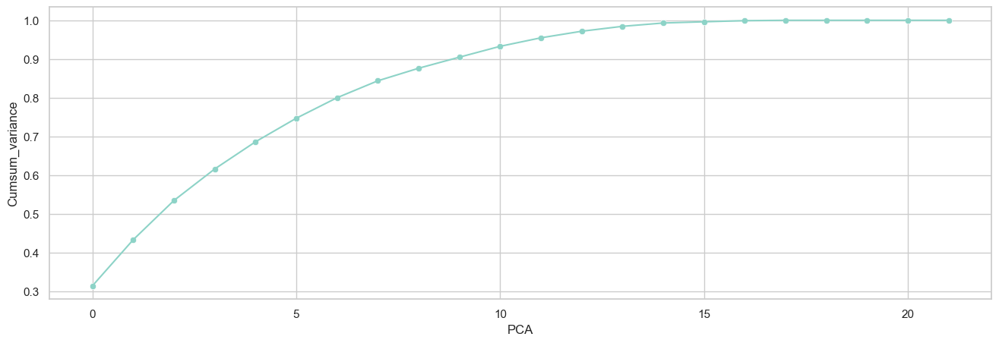

In [1019]:
from sklearn.decomposition import PCA

# define PCA 
pca = PCA()

# fit to data 
pca.fit(transformed_data)

# transform 
pca.transform(transformed_data)

df_pca = pd.DataFrame()
df_pca ['PCA'] = range(len(merged_df.columns))
df_pca ['Variance'] = pca.explained_variance_ratio_
df_pca ['Cumsum_variance'] = pca.explained_variance_ratio_.cumsum()
df_pca


# PCA Visualization based on Cumsum_variance
plt.figure(figsize=(16,5))
sns.scatterplot(data = df_pca, x='PCA', y = 'Cumsum_variance')
sns.lineplot(data = df_pca, x='PCA', y = 'Cumsum_variance')

plt.show

In [1020]:
df_importance = pd.DataFrame()
df_importance['feature'] = merged_df.columns
df_importance['coef'] = np.absolute(pca.components_[0]) 

df_importance.sort_values(by='coef',ascending=False).head(10)

,feature,coef
8,transaction_count,0.500350
9,total_spend,0.447805
12,promo_usage,0.437287
0,Food and Beverage,0.396544
7,recency,0.319332
3,Retail,0.222093
13,total_promo,0.126128
10,avg_transaction,0.110822
2,Home and Lifestyle,0.098244
1,Health and Wellness,0.095840


In [1021]:
# Implement the PCA
pca_ncom = PCA(n_components=6)

# fitting
pca_ncom = pca_ncom.fit_transform(transformed_data)
pca_ncom

array([[-0.94245435,  0.1270625 ,  0.31947888,  0.68154662,  0.75514283,
        -0.40059175],
       [-0.9834206 ,  0.75025732,  2.405475  , -1.28971483, -0.304818  ,
         0.06603982],
       [ 0.02233406,  1.23066873, -0.91096283, -0.49684577, -0.29691787,
        -0.50548613],
       ...,
       [-0.6950728 ,  0.12225321,  1.72924135, -0.70415566, -0.35184466,
        -0.50658119],
       [ 2.56826212, -0.18546857,  0.48686112, -1.2658038 ,  1.34378993,
        -0.42485897],
       [-1.32480749, -1.0384739 ,  0.64965895, -0.33855906,  0.62581068,
         0.1573123 ]])

### **Kmeans**

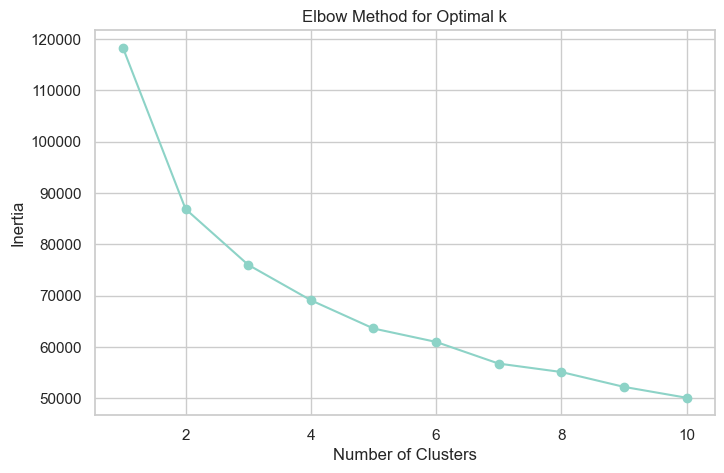

In [1022]:
from sklearn.cluster import KMeans


# Determine the optimal number of clusters using the Elbow Method
inertia = []
k_range = range(1, 11)  # Test for 1 to 10 clusters
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_ncom)
    inertia.append(kmeans.inertia_)

# Plot the Elbow graph
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()


In [1023]:
# Fit K-Means with the optimal number of clusters
optimal_k = 5
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
merged_df['cluster_1'] = kmeans.fit_predict(transformed_data)

In [1024]:
merged_df

,Food and Beverage,Health and Wellness,Home and Lifestyle,Retail,Entertainment,Education,Travel,recency,transaction_count,total_spend,avg_transaction,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,cluster_1
user_id,,,,,,,,,,,,,,,,,,,,,,,
U00001,2,1,1,2,0,2,0,19,8,307500.0,38437.500000,0.0,0.000000,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,4
U00002,8,0,0,0,0,0,1,41,9,291800.0,32422.222222,0.0,0.000000,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,0
U00003,5,1,0,1,1,0,0,10,8,517700.0,64712.500000,1.0,0.000000,0.0,0.875000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,2
U00004,5,0,1,1,1,1,0,19,9,430800.0,47866.666667,0.0,0.000000,0.0,1.000000,3.0,0.000000,1.0,1.0,0.0,6.0,3.0,2
U00005,3,1,0,3,0,1,0,37,8,283600.0,35450.000000,0.0,0.000000,0.0,0.875000,4.0,0.125000,1.0,1.0,0.0,7.0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U24317,6,5,0,2,0,0,0,24,13,446400.0,34338.461538,0.0,0.000000,0.0,0.769231,4.0,0.000000,0.0,1.0,0.0,12.0,1.0,1
U24318,7,1,1,0,0,0,0,5,9,347000.0,38555.555556,0.0,0.000000,0.0,0.666667,4.0,0.000000,1.0,1.0,0.0,8.0,1.0,1
U24319,7,1,0,1,0,0,0,30,9,273600.0,30400.000000,0.0,0.111111,0.0,0.666667,4.0,0.000000,1.0,1.0,0.0,9.0,0.0,0


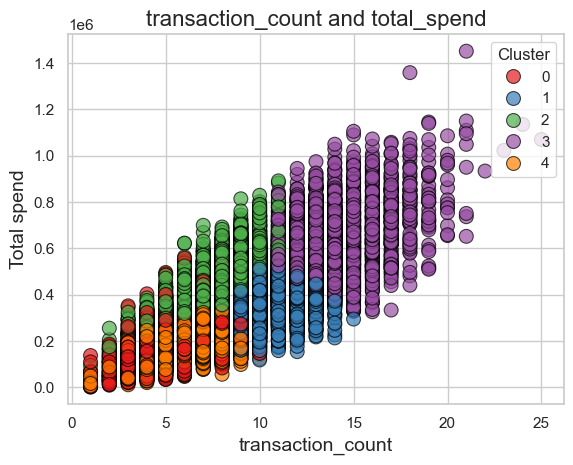

In [1025]:
# Scatter plot of the first two PCA components
sns.scatterplot(
    x='transaction_count', 
    y='total_spend', 
    hue='cluster_1',  # Cluster labels
    palette='Set1',  # Choose a color palette
    data=merged_df,
    s=100,  # Size of the points
    alpha=0.7,  # Transparency
    edgecolor='black'  # Border color
)

# Add titles and labels
plt.title('transaction_count and total_spend', fontsize=16)
plt.xlabel('transaction_count', fontsize=14)
plt.ylabel('Total spend', fontsize=14)
plt.legend(title='Cluster', loc='upper right')
plt.grid(True)

# Show plot
plt.show()

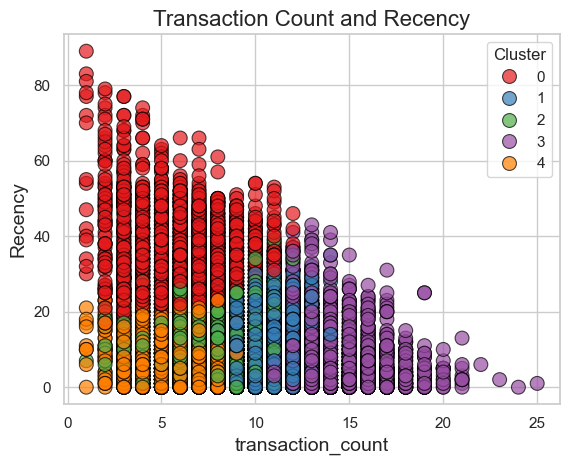

In [1026]:
# Scatter plot of the first two PCA components
sns.scatterplot(
    x='transaction_count', 
    y='recency', 
    hue='cluster_1',  # Cluster labels
    palette='Set1',  # Choose a color palette
    data=merged_df,
    s=100,  # Size of the points
    alpha=0.7,  # Transparency
    edgecolor='black'  # Border color
)

# Add titles and labels
plt.title('Transaction Count and Recency', fontsize=16)
plt.xlabel('transaction_count', fontsize=14)
plt.ylabel('Recency', fontsize=14)
plt.legend(title='Cluster', loc='upper right')
plt.grid(True)

# Show plot
plt.show()

In [1027]:
merged_df.head()

,Food and Beverage,Health and Wellness,Home and Lifestyle,Retail,Entertainment,Education,Travel,recency,transaction_count,total_spend,avg_transaction,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,cluster_1
user_id,,,,,,,,,,,,,,,,,,,,,,,
U00001,2,1,1,2,0,2,0,19,8,307500.0,38437.500000,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,4
U00002,8,0,0,0,0,0,1,41,9,291800.0,32422.222222,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,0
U00003,5,1,0,1,1,0,0,10,8,517700.0,64712.500000,1.0,0.0,0.0,0.875000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,2
U00004,5,0,1,1,1,1,0,19,9,430800.0,47866.666667,0.0,0.0,0.0,1.000000,3.0,0.000000,1.0,1.0,0.0,6.0,3.0,2
U00005,3,1,0,3,0,1,0,37,8,283600.0,35450.000000,0.0,0.0,0.0,0.875000,4.0,0.125000,1.0,1.0,0.0,7.0,1.0,0


In [1028]:
merged_df.columns

Index(['Food and Beverage', 'Health and Wellness', 'Home and Lifestyle',
       'Retail', 'Entertainment', 'Education', 'Travel', 'recency',
       'transaction_count', 'total_spend', 'avg_transaction',
       'loyalty_participation', 'promo_usage', 'total_promo',
       'preferred_payment', 'avg_merchant_rating', 'refund_frequency',
       'os_type_user', 'device_type_user', 'device_age_user', 'weekday',
       'weekend', 'cluster_1'],
      dtype='object')

In [1029]:
# Explore how each feature behaves in the clusters
feature_columns = ['Food and Beverage', 'Health and Wellness', 'Home and Lifestyle',
       'Retail', 'Entertainment', 'Education', 'Travel', 'recency',
       'transaction_count', 'total_spend', 'avg_transaction','preferred_payment']
cluster_analysis = merged_df.groupby('cluster_1')[feature_columns].median()
cluster_analysis


,Food and Beverage,Health and Wellness,Home and Lifestyle,Retail,Entertainment,Education,Travel,recency,transaction_count,total_spend,avg_transaction,preferred_payment
cluster_1,,,,,,,,,,,,
0,3.0,1.0,0.0,1.0,0.0,0.0,0.0,32.0,6.0,250100.0,40433.333333,0.800000
1,6.0,1.0,0.0,2.0,0.0,0.0,0.0,6.0,10.0,375300.0,37000.000000,0.800000
2,5.0,1.0,0.0,2.0,0.0,0.0,0.0,8.0,8.0,441800.0,55416.666667,0.800000
3,8.0,1.0,0.0,3.0,0.0,0.0,0.0,4.0,13.0,601800.0,46613.333333,0.812500
4,4.0,1.0,0.0,1.0,0.0,0.0,0.0,7.0,7.0,222950.0,34269.047619,0.833333


## **Income Analysis**

1. **Cluster 0**
   - **Spending Patterns:** Moderate total spend (250,100) with an average transaction of 40,433.33.
   - **Categories:** Higher spending in Food and Beverage (3) and Retail (1) suggests a balanced lifestyle with some focus on dining out.
   - **Income Level:** This cluster might represent a lower-middle to middle-income level, as they are spending moderately but not extensively across categories.

2. **Cluster 1**
   - **Spending Patterns:**  total spend (375,300) and an average transaction of 37,000.
   - **Categories:** Similar to Cluster 0, with higher transactions in Food and Beverage (6) and Retail (2).
   - **Income Level:** Likely represents a middle-income level, as their spending indicates more disposable income for discretionary purchases.

3. **Cluster 2**
   - **Spending Patterns:** Total spend of 441,800, with an average transaction of 55,475.00.
   - **Categories:** Focused on Food and Beverage (5) and Retail (2), indicating a preference for quality over quantity.
   - **Income Level:** This cluster appears to represent a middle to upper-middle-income level, with a willingness to spend more per transaction, suggesting higher disposable income.

4. **Cluster 3**
   - **Spending Patterns:** Highest total spend (601,800) and an average transaction of 46,613.33.
   - **Categories:** Highest activity in Food and Beverage (8) and Retail (3).
   - **Income Level:** Likely indicates an upper-middle to upper-income level, reflecting significant discretionary spending and a lifestyle that values experiences and products.

5. **Cluster 4**
   - **Spending Patterns:** Lower total spend (222,950) with an average transaction of 34,271.43.
   - **Categories:** Moderate spending in Food and Beverage (4) and Retail (1).
   - **Income Level:** This cluster could represent a lower-middle-income level, as their total spend and transaction frequency suggest a more cautious approach to spending.

Summary
- **Lower-Middle Income:** Cluster 0 and Cluster 4
- **Middle Income:** Cluster 1
- **Middle to Upper-Middle Income:** Cluster 2
- **Upper-Middle to Upper Income:** Cluster 3


In [1030]:
# Create a mapping dictionary
cluster_mapping = {
    0: 'Lower',
    1: 'Middle',
    2: 'Up_Middle',
    3: 'High',
    4: 'Lower'
}

# Apply the mapping to create a new column
merged_df['Income_Level'] = merged_df['cluster_1'].map(cluster_mapping)

# Display the updated DataFrame
merged_df

,Food and Beverage,Health and Wellness,Home and Lifestyle,Retail,Entertainment,Education,Travel,recency,transaction_count,total_spend,avg_transaction,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,cluster_1,Income_Level
user_id,,,,,,,,,,,,,,,,,,,,,,,,
U00001,2,1,1,2,0,2,0,19,8,307500.0,38437.500000,0.0,0.000000,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,4,Lower
U00002,8,0,0,0,0,0,1,41,9,291800.0,32422.222222,0.0,0.000000,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,0,Lower
U00003,5,1,0,1,1,0,0,10,8,517700.0,64712.500000,1.0,0.000000,0.0,0.875000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,2,Up_Middle
U00004,5,0,1,1,1,1,0,19,9,430800.0,47866.666667,0.0,0.000000,0.0,1.000000,3.0,0.000000,1.0,1.0,0.0,6.0,3.0,2,Up_Middle
U00005,3,1,0,3,0,1,0,37,8,283600.0,35450.000000,0.0,0.000000,0.0,0.875000,4.0,0.125000,1.0,1.0,0.0,7.0,1.0,0,Lower
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U24317,6,5,0,2,0,0,0,24,13,446400.0,34338.461538,0.0,0.000000,0.0,0.769231,4.0,0.000000,0.0,1.0,0.0,12.0,1.0,1,Middle
U24318,7,1,1,0,0,0,0,5,9,347000.0,38555.555556,0.0,0.000000,0.0,0.666667,4.0,0.000000,1.0,1.0,0.0,8.0,1.0,1,Middle
U24319,7,1,0,1,0,0,0,30,9,273600.0,30400.000000,0.0,0.111111,0.0,0.666667,4.0,0.000000,1.0,1.0,0.0,9.0,0.0,0,Lower


In [1031]:
user_features = user_features.merge(merged_df.reset_index()[['user_id','Income_Level']],on='user_id',how='left')
user_features.head(3)

,user_id,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level
0,U00001,19,8,307500.0,38437.500000,5712,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower
1,U00002,41,9,291800.0,32422.222222,5812,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower
2,U00003,10,8,517700.0,64712.500000,5814,1.0,0.0,0.0,0.875000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5814, 5812, 5912, 5964, 5411, 7994]",Up_Middle


In [1032]:
merged_df.head()

,Food and Beverage,Health and Wellness,Home and Lifestyle,Retail,Entertainment,Education,Travel,recency,transaction_count,total_spend,avg_transaction,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,cluster_1,Income_Level
user_id,,,,,,,,,,,,,,,,,,,,,,,,
U00001,2,1,1,2,0,2,0,19,8,307500.0,38437.500000,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,4,Lower
U00002,8,0,0,0,0,0,1,41,9,291800.0,32422.222222,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,0,Lower
U00003,5,1,0,1,1,0,0,10,8,517700.0,64712.500000,1.0,0.0,0.0,0.875000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,2,Up_Middle
U00004,5,0,1,1,1,1,0,19,9,430800.0,47866.666667,0.0,0.0,0.0,1.000000,3.0,0.000000,1.0,1.0,0.0,6.0,3.0,2,Up_Middle
U00005,3,1,0,3,0,1,0,37,8,283600.0,35450.000000,0.0,0.0,0.0,0.875000,4.0,0.125000,1.0,1.0,0.0,7.0,1.0,0,Lower


In [1033]:
merged_df.groupby('cluster_1')['Health and Wellness'].sum()

cluster_1
0    2014
1    7732
2    4732
3    6294
4    4344
Name: Health and Wellness, dtype: int64

In [1034]:
df_age = df.merge(merged_df.reset_index()[['user_id','cluster_1']],on='user_id',how='left')

## **Vehicle Ownership**

In the user_features, there is 5541 when i check it is  refers to Service Stations (with or without ancillary services). This category typically includes establishments such as gas stations that may offer fuel, convenience store items, and possibly other services like car washes or repairs. So we can take conclusion that they has vehicle wonership 


In [1035]:
# Define the condition parental status
user_features['vehicle_ownership'] = user_features['all_top_categories'].apply(lambda x: 1 if '5541' in x  else 0)


In [1036]:
user_features

,user_id,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level,vehicle_ownership
0,U00001,19,8,307500.0,38437.500000,5712,0.0,0.000000,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower,1
1,U00002,41,9,291800.0,32422.222222,5812,0.0,0.000000,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower,1
2,U00003,10,8,517700.0,64712.500000,5814,1.0,0.000000,0.0,0.875000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5814, 5812, 5912, 5964, 5411, 7994]",Up_Middle,0
3,U00004,19,9,430800.0,47866.666667,5812,0.0,0.000000,0.0,1.000000,3.0,0.000000,1.0,1.0,0.0,6.0,3.0,"[5812, 5661, 8220, 5814, 5251, 7994, 5412]",Up_Middle,0
4,U00005,37,8,283600.0,35450.000000,5311,0.0,0.000000,0.0,0.875000,4.0,0.125000,1.0,1.0,0.0,7.0,1.0,"[5311, 5912, 8211, 5999, 5812, 5732, 5412, 5814]",Lower,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24316,U24317,24,13,446400.0,34338.461538,5912,0.0,0.000000,0.0,0.769231,4.0,0.000000,0.0,1.0,0.0,12.0,1.0,"[5912, 5812, 7230, 5412, 5311, 5814, 5411, 5651]",Middle,0
24317,U24318,5,9,347000.0,38555.555556,5812,0.0,0.000000,0.0,0.666667,4.0,0.000000,1.0,1.0,0.0,8.0,1.0,"[5812, 5814, 5912, 5411, 5251]",Middle,0
24318,U24319,30,9,273600.0,30400.000000,5812,0.0,0.111111,0.0,0.666667,4.0,0.000000,1.0,1.0,0.0,9.0,NaN,"[5812, 5411, 5814, 5912, 5732]",Lower,0
24319,U24320,4,14,599700.0,42835.714286,5812,0.0,0.000000,0.0,0.714286,3.0,0.000000,1.0,1.0,0.0,14.0,NaN,"[5812, 5814, 5411, 5999, 5251, 5712, 5412]",High,0


## **AGE**

In [1037]:
df_user_mcc = pd.pivot_table(data=df, index='user_id', columns=  'merchant_category_id', values='transaction_id', aggfunc= 'count' )

In [1038]:
df_user_mcc.fillna(0,inplace=True)

In [1039]:
merged_df.columns

Index(['Food and Beverage', 'Health and Wellness', 'Home and Lifestyle',
       'Retail', 'Entertainment', 'Education', 'Travel', 'recency',
       'transaction_count', 'total_spend', 'avg_transaction',
       'loyalty_participation', 'promo_usage', 'total_promo',
       'preferred_payment', 'avg_merchant_rating', 'refund_frequency',
       'os_type_user', 'device_type_user', 'device_age_user', 'weekday',
       'weekend', 'cluster_1', 'Income_Level'],
      dtype='object')

In [1040]:
df_group_age = merged_df[['recency','transaction_count','preferred_payment']]
df_group_age = df_group_age.merge(df_user_mcc, on ='user_id',how ='left')

### **Clustering Preparation**

In [1041]:
df_group_age.columns

Index(['recency', 'transaction_count', 'preferred_payment', '4722', '5251',
       '5311', '5411', '5412', '5541', '5651', '5661', '5712', '5732', '5812',
       '5814', '5912', '5941', '5942', '5964', '5999', '7230', '7994', '8211',
       '8220'],
      dtype='object')

In [1042]:

# Define the ColumnTransformer
Transformer = ColumnTransformer([
    ('robust', RobustScaler(), ['recency', 'transaction_count','4722', '5251', '5311', '5411', '5412', '5541', '5651', '5661', '5712',
       '5732', '5812', '5814', '5912', '5941', '5942', '5964', '5999', '7230',
       '7994', '8211', '8220'])], remainder='passthrough') 


# Apply the ColumnTransformer to merged_df
transformed_data = Transformer.fit_transform(df_group_age)

### **PCA Age**

I categorized age groups following the statistics from OJK (Otoritas Jasa Keuangan) on financial literacy and inclusion rates across different age groups in Indonesia:

| **Age Group (Years)** | **Financial Literacy (%)** | **Financial Inclusion (%)** |
|-----------------------|----------------------------|-----------------------------|
| 15-17                 | 51.70                      | 57.96                       |
| 18-25                 | 70.19                      | 79.21                       |
| 26-35                 | 74.82                      | 84.28                       |
| 36-50                 | 71.72                      | 81.51                       |
| 51-79                 | 52.51                      | 63.53                       |

Additionally, I referenced information from *Kontan* indicating that the majority of Dana's users are in the **25-34** age group. 

**Process Overview:**
1. **Data Preparation:**
   - Created a DataFrame with the following key features:
     - `transaction_count`
     - `recency`
     - `total_transaction` for each merchant

2. **PCA Analysis:**
   - Similar to previous clustering, I ran a PCA on the dataset to reduce dimensionality and identify key components.

3. **Clustering:**
   - I plotted a scatter plot comparing `transaction_count` and `recency`.
   - From the analysis, the optimal number of clusters was found to be **5**, representing the different age groups.

### **Cluster Mapping:**
Each cluster is mapped to an age group:
   - **Cluster 0**: Age group **51-79**
   - **Cluster 1**: Age group **18-25**
   - **Cluster 2**: Age group **15-17**
   - **Cluster 3**: Age group **26-35**
   - **Cluster 4**: Age group **36-50**

<function matplotlib.pyplot.show(close=None, block=None)>

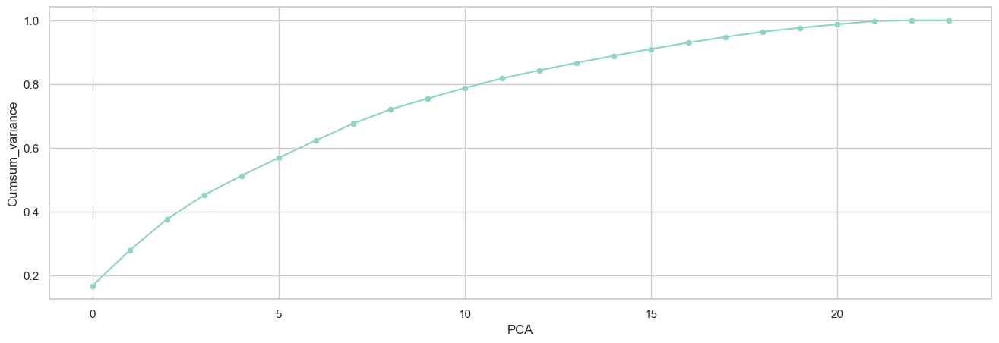

In [1043]:
from sklearn.decomposition import PCA

# define PCA 
pca = PCA()

# fit to data 
pca.fit(transformed_data)

# transform 
pca.transform(transformed_data)

df_pca = pd.DataFrame()
df_pca ['PCA'] = range(len(df_group_age.columns))
df_pca ['Variance'] = pca.explained_variance_ratio_
df_pca ['Cumsum_variance'] = pca.explained_variance_ratio_.cumsum()
df_pca


# PCA Visualization based on Cumsum_variance
plt.figure(figsize=(16,5))
sns.scatterplot(data = df_pca, x='PCA', y = 'Cumsum_variance')
sns.lineplot(data = df_pca, x='PCA', y = 'Cumsum_variance')

plt.show

In [1044]:
df_importance = pd.DataFrame()
df_importance['feature'] = df_group_age.columns
df_importance['coef'] = np.absolute(pca.components_[0]) 

df_importance.sort_values(by='coef',ascending=False).head(10)

,feature,coef
1,transaction_count,0.562884
0,recency,0.518904
5,5311,0.410455
14,5814,0.335822
12,5732,0.273426
13,5812,0.116213
11,5712,0.095879
18,5964,0.092323
7,5412,0.088134
6,5411,0.084605


In [1045]:
# Implement the PCA
pca_ncom = PCA(n_components=8)

# fitting
pca_ncom = pca_ncom.fit_transform(transformed_data)
pca_ncom

array([[ 0.94743256, -0.67297438,  0.15454754, ...,  0.07469027,
        -0.1702849 , -0.7440911 ],
       [ 1.43034073,  0.83985808,  0.64567474, ...,  0.02541849,
         1.36476121, -1.146001  ],
       [ 0.1936469 ,  0.0347943 ,  0.27745506, ...,  0.0362473 ,
        -0.12438515, -0.02950235],
       ...,
       [ 0.23519089,  0.8944721 ,  1.24932956, ..., -0.60463927,
        -0.67971803, -0.20868284],
       [-1.75010533,  1.15390856, -1.00410387, ...,  0.63933382,
        -0.16474138,  0.7359423 ],
       [ 1.27810119, -0.06136867, -0.5698865 , ..., -0.64902426,
         0.33187409, -0.6829963 ]])

### **Kmeans Age**

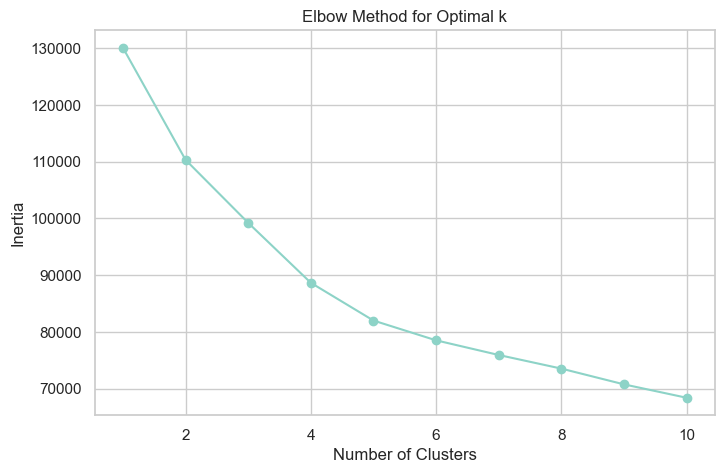

In [1046]:
from sklearn.cluster import KMeans


# Determine the optimal number of clusters using the Elbow Method
inertia = []
k_range = range(1, 11)  # Test for 1 to 10 clusters
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_ncom)
    inertia.append(kmeans.inertia_)

# Plot the Elbow graph
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()


In [1047]:
# Fit K-Means with the optimal number of clusters
optimal_k = 5
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df_group_age['cluster_age'] = kmeans.fit_predict(transformed_data)

In [1048]:
df_group_age

,recency,transaction_count,preferred_payment,4722,5251,5311,5411,5412,5541,5651,5661,5712,5732,5812,5814,5912,5941,5942,5964,5999,7230,7994,8211,8220,cluster_age
user_id,,,,,,,,,,,,,,,,,,,,,,,,,
U00001,19,8,0.750000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,4
U00002,41,9,0.777778,1.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
U00003,10,8,0.875000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,4
U00004,19,9,1.000000,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,4
U00005,37,8,0.875000,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U24317,24,13,0.769231,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,3.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1
U24318,5,9,0.666667,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
U24319,30,9,0.666667,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [1049]:
df_group_age.columns

Index(['recency', 'transaction_count', 'preferred_payment', '4722', '5251',
       '5311', '5411', '5412', '5541', '5651', '5661', '5712', '5732', '5812',
       '5814', '5912', '5941', '5942', '5964', '5999', '7230', '7994', '8211',
       '8220', 'cluster_age'],
      dtype='object')

In [1050]:
# Explore how each feature behaves in the clusters
feature_columns_age = ['recency', 'transaction_count', 'preferred_payment',
       '4722', '5251', '5311', '5411', '5412', '5541', '5651', '5661', '5712',
       '5732', '5812', '5814', '5912', '5941', '5942', '5964', '5999', '7230',
       '7994', '8211', '8220']
cluster_analysis = df_group_age.groupby('cluster_age')[feature_columns_age].mean()
cluster_analysis


,recency,transaction_count,preferred_payment,4722,5251,5311,5411,5412,5541,5651,5661,5712,5732,5812,5814,5912,5941,5942,5964,5999,7230,7994,8211,8220
cluster_age,,,,,,,,,,,,,,,,,,,,,,,,
0,32.386868,6.433724,0.801278,0.099877,0.183107,0.147041,0.595561,0.305795,0.302096,0.098644,0.189581,0.132552,0.328298,1.549014,0.882552,0.572750,0.120530,0.187731,0.100801,0.319051,0.128237,0.060419,0.067509,0.062577
1,7.646859,10.557042,0.800846,0.146972,0.258789,0.195963,0.810841,0.404173,0.431617,0.136085,0.236788,0.191653,0.461102,2.166931,1.270129,2.376049,0.178272,0.267634,0.163076,0.432071,0.166478,0.081198,0.097074,0.084146
2,7.575861,10.339849,0.800141,0.152700,0.271683,0.192280,2.444906,0.419497,0.425116,0.130711,0.232104,0.180064,0.450281,2.163205,1.256536,0.558515,0.171512,0.266308,0.161984,0.431713,0.170535,0.078427,0.094307,0.087466
3,6.647362,11.493653,0.801830,0.174931,0.338754,0.241571,0.580127,0.595795,0.598969,0.153511,0.303253,0.222927,0.621975,3.547203,1.644784,0.586077,0.206267,0.339548,0.185839,0.620190,0.208251,0.101547,0.118009,0.104125
4,7.725209,7.005443,0.796361,0.123722,0.236957,0.169919,0.428780,0.365060,0.353246,0.119342,0.210540,0.169123,0.363600,1.570291,1.122793,0.453206,0.146422,0.229258,0.150272,0.385106,0.163149,0.078057,0.087482,0.079119


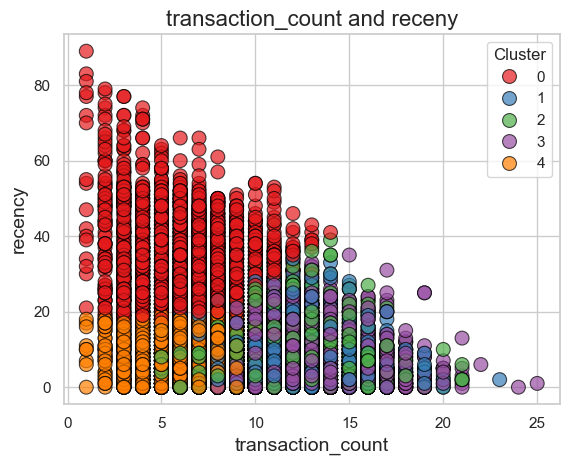

In [1051]:
# Scatter plot of the first two PCA components
sns.scatterplot(
    x='transaction_count', 
    y='recency', 
    hue='cluster_age',  # Cluster labels
    palette='Set1',  # Choose a color palette
    data=df_group_age,
    s=100,  # Size of the points
    alpha=0.7,  # Transparency
    edgecolor='black'  # Border color
)

# Add titles and labels
plt.title('transaction_count and receny', fontsize=16)
plt.xlabel('transaction_count', fontsize=14)
plt.ylabel('recency', fontsize=14)
plt.legend(title='Cluster', loc='upper right')
plt.grid(True)

# Show plot
plt.show()

In [1052]:
# Create a mapping dictionary
cluster_mapping_age = {
    0: '51-79',
    1: '18-25',
    2: '15-17',
    3: '26-35',
    4: '36-50'
}

# Apply the mapping to create a new column
df_group_age['Age'] = df_group_age['cluster_age'].map(cluster_mapping_age)

# Display the updated DataFrame
df_group_age

,recency,transaction_count,preferred_payment,4722,5251,5311,5411,5412,5541,5651,5661,5712,5732,5812,5814,5912,5941,5942,5964,5999,7230,7994,8211,8220,cluster_age,Age
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,
U00001,19,8,0.750000,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,4,36-50
U00002,41,9,0.777778,1.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,51-79
U00003,10,8,0.875000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,4,36-50
U00004,19,9,1.000000,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,4,36-50
U00005,37,8,0.875000,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,51-79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U24317,24,13,0.769231,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,3.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1,18-25
U24318,5,9,0.666667,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,36-50
U24319,30,9,0.666667,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,51-79


## **Education Level**

I performed clustering using the features `income_level`, `age`, and `merchant_id` that has high probability to define this feature  and the results are categorized into two broad education categories: **High School** or **University**.

**Clustering Approach:**
- The clustering process resulted in **4 clusters**. However, based on the analysis, I simplified it into two main categories for clarity:
  1. **High School Students**: Clusters with younger age groups, typically **15-17** or **18-25**.
  2. **University Students**: Clusters with older individuals, typically ranging from **26-35** and above.

**Analysis:**
- When plotting the clusters using **scatter plots** and **bar charts**, a clear pattern emerged:
  - **Cluster 4** has a high probability of being high school students, as their age consistently falls in the **15-25** range.
  - When visualizing this in a bar plot, **Cluster 3** is the only group where the age ranges between **0-1**, strongly indicating that it represents high school students.
  - The remaining clusters have a broader range of ages, from **0-4**, likely representing university students or older.

By using these insights, I classified each cluster into either **High School** or **University** categories, simplifying the overall education-level analysis.

In [1053]:
df_group_age.columns

Index(['recency', 'transaction_count', 'preferred_payment', '4722', '5251',
       '5311', '5411', '5412', '5541', '5651', '5661', '5712', '5732', '5812',
       '5814', '5912', '5941', '5942', '5964', '5999', '7230', '7994', '8211',
       '8220', 'cluster_age', 'Age'],
      dtype='object')

In [1054]:
df_education = merged_df[['Income_Level']]
        

In [1055]:
df_education['Age'] = df_group_age[['Age']]

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\670068776.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_education['Age'] = df_group_age[['Age']]


In [1056]:
df_education[['8220','5942']] = df_group_age[['8220','5942']]

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\3243838462.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_education[['8220','5942']] = df_group_age[['8220','5942']]
C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\3243838462.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_education[['8220','5942']] = df_group_age[['8220','5942']]


In [1057]:
merged_df.iloc[111:115,-1]

user_id
U00112    Middle
U00113     Lower
U00114     Lower
U00115      High
Name: Income_Level, dtype: object

In [1058]:
df_group_age.iloc[111:115,-1]

user_id
U00112    26-35
U00113    36-50
U00114    36-50
U00115    15-17
Name: Age, dtype: object

In [1059]:
df_education.iloc[111:115]

,Income_Level,Age,8220,5942
user_id,,,,
U00112,Middle,26-35,0.0,0.0
U00113,Lower,36-50,0.0,0.0
U00114,Lower,36-50,0.0,0.0
U00115,High,15-17,0.0,0.0


### **Data Preprocessing**

In [1060]:
df_education.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24321 entries, U00001 to U24321
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Income_Level  24321 non-null  object 
 1   Age           24321 non-null  object 
 2   8220          24321 non-null  float64
 3   5942          24321 non-null  float64
dtypes: float64(2), object(2)
memory usage: 1.4+ MB


In [1061]:
# Create a mapping dictionary
cluster_mapping_income = {
    'Lower' : 0,
    'Middle' : 1,
    'Up_Middle' : 2,
    'High': 3
}

# Apply the mapping to create a new column
df_education['Income_Level'] = df_education['Income_Level'].map(cluster_mapping_income)

# Display the updated DataFrame
df_education.head()  




C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\3128471818.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_education['Income_Level'] = df_education['Income_Level'].map(cluster_mapping_income)


,Income_Level,Age,8220,5942
user_id,,,,
U00001,0,36-50,1.0,0.0
U00002,0,51-79,0.0,0.0
U00003,2,36-50,0.0,0.0
U00004,2,36-50,1.0,0.0
U00005,0,51-79,0.0,0.0


In [1062]:
# Create a mapping dictionary
cluster_mapping_age_education = {
    '15-17' : 0,
    '18-25' : 1,
    '26-35' : 2,
    '36-50' : 3,
    '51-79' : 4
}

# Apply the mapping to create a new column
df_education['Age'] = df_education['Age'].map(cluster_mapping_age_education)

# Display the updated DataFrame
df_education



C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\2707226962.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_education['Age'] = df_education['Age'].map(cluster_mapping_age_education)


,Income_Level,Age,8220,5942
user_id,,,,
U00001,0,3,1.0,0.0
U00002,0,4,0.0,0.0
U00003,2,3,0.0,0.0
U00004,2,3,1.0,0.0
U00005,0,4,0.0,0.0
...,...,...,...,...
U24317,1,1,0.0,0.0
U24318,1,3,0.0,0.0
U24319,0,4,0.0,0.0


In [1063]:
df_education.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24321 entries, U00001 to U24321
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Income_Level  24321 non-null  int64  
 1   Age           24321 non-null  int64  
 2   8220          24321 non-null  float64
 3   5942          24321 non-null  float64
dtypes: float64(2), int64(2)
memory usage: 1.4+ MB


In [1064]:

# Define the ColumnTransformer
Transformer = ColumnTransformer([
    ('robust', RobustScaler(), ['8220','5942'])], remainder='passthrough') 


# Apply the ColumnTransformer to merged_df
transformed_data = Transformer.fit_transform(df_education)

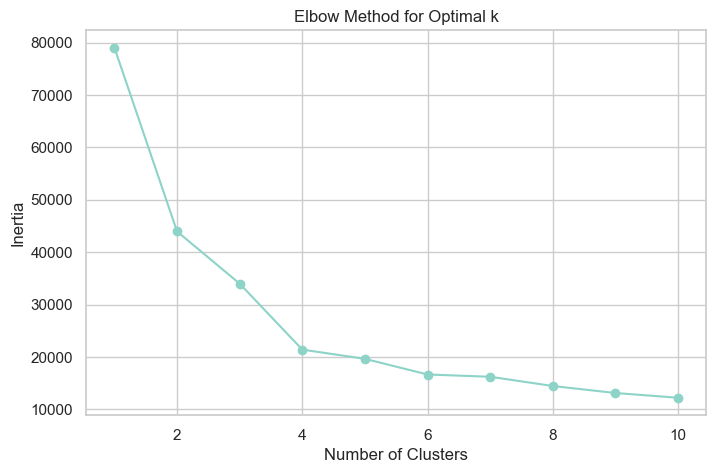

In [1065]:
from sklearn.cluster import KMeans


# Determine the optimal number of clusters using the Elbow Method
inertia = []
k_range = range(1, 11)  # Test for 1 to 10 clusters
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(transformed_data)
    inertia.append(kmeans.inertia_)

# Plot the Elbow graph
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()


In [1066]:
# Fit K-Means with the optimal number of clusters
optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df_education['cluster_edu'] = kmeans.fit_predict(transformed_data)

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\1071369343.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_education['cluster_edu'] = kmeans.fit_predict(transformed_data)


In [1067]:
df_education.columns

Index(['Income_Level', 'Age', '8220', '5942', 'cluster_edu'], dtype='object')

In [1068]:
# Explore how each feature behaves in the clusters
feature_columns_age = ['Income_Level', 'Age', '8220', '5942']
cluster_analysis = df_education.groupby('cluster_edu')[feature_columns_age].mean()
cluster_analysis


,Income_Level,Age,8220,5942
cluster_edu,,,,
0,0.015367,3.402533,0.066306,0.196927
1,1.491736,2.609039,0.089513,0.268685
2,2.734378,1.018730,0.110165,0.336455
3,0.695178,0.509273,0.071569,0.244600


In [1069]:
df_education

,Income_Level,Age,8220,5942,cluster_edu
user_id,,,,,
U00001,0,3,1.0,0.0,0
U00002,0,4,0.0,0.0,0
U00003,2,3,0.0,0.0,1
U00004,2,3,1.0,0.0,1
U00005,0,4,0.0,0.0,0
...,...,...,...,...,...
U24317,1,1,0.0,0.0,3
U24318,1,3,0.0,0.0,1
U24319,0,4,0.0,0.0,0


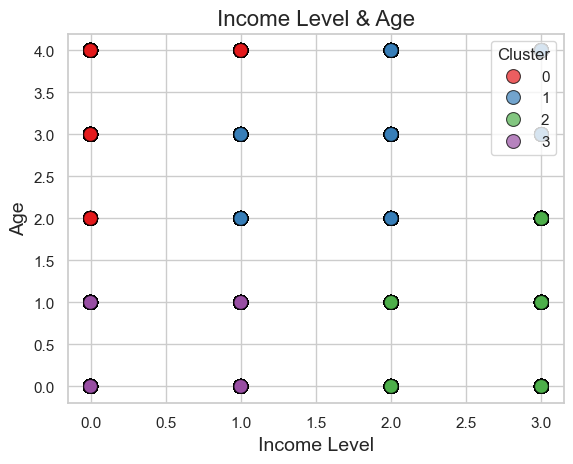

In [1070]:
# Scatter plot of the first two PCA components
sns.scatterplot(
    x='Income_Level', 
    y='Age', 
    hue='cluster_edu',  # Cluster labels
    palette='Set1',  # Choose a color palette
    data=df_education,
    s=100,  # Size of the points
    alpha=0.7,  # Transparency
    edgecolor='black'  # Border color
)

# Add titles and labels
plt.title('Income Level & Age', fontsize=16)
plt.xlabel('Income Level', fontsize=14)
plt.ylabel('Age', fontsize=14)
plt.legend(title='Cluster', loc='upper right')
plt.grid(True)

# Show plot
plt.show()

Text(0.5, 1.0, 'Education : Cluster 3')

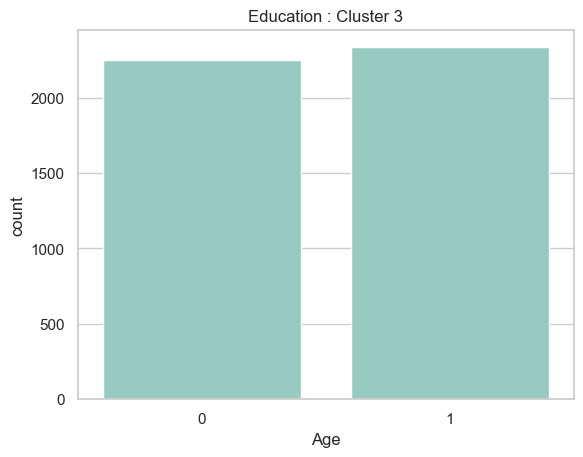

In [1071]:
sns.countplot(data =df_education[df_education['cluster_edu']==3], x='Age')

plt.title( "Education : Cluster 3")

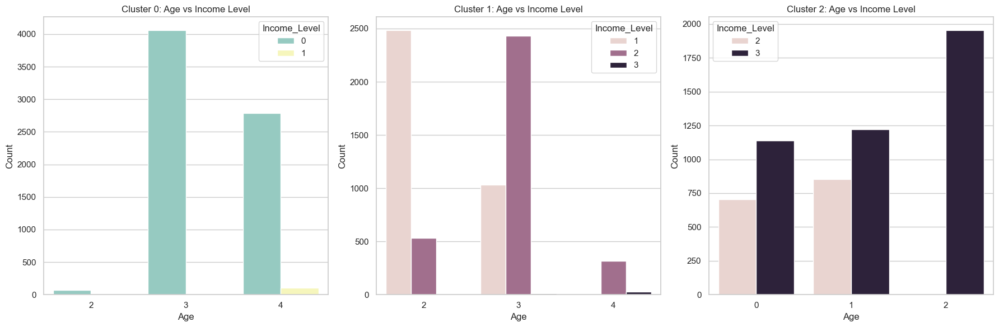

In [1072]:
# Create a figure with 1 row and 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot for cluster_edu == 0
sns.countplot(data=df_education[df_education['cluster_edu'] == 0], x='Age', hue='Income_Level', ax=axes[0])
axes[0].set_title('Cluster 0: Age vs Income Level')
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Count')

# Plot for cluster_edu == 1
sns.countplot(data=df_education[df_education['cluster_edu'] == 1], x='Age', hue='Income_Level', ax=axes[1])
axes[1].set_title('Cluster 1: Age vs Income Level')
axes[1].set_xlabel('Age')
axes[1].set_ylabel('Count')

# Plot for cluster_edu == 2
sns.countplot(data=df_education[df_education['cluster_edu'] == 2], x='Age', hue='Income_Level', ax=axes[2])
axes[2].set_title('Cluster 2: Age vs Income Level')
axes[2].set_xlabel('Age')
axes[2].set_ylabel('Count')

# Adjust layout
plt.tight_layout()
plt.show()

<Axes: xlabel='Age', ylabel='count'>

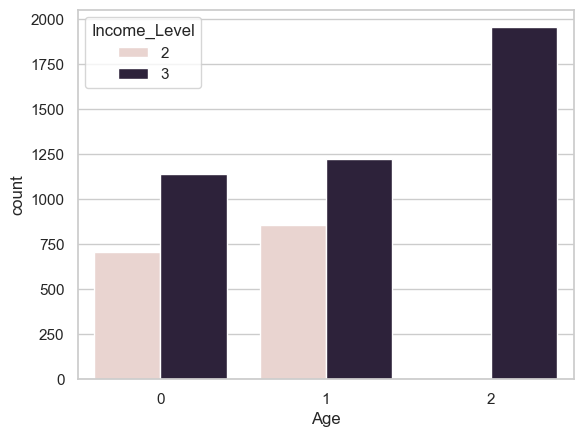

In [1073]:
sns.countplot(data =df_education[df_education['cluster_edu']==2], x='Age',hue='Income_Level')

<Axes: xlabel='Age', ylabel='count'>

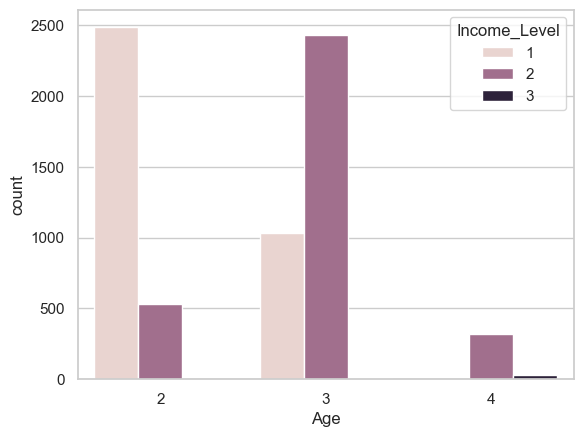

In [1074]:
sns.countplot(data =df_education[df_education['cluster_edu']== 1], x='Age',hue='Income_Level')

<Axes: xlabel='Age', ylabel='count'>

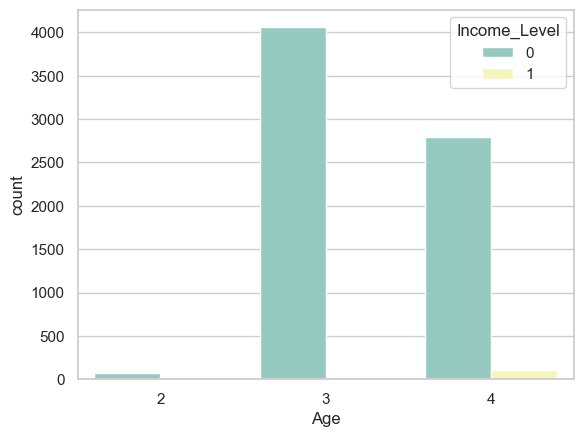

In [1075]:
sns.countplot(data =df_education[df_education['cluster_edu']== 0], x='Age',hue='Income_Level')

In [1076]:
# Create a mapping dictionary
cluster_mapping_income = {
    0: 'Lower',
    1: 'Middle',
    2: 'Up_Middle',
    3: 'High'
}

# Apply the mapping to create a new column
df_education['Income_Level'] = df_education['Income_Level'].map(cluster_mapping_income)

# Create a mapping dictionary
cluster_mapping_age_education = {
    0: '15-17',
    1: '18-25',
    2: '26-35',
    3: '36-50',
    4: '51-79'
}

# Apply the mapping to create a new column
df_education['Age'] = df_education['Age'].map(cluster_mapping_age_education)

# Display the updated DataFrame
df_education

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\562210893.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_education['Income_Level'] = df_education['Income_Level'].map(cluster_mapping_income)
C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\562210893.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_education['Age'] = df_education['Age'].map(cluster_mapping_age_education)


,Income_Level,Age,8220,5942,cluster_edu
user_id,,,,,
U00001,Lower,36-50,1.0,0.0,0
U00002,Lower,51-79,0.0,0.0,0
U00003,Up_Middle,36-50,0.0,0.0,1
U00004,Up_Middle,36-50,1.0,0.0,1
U00005,Lower,51-79,0.0,0.0,0
...,...,...,...,...,...
U24317,Middle,18-25,0.0,0.0,3
U24318,Middle,36-50,0.0,0.0,1
U24319,Lower,51-79,0.0,0.0,0


In [1077]:
# Create a mapping dictionary
cluster_education = {
    3: 'High School',
    2: 'University',
    1: 'University',
    0: 'University'
}

# Apply the mapping to create a new column
df_education['Education'] = df_education['cluster_edu'].map(cluster_education)

# Display the updated DataFrame
df_education

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\2301999819.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_education['Education'] = df_education['cluster_edu'].map(cluster_education)


,Income_Level,Age,8220,5942,cluster_edu,Education
user_id,,,,,,
U00001,Lower,36-50,1.0,0.0,0,University
U00002,Lower,51-79,0.0,0.0,0,University
U00003,Up_Middle,36-50,0.0,0.0,1,University
U00004,Up_Middle,36-50,1.0,0.0,1,University
U00005,Lower,51-79,0.0,0.0,0,University
...,...,...,...,...,...,...
U24317,Middle,18-25,0.0,0.0,3,High School
U24318,Middle,36-50,0.0,0.0,1,University
U24319,Lower,51-79,0.0,0.0,0,University


## **Homeownership**

For the homeownership analysis, I used the features income level, age, and two specific merchant IDs: 5712 and 5251. These merchant IDs are relevant because they represent categories commonly associated with home-related purchases:

- 5712: Refers to "Furniture, Home Furnishings, and Equipment Stores."
- 5251: Refers to "Hardware Stores."

These features were chosen as indicators of potential homeownership-related spending.

**Homeownership Insights:** <br>
Based on the clustering analysis using income level, age, and the specific merchant IDs (5712 and 5251 related to home-related purchases), I derived the following insight:

- Lower income individuals (income level 0-1) tend to purchase or own homes later in life, typically when they are older than 35 years (age group 3-4).

- In contrast, higher income individuals (income level 2-4) have a higher likelihood of purchasing or owning homes at a younger age, even before they reach 35 (age group 1-3).

This suggests that higher income provides more opportunities for early homeownership, while lower-income individuals often need to wait until later in life.

In [1078]:
df_home = merged_df[['Income_Level']]
df_home['Age'] = df_group_age[['Age']]
df_home[['5712','5251']] = df_group_age[['5712','5251']]

df_home.head()

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\1773954043.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_home['Age'] = df_group_age[['Age']]
C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\1773954043.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_home[['5712','5251']] = df_group_age[['5712','5251']]
C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\1773954043.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

,Income_Level,Age,5712,5251
user_id,,,,
U00001,Lower,36-50,1.0,0.0
U00002,Lower,51-79,0.0,0.0
U00003,Up_Middle,36-50,0.0,0.0
U00004,Up_Middle,36-50,0.0,1.0
U00005,Lower,51-79,0.0,0.0


In [1079]:
# Create a mapping dictionary
cluster_mapping_income = {
    'Lower' : 0,
    'Middle' : 1,
    'Up_Middle' : 2,
    'High': 3
}

# Apply the mapping to create a new column
df_home['Income_Level'] = df_home['Income_Level'].map(cluster_mapping_income)


# Create a mapping dictionary
cluster_mapping_age = {
    '15-17' : 0,
    '18-25' : 1,
    '26-35' : 2,
    '36-50' : 3,
    '51-79' : 4
}

# Apply the mapping to create a new column
df_home['Age'] = df_home['Age'].map(cluster_mapping_age)

# Display the updated DataFrame
df_home

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\244114464.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_home['Income_Level'] = df_home['Income_Level'].map(cluster_mapping_income)
C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\244114464.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_home['Age'] = df_home['Age'].map(cluster_mapping_age)


,Income_Level,Age,5712,5251
user_id,,,,
U00001,0,3,1.0,0.0
U00002,0,4,0.0,0.0
U00003,2,3,0.0,0.0
U00004,2,3,0.0,1.0
U00005,0,4,0.0,0.0
...,...,...,...,...
U24317,1,1,0.0,0.0
U24318,1,3,0.0,1.0
U24319,0,4,0.0,0.0


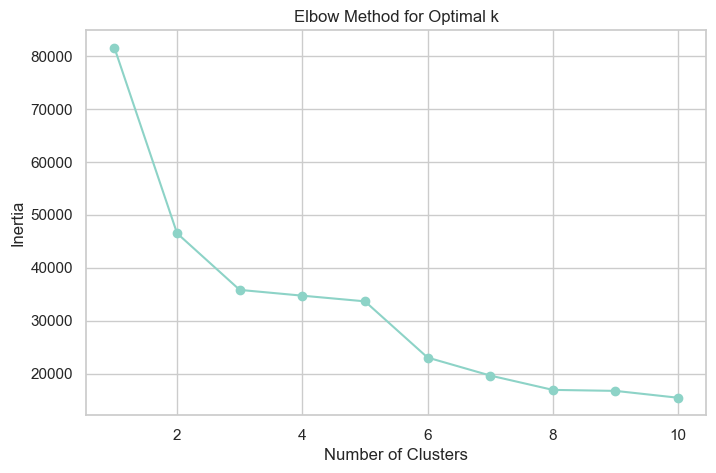

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\1317448126.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_home['cluster_home'] = kmeans.fit_predict(transformed_data)


,Income_Level,Age,5712,5251
cluster_home,,,,
0,0.015407,3.406134,0.136947,0.191441
1,1.365328,2.475100,0.188220,0.253949
2,1.955594,0.782644,0.207702,0.315110


In [1080]:
# Define the ColumnTransformer
Transformer = ColumnTransformer([
    ('robust', RobustScaler(), ['5712','5251'])], remainder='passthrough') 


# Apply the ColumnTransformer to merged_df
transformed_data = Transformer.fit_transform(df_home)


# Determine the optimal number of clusters using the Elbow Method
inertia = []
k_range = range(1, 11)  # Test for 1 to 10 clusters
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(transformed_data)
    inertia.append(kmeans.inertia_)

# Plot the Elbow graph
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()


# Fit K-Means with the optimal number of clusters
optimal_k = 3
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df_home['cluster_home'] = kmeans.fit_predict(transformed_data)

# Explore how each feature behaves in the clusters
feature_columns_age = ['Income_Level', 'Age', '5712', '5251']
cluster_analysis = df_home.groupby('cluster_home')[feature_columns_age].mean()
cluster_analysis

In [1081]:
# Fit K-Means with the optimal number of clusters
optimal_k = 5
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df_home['cluster_home'] = kmeans.fit_predict(transformed_data)

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\100470245.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_home['cluster_home'] = kmeans.fit_predict(transformed_data)


In [1082]:
# Explore how each feature behaves in the clusters
feature_columns_age = ['Income_Level', 'Age', '5712', '5251']
cluster_analysis = df_home.groupby('cluster_home')[feature_columns_age].mean()
cluster_analysis

,Income_Level,Age,5712,5251
cluster_home,,,,
0,0.396166,3.244728,0.031310,1.219808
1,1.177180,1.847304,0.154867,0.207574
2,2.363770,0.801044,0.223859,0.333512
3,0.366071,3.275974,1.140422,0.177760
4,0.184941,3.409958,0.000000,0.000000


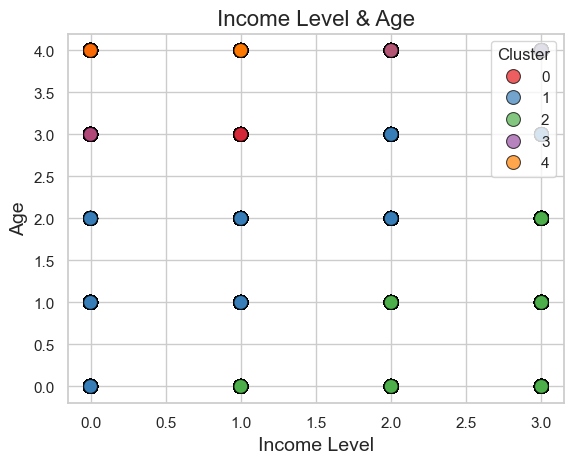

In [1083]:
# Scatter plot of the first two PCA components
sns.scatterplot(
    x='Income_Level', 
    y='Age', 
    hue='cluster_home',  # Cluster labels
    palette='Set1',  # Choose a color palette
    data=df_home,
    s=100,  # Size of the points
    alpha=0.7,  # Transparency
    edgecolor='black'  # Border color
)

# Add titles and labels
plt.title('Income Level & Age', fontsize=16)
plt.xlabel('Income Level', fontsize=14)
plt.ylabel('Age', fontsize=14)
plt.legend(title='Cluster', loc='upper right')
plt.grid(True)

# Show plot
plt.show()

<Axes: xlabel='Age', ylabel='count'>

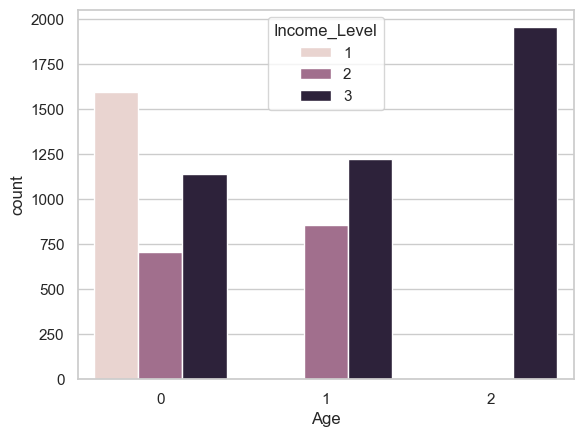

In [1084]:
sns.countplot(data =df_home[df_home['cluster_home']==2], x='Age',hue='Income_Level')

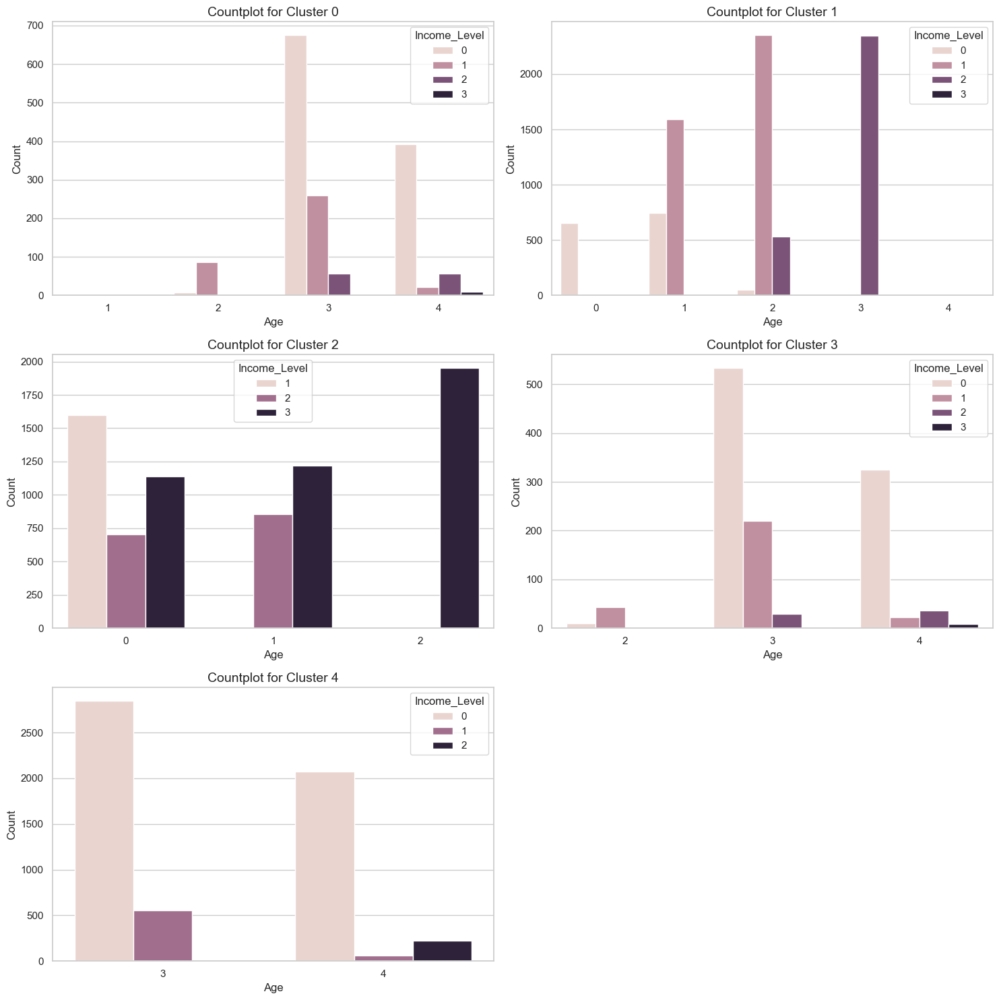

In [1085]:
x = df_home
y = 'cluster_home'

# Set the number of clusters dynamically from df_home['cluster_home'].nunique()
num_clusters = x[y].nunique()

# Determine the number of rows and columns for the subplot grid (e.g., 2 columns)
cols = 2
rows = int(np.ceil(num_clusters / cols))  # Calculate the necessary number of rows

# Create subplots dynamically based on the number of rows and columns
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(15, 5 * rows))

# Flatten the axes array if more than 1 row or column is present, to make it iterable
axes = axes.flatten()

# Sort the clusters in ascending order
sorted_clusters = sorted(x[y].unique())

# Loop through each sorted cluster and create a countplot
for i, cluster in enumerate(sorted_clusters):
    # Filter the dataframe for the current cluster
    df_cluster = x[x[y] == cluster]

    # Create a countplot in the respective subplot
    sns.countplot(data=df_cluster, x='Age', hue='Income_Level', ax=axes[i])

    # Set title for each subplot
    axes[i].set_title(f'Countplot for Cluster {cluster}', fontsize=14)
    axes[i].set_ylabel('Count')
    axes[i].set_xlabel('Age')

# Hide any empty subplots (in case the number of clusters isn't a perfect fit for the grid)
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better spacing between subplots
plt.tight_layout()
plt.show()

In [1086]:
df_home[df_home['cluster_home']==0]['Age'].unique()

array([3, 4, 2, 1], dtype=int64)

In [1087]:
df_home[df_home['cluster_home']==1]['Age'].unique()

array([3, 2, 1, 0, 4], dtype=int64)

In [1088]:
df_home[df_home['cluster_home']==2]['Age'].unique()

array([2, 0, 1], dtype=int64)

In [1089]:
df_home[df_home['cluster_home']==3]['Age'].unique()

array([3, 4, 2], dtype=int64)

In [1090]:
df_home[df_home['cluster_home']==4]['Age'].unique()

array([4, 3], dtype=int64)

In [1091]:
# Assuming df_home is your dataframe
df_home['new_column'] = np.where(
    (df_home['Income_Level'] == 0) & df_home['Age'].isin([3, 4]), 1,
    np.where(
        (df_home['Income_Level'].isin([1, 2]) & df_home['Age'].isin([1, 2, 3, 4])), 1,
        np.where(
            (df_home['Income_Level'].isin([1, 2, 3]) & df_home['Age'].isin([0, 1, 2, 3, 4])), 1, 0
        )
    )
)


C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\3681169540.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_home['new_column'] = np.where(


In [1092]:
df_home

,Income_Level,Age,5712,5251,cluster_home,new_column
user_id,,,,,,
U00001,0,3,1.0,0.0,3,1
U00002,0,4,0.0,0.0,4,1
U00003,2,3,0.0,0.0,1,1
U00004,2,3,0.0,1.0,1,1
U00005,0,4,0.0,0.0,4,1
...,...,...,...,...,...,...
U24317,1,1,0.0,0.0,1,1
U24318,1,3,0.0,1.0,0,1
U24319,0,4,0.0,0.0,4,1


In [1093]:
df_home['new_column'].value_counts()

new_column
1    22854
0     1467
Name: count, dtype: int64

In [1094]:
df_home[df_home['new_column']==0]['Age'].unique()

array([1, 0, 2], dtype=int64)

## **Gender**

This process uses user transaction patterns across various merchant categories to perform gender classification. Here are the key steps involved:

1. Data Standardization
The transaction data is standardized using RobustScaler to handle outliers and normalize the dataset, making it ready for analysis.

2. Merchant Category Weights
Predefined weights are assigned to each merchant category based on assumed spending preferences of male and female users. For example, Electronics Stores (MCC 5732) are weighted 0.7 for males and 0.3 for females, while Beauty and Barber Shops (MCC 7230) have a weight of 0.2 for males and 0.8 for females.

3. Score Calculation
For each transaction, both a male score and a female score are calculated by multiplying the transaction amount by the corresponding gender weight for that merchant category.

4. User-Level Aggregation
These individual transaction scores are then aggregated for each user.

5. Gender Classification
Users are classified as either male or female based on whichever aggregated score (male or female) is higher.

Output
The final output is a DataFrame containing user IDs, their respective male and female scores, and their predicted gender based on transaction behavior.

In [1095]:
df_user_mcc

merchant_category_id,4722,5251,5311,5411,5412,5541,5651,5661,5712,5732,5812,5814,5912,5941,5942,5964,5999,7230,7994,8211,8220
user_id,,,,,,,,,,,,,,,,,,,,,
U00001,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0
U00002,1.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
U00003,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
U00004,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
U00005,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
U24317,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,3.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
U24318,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
U24319,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1096]:

from sklearn.preprocessing import StandardScaler
# Step 1: Standardize the data
scaler = RobustScaler()
scaled_data = scaler.fit_transform(df_user_mcc)

# Convert scaled data back to DataFrame
df_user_mcc_scaled = pd.DataFrame(scaled_data, index=df_user_mcc.index, columns=df_user_mcc.columns)


# Define the weights for each merchant category
weights = {
    '5732': {'male': 0.7, 'female': 0.3},  # Electronics Stores
    '5812': {'male': 0.5, 'female': 0.5},  # Eating Places and Restaurants
    '5411': {'male': 0.4, 'female': 0.6},  # Grocery Stores, Supermarkets
    '5814': {'male': 0.6, 'female': 0.4},  # Fast Food Restaurants
    '5964': {'male': 0.3, 'female': 0.7},  # Direct Marketing - Catalog Merchants
    '5311': {'male': 0.5, 'female': 0.5},  # Department Stores
    '5999': {'male': 0.4, 'female': 0.6},  # Miscellaneous and Specialty Retail Stores
    '5912': {'male': 0.3, 'female': 0.7},  # Drug Stores and Pharmacies
    '5541': {'male': 0.6, 'female': 0.4},  # Service Stations
    '5942': {'male': 0.4, 'female': 0.6},  # Book Stores
    '7230': {'male': 0.2, 'female': 0.8},  # Beauty and Barber Shops
    '5661': {'male': 0.3, 'female': 0.7},  # Shoe Stores
    '5712': {'male': 0.5, 'female': 0.5},  # Furniture, Home Furnishings, and Equipment Stores
    '5651': {'male': 0.3, 'female': 0.7},  # Family Clothing Stores
    '8220': {'male': 0.4, 'female': 0.6},  # Colleges, Universities, and Professional Schools
    '5412': {'male': 0.5, 'female': 0.5},  # Convenience Stores
    '5941': {'male': 0.6, 'female': 0.4},  # Sporting Goods Stores
    '8211': {'male': 0.4, 'female': 0.6},  # Elementary and Secondary Schools
    '4722': {'male': 0.5, 'female': 0.5},  # Travel Agencies and Tour Operators
    '5251': {'male': 0.6, 'female': 0.4},  # Hardware Stores
    '7994': {'male': 0.6, 'female': 0.4}   # Video Game Arcades/Establishments
}

# Step 1: Calculate male and female scores for each transaction
df['male_score'] = df.apply(
    lambda row: weights[str(row['merchant_category_id'])]['male'] * row['transaction_amount'], axis=1)
df['female_score'] = df.apply(
    lambda row: weights[str(row['merchant_category_id'])]['female'] * row['transaction_amount'], axis=1)

# Step 2: Aggregate the scores by user_id
user_scores = df.groupby('user_id').agg({
    'male_score': 'sum',
    'female_score': 'sum'
}).reset_index()

# Step 3: Classify users based on higher score
user_scores['gender'] = user_scores.apply(
    lambda row: 'male' if row['male_score'] > row['female_score'] else 'female', axis=1)

# Step 4: Display the results
user_scores.head()



,user_id,male_score,female_score,gender
0,U00001,154310.0,153190.0,male
1,U00002,158220.0,133580.0,male
2,U00003,254410.0,263290.0,female
3,U00004,196840.0,233960.0,female
4,U00005,135810.0,147790.0,female


## **Parental Status**

To define the **parental status** of users, the process follows a similar approach to gender classification, using specific merchant category IDs combined with user features like **income level** and **age**. Here's how the process works:

Key Steps in the Process:

1. **Age-Based Weights**:  
   The code assigns higher weights to users based on their age group:
   - **Age 0**: No score (assumed not to be parents).
   - **Age 1 (18-25 years old)**: A score of 1 (low probability of being parents).
   - **Age 2 ,3 and 4 (>2 years old)**: A score of 2 (higher probability of being parents).

2. **Merchant Category Code (MCC) Transaction Weights**:  
   Transactions at specific merchants related to family needs are also considered:
   - **Grocery Stores (MCC 5411)**: Weighted at 0.5.
   - **Furniture Stores (MCC 5712)**: Weighted at 0.3.
   - **Family Clothing Stores (MCC 5651)**: Weighted at 0.2.
   - **Colleges/Universities (MCC 8220)** and **Elementary/Secondary Schools (MCC 8211)**: Both weighted at 0.4 (indicating possible education expenses).
   - **Hardware Stores (MCC 5251)**: Weighted at 0.1.

Final Score and Parental Status Classification:
After calculating these scores based on the user's transactions, age, and income level, the total score is evaluated. The **central tendency** (mean or median) of the scores is used as a threshold. Users with a score **above the central tendency** are classified as having a higher probability of being parents.

In summary, the process combines user age, income level, and specific spending patterns to estimate the likelihood of a user being a parent based on a calculated score.

In [1097]:
df_parent = df_home[['Income_Level','Age']]

In [1098]:
df_parent[['5411','5311','5712','5651','8220','8211','5251']] = df_user_mcc[['5411','5311','5712','5651','8220','8211','5251']]

df_parent.head()

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\1230697404.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_parent[['5411','5311','5712','5651','8220','8211','5251']] = df_user_mcc[['5411','5311','5712','5651','8220','8211','5251']]
C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\1230697404.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_parent[['5411','5311','5712','5651','8220','8211','5251']] = df_user_mcc[['5411','5311','5712','5651','8220','8211','5251']]
C:\Users\Intania\AppData\L

,Income_Level,Age,5411,5311,5712,5651,8220,8211,5251
user_id,,,,,,,,,
U00001,0,3,0.0,0.0,1.0,0.0,1.0,1.0,0.0
U00002,0,4,1.0,0.0,0.0,0.0,0.0,0.0,0.0
U00003,2,3,1.0,0.0,0.0,0.0,0.0,0.0,0.0
U00004,2,3,0.0,0.0,0.0,0.0,1.0,0.0,1.0
U00005,0,4,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [1099]:
df_parent.describe()

,Income_Level,Age,5411,5311,5712,5651,8220,8211,5251
count,24321.000000,24321.000000,24321.000000,24321.000000,24321.000000,24321.000000,24321.000000,24321.000000,24321.00000
mean,1.215082,2.058632,0.890958,0.190206,0.181325,0.128613,0.084413,0.094034,0.26068
std,1.100350,1.301669,0.949654,0.436234,0.428639,0.358731,0.290594,0.309256,0.51528
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
50%,1.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
75%,2.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
max,3.000000,4.000000,6.000000,3.000000,3.000000,3.000000,3.000000,3.000000,5.00000


In [1100]:
df_parent.reset_index(inplace=True)

In [1101]:
df_parent.columns

Index(['user_id', 'Income_Level', 'Age', '5411', '5311', '5712', '5651',
       '8220', '8211', '5251'],
      dtype='object')

In [1102]:
# Define the ColumnTransformer
Transformer = ColumnTransformer([
    ('robust', RobustScaler(), ['5411','5311','5712','5651','8220','8211','5251'])], remainder='passthrough') 


# Apply the ColumnTransformer to merged_df
transformed_data = Transformer.fit_transform(df_parent)

In [1103]:
transformed_data

array([[-1.0, 0.0, 1.0, ..., 'U00001', 0, 3],
       [0.0, 0.0, 0.0, ..., 'U00002', 0, 4],
       [0.0, 0.0, 0.0, ..., 'U00003', 2, 3],
       ...,
       [1.0, 0.0, 0.0, ..., 'U24319', 0, 4],
       [1.0, 0.0, 1.0, ..., 'U24320', 3, 2],
       [-1.0, 0.0, 1.0, ..., 'U24321', 0, 3]], dtype=object)

In [1104]:
# Create a DataFrame from transformed data
transformed_columns = ['5411', '5311', '5712', '5651', '8220', '8211', '5251', 'user_id','Income_Level', 'Age']
transformed_df = pd.DataFrame(transformed_data, columns=transformed_columns)


In [1105]:
transformed_df

,5411,5311,5712,5651,8220,8211,5251,user_id,Income_Level,Age
0,-1.0,0.0,1.0,0.0,1.0,1.0,0.0,U00001,0,3
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,U00002,0,4
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,U00003,2,3
3,-1.0,0.0,0.0,0.0,1.0,0.0,1.0,U00004,2,3
4,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,U00005,0,4
...,...,...,...,...,...,...,...,...,...,...
24316,0.0,1.0,0.0,1.0,0.0,0.0,0.0,U24317,1,1
24317,0.0,0.0,0.0,0.0,0.0,0.0,1.0,U24318,1,3
24318,1.0,0.0,0.0,0.0,0.0,0.0,0.0,U24319,0,4
24319,1.0,0.0,1.0,0.0,0.0,0.0,1.0,U24320,3,2


In [1106]:
def calculate_parent_score(row):
    score = 0
    
    # Age-based weights
    if row['Age'] == 0:
        return 0  # Not a parent
    elif row['Age'] == 1:
        score += 1  # Age 18-25
    elif row['Age'] in [2, 3, 4]:
        score += 2  # Age >26
    
    # Income-based weights
    # if row['Income_Level'] == 0:
    #     score += 1  # Low income
    # elif row['Income_Level'] in [1, 2]:
    #     score += 1  # Moderate income
    # elif row['Income_Level'] >= 3:
    #     score += 1  # Higher income

    # MCC-based transaction weights using transformed values
    score += 0.5 * row['5411']
    score += 0.3 * row['5712']
    score += 0.2 * row['5651']
    score += 0.4 * row['8220']
    score += 0.4 * row['8211']
    score += 0.1 * row['5251']

    return score


In [1107]:
# Apply the scoring function to the transformed DataFrame
transformed_df['parent_score'] = transformed_df.apply(calculate_parent_score, axis=1)


In [1108]:
# Classify as parent or not based on the score
transformed_df['is_parent'] = transformed_df['parent_score'].apply(lambda x: 1 if x >= 2 else 0)


In [1109]:
transformed_df

,5411,5311,5712,5651,8220,8211,5251,user_id,Income_Level,Age,parent_score,is_parent
0,-1.0,0.0,1.0,0.0,1.0,1.0,0.0,U00001,0,3,2.6,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,U00002,0,4,2.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,U00003,2,3,2.0,1
3,-1.0,0.0,0.0,0.0,1.0,0.0,1.0,U00004,2,3,2.0,1
4,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,U00005,0,4,1.9,0
...,...,...,...,...,...,...,...,...,...,...,...,...
24316,0.0,1.0,0.0,1.0,0.0,0.0,0.0,U24317,1,1,1.2,0
24317,0.0,0.0,0.0,0.0,0.0,0.0,1.0,U24318,1,3,2.1,1
24318,1.0,0.0,0.0,0.0,0.0,0.0,0.0,U24319,0,4,2.5,1
24319,1.0,0.0,1.0,0.0,0.0,0.0,1.0,U24320,3,2,2.9,1


In [1110]:
transformed_df['parent_score'].median()

1.6

<Axes: xlabel='parent_score', ylabel='Count'>

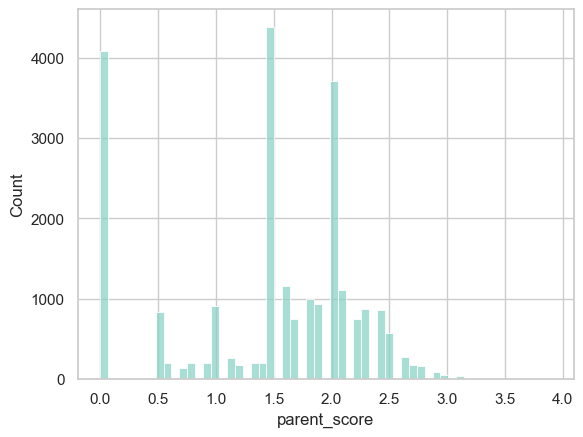

In [1111]:
sns.histplot(transformed_df['parent_score'])

In [1112]:
transformed_df[transformed_df['is_parent']==1]

,5411,5311,5712,5651,8220,8211,5251,user_id,Income_Level,Age,parent_score,is_parent
0,-1.0,0.0,1.0,0.0,1.0,1.0,0.0,U00001,0,3,2.6,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,U00002,0,4,2.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,U00003,2,3,2.0,1
3,-1.0,0.0,0.0,0.0,1.0,0.0,1.0,U00004,2,3,2.0,1
6,0.0,1.0,0.0,0.0,0.0,0.0,0.0,U00007,0,3,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
24312,0.0,0.0,1.0,0.0,0.0,0.0,1.0,U24313,3,2,2.4,1
24314,0.0,0.0,0.0,0.0,0.0,1.0,0.0,U24315,2,3,2.4,1
24317,0.0,0.0,0.0,0.0,0.0,0.0,1.0,U24318,1,3,2.1,1
24318,1.0,0.0,0.0,0.0,0.0,0.0,0.0,U24319,0,4,2.5,1


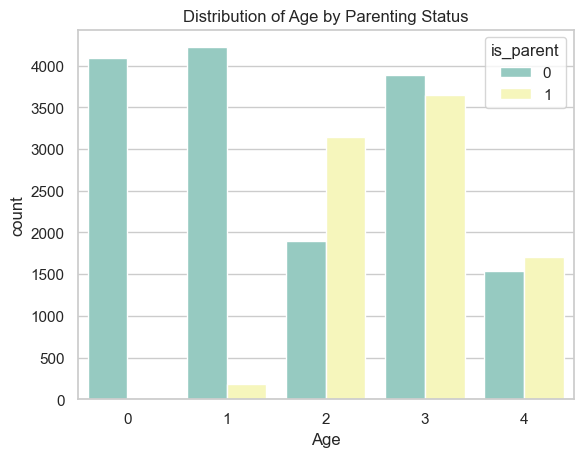

In [1113]:
# Create the count plot
sns.countplot(data=transformed_df, x='Age', hue='is_parent')

# Set the title
plt.title('Distribution of Age by Parenting Status')

# Show the plot
plt.show()

## **Big Five Personality**
Approach to Defining Personality Traits
1. Openness:<br>
    Individuals high in openness tend to be curious, seek new experiences, and appreciate variety in their lives. To identify users with high openness, I count the number of unique merchant category IDs they interact with. If a user has a total number of unique merchants greater than the central tendency, they are classified as very open and experienced.

2. Conscientiousness:<br>
    Conscientious individuals are known for their self-regulation and impulse control. This trait affects their ability to set and maintain long-term goals, deliberate over choices, and fulfill obligations. Users exhibiting high conscientiousness are likely to be more aware of discounts and may actively seek them out as part of their careful planning and financial management strategies.

3. Extraversion: <br>
    Extraversion measures how energetic, sociable, and friendly a person is. To assess this trait, I create a pivot table that counts transactions in specific merchant categories (MCCs): '5812', '5814', '5941', '5411', '5311', '5999', '5661', '7230', '4722', '7944'. 
    - 5812: Eating Places and Restaurants
    - 5814: Fast Food Restaurants
    - 5941: Sporting Goods Stores
    - 5411: Grocery Stores, Supermarkets
    - 5311: Department Stores
    - 5999: Miscellaneous and Specialty Retail Stores
    - 5661: Shoe Stores
    - 7230: Beauty Shops
    - 4722: Travel Agencies and Tour Operators
    - 7944: Charitable and Social Service Organizations
    Users with a transaction count higher than the central tendency are classified as extroverted.

4. Agreeableness:<br>
    This trait reflects kindness and compassion toward others. To evaluate agreeableness, I analyze transactions with the features of is_refunded and merchant ratings. Users who have transactions marked as refunded but still give high ratings (e.g., 4 stars) are assumed to be displaying agreeableness, indicating they may not be fully satisfied with the product but choose to give a favorable rating.

5. Neuroticism:<br>
    Individuals with high neuroticism scores are more prone to experiencing negative emotions such as anxiety, worry, and frustration. To identify neurotic users, I calculate the standard deviation of each user's transaction amounts. Users with a standard deviation higher than the average are categorized as neurotic.

### **Openness**

In [1114]:
df_persona = pd.read_csv("transactions.csv")
df_persona.head()

,transaction_id,user_id,transaction_amount,transaction_date,merchant_id,merchant_name,merchant_category_id,geo_location,payment_method,user_agent,loyalty_program,discount_applied,promo_amount,transaction_notes,merchant_rating,transaction_status,is_refunded
0,4a71b7d1-34fa-45cf-b40a-a730d16ce617,U10578,23500.0,2024-05-09,M04936,Cox Inc,5732,"-7.974781, 112.633863",balance,Android 9,no,no,0.0,no,5,completed,no
1,b29665c0-8373-4ec1-a121-a041c77ffb51,U08353,150500.0,2024-05-30,M06359,"King, Rice and Ramirez",5812,"-6.188155, 106.817086",balance,iPhone; CPU iPhone OS 3_1_3 like Mac OS X,no,no,0.0,yes,2,completed,no
2,3e32187b-b374-4f1b-a64e-b1ebcc856563,U04564,65800.0,2024-03-08,M01710,"Lyons, Porter and Williams",5812,"-7.962043, 112.637274",credit_card,Android 2.0.1,no,no,0.0,no,3,completed,no
3,df8ad42e-aaf6-46d2-8d8f-1e291a4554bd,U22797,45600.0,2024-05-14,M02852,Smith Ltd,5411,"-6.592793, 106.806543",balance,iPad; CPU iPad OS 9_3_5 like Mac OS X,no,no,0.0,no,3,completed,no
4,334468df-4d71-4e4a-935c-32c17c306611,U18053,8500.0,2024-04-09,M00722,Bush Group,5411,"-6.269386, 106.979043",balance,Android 2.0.1,yes,no,0.0,no,4,completed,no


In [1115]:
df_persona.groupby('user_id')['merchant_category_id'].nunique()

user_id
U00001    9
U00002    5
U00003    7
U00004    7
U00005    9
         ..
U24317    8
U24318    5
U24319    5
U24320    8
U24321    5
Name: merchant_category_id, Length: 24321, dtype: int64

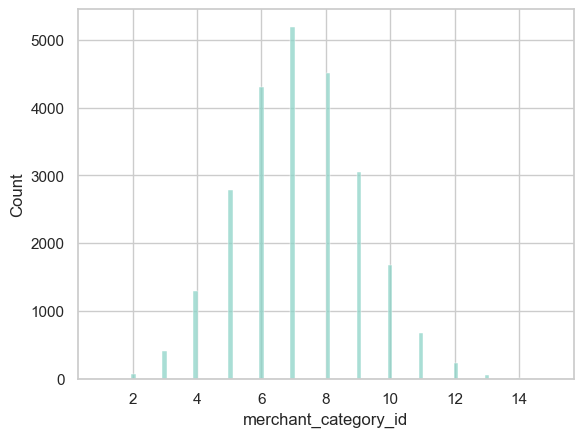

7.173019201513096

In [1116]:
sns.histplot(data=df_persona.groupby('user_id')['merchant_category_id'].nunique())
plt.show()

df_persona.groupby('user_id')['merchant_category_id'].nunique().mean()

In [1117]:
df_personality = pd.DataFrame(df_persona.groupby('user_id')['merchant_category_id'].nunique())
df_personality

,merchant_category_id
user_id,
U00001,9
U00002,5
U00003,7
U00004,7
U00005,9
...,...
U24317,8
U24318,5
U24319,5


In [1118]:
# Create the 'Openness' column based on the condition
df_personality['Openness'] = df_personality['merchant_category_id'].apply(lambda x: 1 if x >= 6 else 0)
df_personality

,merchant_category_id,Openness
user_id,,
U00001,9,1
U00002,5,0
U00003,7,1
U00004,7,1
U00005,9,1
...,...,...
U24317,8,1
U24318,5,0
U24319,5,0


### **Conscientiousness**


In [1119]:
df_persona[df_persona['discount_applied']=='yes'].groupby('user_id')['transaction_id'].count()

user_id
U00001    2
U00002    1
U00003    1
U00006    2
U00007    2
         ..
U24316    2
U24317    2
U24319    3
U24320    2
U24321    2
Name: transaction_id, Length: 20803, dtype: int64

In [1120]:
df_persona[df_persona['discount_applied']=='yes'].groupby('user_id')['transaction_id'].count().shape

(20803,)

<Axes: xlabel='transaction_id', ylabel='Count'>

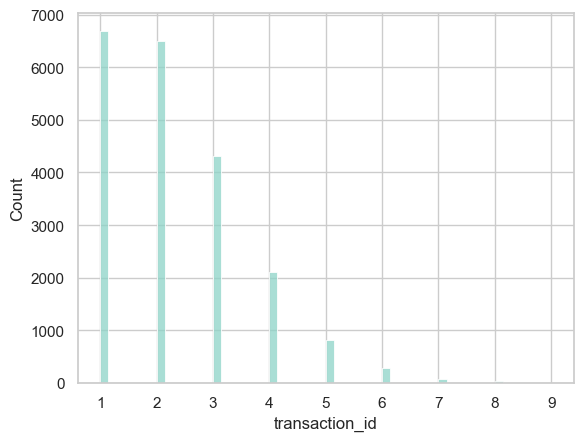

In [1121]:
sns.histplot(data=df_persona[df_persona['discount_applied']=='yes'].groupby('user_id')['transaction_id'].count())

In [1122]:
df_persona[df_persona['discount_applied']=='yes'].groupby('user_id')['transaction_id'].count().median()

2.0

In [1123]:
df_cons = pd.DataFrame(df_persona[df_persona['discount_applied']=='yes'].groupby('user_id')['transaction_id'].count()).reset_index()
df_cons

,user_id,transaction_id
0,U00001,2
1,U00002,1
2,U00003,1
3,U00006,2
4,U00007,2
...,...,...
20798,U24316,2
20799,U24317,2
20800,U24319,3
20801,U24320,2


In [1124]:
# Create the 'Conscientiousness:' column based on the condition
df_personality['Conscientiousness'] =df_persona[df_persona['discount_applied']=='yes'].groupby('user_id')['transaction_id'].count()
df_personality.loc['U11690']

# # Create the 'Conscientiousness:' column based on the condition
df_personality['Conscientiousness'] = df_personality['Conscientiousness'].apply(lambda x: 1 if x > 2 else 0)
df_personality.head()

,merchant_category_id,Openness,Conscientiousness
user_id,,,
U00001,9,1,0
U00002,5,0,0
U00003,7,1,0
U00004,7,1,0
U00005,9,1,0


### **Extraversion**

In [1125]:
# Create the 'extro_mcc' column based on the condition
extro_mcc_list = ['5812', '5814', '5941', '5411', '5311', '5999', '5661', '7230', '4722', '7944']
df_persona['extro_mcc'] = df_persona['merchant_category_id'].apply(lambda x: 1 if str(x) in extro_mcc_list else 0)
df_persona.head()


,transaction_id,user_id,transaction_amount,transaction_date,merchant_id,merchant_name,merchant_category_id,geo_location,payment_method,user_agent,loyalty_program,discount_applied,promo_amount,transaction_notes,merchant_rating,transaction_status,is_refunded,extro_mcc
0,4a71b7d1-34fa-45cf-b40a-a730d16ce617,U10578,23500.0,2024-05-09,M04936,Cox Inc,5732,"-7.974781, 112.633863",balance,Android 9,no,no,0.0,no,5,completed,no,0
1,b29665c0-8373-4ec1-a121-a041c77ffb51,U08353,150500.0,2024-05-30,M06359,"King, Rice and Ramirez",5812,"-6.188155, 106.817086",balance,iPhone; CPU iPhone OS 3_1_3 like Mac OS X,no,no,0.0,yes,2,completed,no,1
2,3e32187b-b374-4f1b-a64e-b1ebcc856563,U04564,65800.0,2024-03-08,M01710,"Lyons, Porter and Williams",5812,"-7.962043, 112.637274",credit_card,Android 2.0.1,no,no,0.0,no,3,completed,no,1
3,df8ad42e-aaf6-46d2-8d8f-1e291a4554bd,U22797,45600.0,2024-05-14,M02852,Smith Ltd,5411,"-6.592793, 106.806543",balance,iPad; CPU iPad OS 9_3_5 like Mac OS X,no,no,0.0,no,3,completed,no,1
4,334468df-4d71-4e4a-935c-32c17c306611,U18053,8500.0,2024-04-09,M00722,Bush Group,5411,"-6.269386, 106.979043",balance,Android 2.0.1,yes,no,0.0,no,4,completed,no,1


In [1126]:
df_persona.groupby('user_id')['extro_mcc'].sum()

user_id
U00001     4
U00002     8
U00003     7
U00004     5
U00005     5
          ..
U24317    10
U24318     7
U24319     9
U24320    12
U24321     5
Name: extro_mcc, Length: 24321, dtype: int64

In [1127]:
df_persona.groupby('user_id')['extro_mcc'].sum().shape

(24321,)

<Axes: xlabel='extro_mcc', ylabel='Count'>

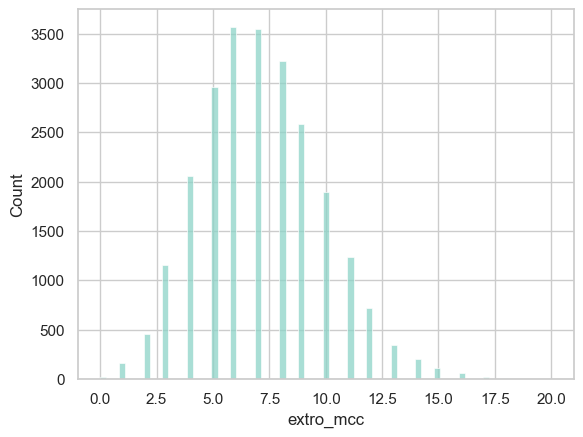

In [1128]:
sns.histplot(data=df_persona.groupby('user_id')['extro_mcc'].sum())

In [1129]:
df_persona.groupby('user_id')['extro_mcc'].sum().mean()

7.169976563463673

In [1130]:
# Create the 'Extraversion' column based on the condition
df_personality['Extraversion'] = df_persona.groupby('user_id')['extro_mcc'].sum()

# Create the 'Extraversion' column based on the condition
df_personality['Extraversion'] = df_personality['Extraversion'].apply(lambda x: 1 if x >= 7 else 0)
df_personality.head()

,merchant_category_id,Openness,Conscientiousness,Extraversion
user_id,,,,
U00001,9,1,0,0
U00002,5,0,0,1
U00003,7,1,0,1
U00004,7,1,0,0
U00005,9,1,0,0


### **Agreeableness**

<Axes: xlabel='transaction_status', ylabel='count'>

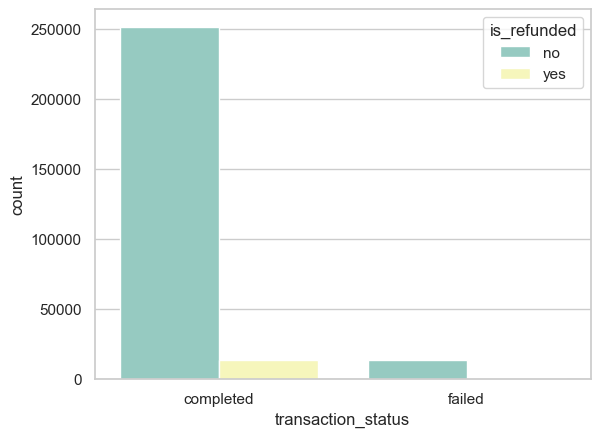

In [1131]:
sns.countplot(data=df_persona,x='transaction_status',hue='is_refunded')

In [1132]:
df_persona[df_persona['is_refunded'] == 'yes']['merchant_rating'].median()

4.0

In [1133]:
df_persona[(df_persona['is_refunded'] == 'yes') & (df_persona['merchant_rating'] < 4)].groupby('user_id')['transaction_id'].count()

user_id
U00006    1
U00010    2
U00020    1
U00025    1
U00027    1
         ..
U24297    1
U24300    1
U24307    1
U24310    1
U24321    1
Name: transaction_id, Length: 4583, dtype: int64

In [1134]:
# Create the 'agreeableness:' column based on the condition
df_personality['agreeableness'] = df_persona[(df_persona['is_refunded'] == 'yes') & (df_persona['merchant_rating'] < 4)].groupby('user_id')['transaction_id'].count()


# # Create the 'agreeableness:' column based on the condition
df_personality['agreeableness'] = df_personality['agreeableness'].apply(lambda x: 0 if x > 1 else 1)
df_personality.head()

,merchant_category_id,Openness,Conscientiousness,Extraversion,agreeableness
user_id,,,,,
U00001,9,1,0,0,1
U00002,5,0,0,1,1
U00003,7,1,0,1,1
U00004,7,1,0,0,1
U00005,9,1,0,0,1


### **Neuroticism**

In [1135]:
# Calculate average transaction and standard deviation for each user
user_stats = df_persona.groupby('user_id').agg(
    average_transaction=('transaction_amount', 'mean'),
    spending_variance=('transaction_amount', 'std')
).reset_index()

# Display the resulting DataFrame
user_stats.head()

,user_id,average_transaction,spending_variance
0,U00001,46781.818182,40790.509146
1,U00002,36450.000000,34786.946786
2,U00003,91627.272727,75100.214259
3,U00004,47866.666667,53745.162573
4,U00005,79520.000000,105402.274907


<Axes: xlabel='spending_variance', ylabel='Count'>

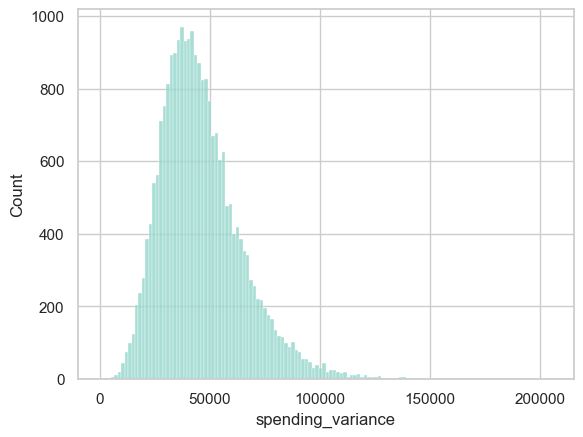

In [1136]:
sns.histplot(data=user_stats,x='spending_variance')

In [1137]:
user_stats.describe()

,average_transaction,spending_variance
count,24321.000000,24321.000000
mean,50077.054473,46349.985740
std,15446.004211,18718.744317
min,5066.666667,353.553391
25%,39333.333333,33236.088279
50%,48546.153846,43508.178959
75%,59091.666667,56210.284148
max,179514.285714,205242.512769


In [1138]:
# Define the threshold for neuroticism categorization
threshold = 43508.178959

# Apply the lambda function to create the 'Neuroticism' column
user_stats['Neuroticism'] = user_stats['spending_variance'].apply(lambda x: 1 if x > threshold else 0)


In [1139]:
user_stats

,user_id,average_transaction,spending_variance,Neuroticism
0,U00001,46781.818182,40790.509146,0
1,U00002,36450.000000,34786.946786,0
2,U00003,91627.272727,75100.214259,1
3,U00004,47866.666667,53745.162573,1
4,U00005,79520.000000,105402.274907,1
...,...,...,...,...
24316,U24317,40126.666667,36290.484126,0
24317,U24318,38555.555556,31702.961656,0
24318,U24319,33981.818182,20390.282891,0
24319,U24320,41168.750000,28842.115474,0


In [1140]:
df_personality

,merchant_category_id,Openness,Conscientiousness,Extraversion,agreeableness
user_id,,,,,
U00001,9,1,0,0,1
U00002,5,0,0,1,1
U00003,7,1,0,1,1
U00004,7,1,0,0,1
U00005,9,1,0,0,1
...,...,...,...,...,...
U24317,8,1,0,1,1
U24318,5,0,0,1,1
U24319,5,0,1,1,1


In [1141]:
# Merge the Neuroticism data into df_personality
df_personality = df_personality.merge(user_stats[['user_id', 'Neuroticism']], on='user_id', how='left')

# Display the updated df_personality DataFrame
df_personality

,user_id,merchant_category_id,Openness,Conscientiousness,Extraversion,agreeableness,Neuroticism
0,U00001,9,1,0,0,1,0
1,U00002,5,0,0,1,1,0
2,U00003,7,1,0,1,1,1
3,U00004,7,1,0,0,1,1
4,U00005,9,1,0,0,1,1
...,...,...,...,...,...,...,...
24316,U24317,8,1,0,1,1,0
24317,U24318,5,0,0,1,1,0
24318,U24319,5,0,1,1,1,0
24319,U24320,8,1,0,1,1,0


## **Health Status**

To define health status, I focus on recency. Specifically, I look at when a user last made a transaction at a merchant categorized as 5912 (Drug Stores and Pharmacies) and how many transactions they have made at this merchant.

The process involves the following steps:

1. Data Manipulation: I analyze the transaction data to identify the last transaction date and the count of transactions for each user at the merchant 5912.

2. Central Tendency Calculation: I calculate the central tendency for both recency and transaction count at this merchant.

3. Classification: A user is considered unhealthy (coded as 1) if they have made a transaction at merchant 5912 within the past 17 days and have completed more than one transaction.

This approach allows me to assess users' health status based on their purchasing behavior related to pharmacy transactions.

In [1142]:
df_persona[df_persona['merchant_category_id']==5912].groupby('user_id')['transaction_id'].count()

user_id
U00001    1
U00003    1
U00005    1
U00010    1
U00013    2
         ..
U24314    2
U24315    1
U24317    3
U24318    1
U24319    1
Name: transaction_id, Length: 16261, dtype: int64

In [1143]:
# Step 1: Filter the DataFrame for the specific merchant category
filter_df_health = df_persona[df_persona['merchant_category_id'] == 5912]

# Step 2: Convert transaction_date to datetime if it is not already
filter_df_health['transaction_date'] = pd.to_datetime(filter_df_health['transaction_date'])

# Step 3: Calculate recency for each user based on the fixed date
fixed_date = pd.to_datetime('2024-05-31')

# Find the most recent transaction date for each user
recency_df = filter_df_health.groupby('user_id')['transaction_date'].max().reset_index()

# Step 4: Calculate recency as the difference from the fixed date
recency_df['recency'] = (fixed_date - recency_df['transaction_date']).dt.days

# Display the recency DataFrame
print(recency_df)



      user_id transaction_date  recency
0      U00001       2024-04-13       48
1      U00003       2024-04-08       53
2      U00005       2024-04-10       51
3      U00010       2024-05-31        0
4      U00013       2024-05-23        8
...       ...              ...      ...
16256  U24314       2024-04-08       53
16257  U24315       2024-05-18       13
16258  U24317       2024-05-07       24
16259  U24318       2024-05-08       23
16260  U24319       2024-04-11       50

[16261 rows x 3 columns]


C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\3945896204.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filter_df_health['transaction_date'] = pd.to_datetime(filter_df_health['transaction_date'])


In [1144]:
user_stats.shape

(24321, 4)

In [1145]:
# Count the number of transactions for each user in the specified category
health_counts = (
    df_persona[df_persona['merchant_category_id'] == 5912]
    .groupby('user_id')['transaction_id']
    .count()
    .reset_index()
)

# Rename the count column for clarity
health_counts.rename(columns={'transaction_id': 'health'}, inplace=True)




In [1146]:
# Merge the health counts back to user_stats
user_stats = user_stats.merge(health_counts, on='user_id', how='left')

# Fill NaN values with 0 for users who have no transactions in this category
user_stats['health'].fillna(0, inplace=True)

# Display the updated user_stats DataFrame
user_stats.head()

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\78479330.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  user_stats['health'].fillna(0, inplace=True)


,user_id,average_transaction,spending_variance,Neuroticism,health
0,U00001,46781.818182,40790.509146,0,1.0
1,U00002,36450.000000,34786.946786,0,0.0
2,U00003,91627.272727,75100.214259,1,1.0
3,U00004,47866.666667,53745.162573,1,0.0
4,U00005,79520.000000,105402.274907,1,1.0


In [1147]:
user_stats = user_stats.merge(recency_df[['user_id', 'recency']], on='user_id', how='left')

# Fill NaN values with 0 for users who have no transactions in this category
user_stats['recency'].fillna(0, inplace=True)

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\1703436395.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  user_stats['recency'].fillna(0, inplace=True)


In [1148]:
user_stats

,user_id,average_transaction,spending_variance,Neuroticism,health,recency
0,U00001,46781.818182,40790.509146,0,1.0,48.0
1,U00002,36450.000000,34786.946786,0,0.0,0.0
2,U00003,91627.272727,75100.214259,1,1.0,53.0
3,U00004,47866.666667,53745.162573,1,0.0,0.0
4,U00005,79520.000000,105402.274907,1,1.0,51.0
...,...,...,...,...,...,...
24316,U24317,40126.666667,36290.484126,0,3.0,24.0
24317,U24318,38555.555556,31702.961656,0,1.0,23.0
24318,U24319,33981.818182,20390.282891,0,1.0,50.0
24319,U24320,41168.750000,28842.115474,0,0.0,0.0


In [1149]:
sns.histplot

<function seaborn.distributions.histplot(data=None, *, x=None, y=None, hue=None, weights=None, stat='count', bins='auto', binwidth=None, binrange=None, discrete=None, cumulative=False, common_bins=True, common_norm=True, multiple='layer', element='bars', fill=True, shrink=1, kde=False, kde_kws=None, line_kws=None, thresh=0, pthresh=None, pmax=None, cbar=False, cbar_ax=None, cbar_kws=None, palette=None, hue_order=None, hue_norm=None, color=None, log_scale=None, legend=True, ax=None, **kwargs)>

<Axes: xlabel='recency', ylabel='Count'>

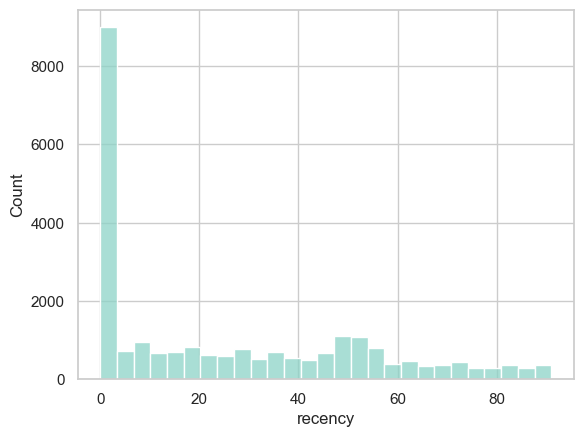

In [1150]:
sns.histplot(data=user_stats,x='recency')

In [1151]:
user_stats['recency'].median()

17.0

<Axes: xlabel='health', ylabel='Count'>

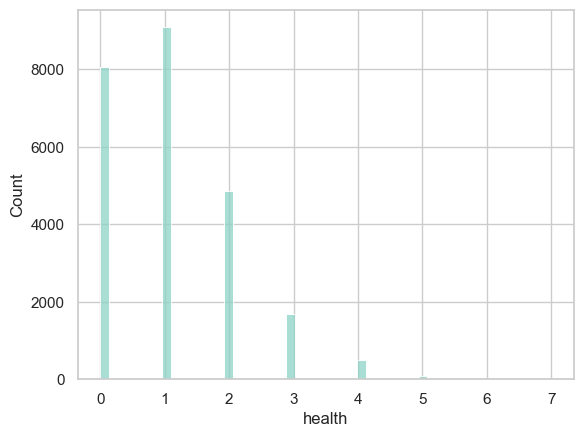

In [1152]:
sns.histplot(data=user_stats,x='health')

In [1153]:
user_stats['health'].value_counts()

health
1.0    9082
0.0    8060
2.0    4864
3.0    1688
4.0     509
5.0      96
6.0      19
7.0       3
Name: count, dtype: int64

In [1154]:
# Create a new column 'status' based on the specified conditions
user_stats['health_status'] = ((user_stats['recency'] <= 17) & (user_stats['health'] > 1)).astype(int)

# Display the updated DataFrame
user_stats.head()

,user_id,average_transaction,spending_variance,Neuroticism,health,recency,health_status
0,U00001,46781.818182,40790.509146,0,1.0,48.0,0
1,U00002,36450.000000,34786.946786,0,0.0,0.0,0
2,U00003,91627.272727,75100.214259,1,1.0,53.0,0
3,U00004,47866.666667,53745.162573,1,0.0,0.0,0
4,U00005,79520.000000,105402.274907,1,1.0,51.0,0


In [1155]:
user_stats['health_status'].value_counts()

health_status
0    21732
1     2589
Name: count, dtype: int64

## **Combine all the features**

In [1156]:
user_features = user_features.merge(user_scores[['user_id','gender']],on='user_id',how='left')
user_features.head(2)

,user_id,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level,vehicle_ownership,gender
0,U00001,19,8,307500.0,38437.500000,5712,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower,1,male
1,U00002,41,9,291800.0,32422.222222,5812,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower,1,male


In [1157]:
user_features = user_features.merge(df_education.reset_index()[['user_id','Age','Education']],on='user_id',how='left')
user_features.head(2)

,user_id,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level,vehicle_ownership,gender,Age,Education
0,U00001,19,8,307500.0,38437.500000,5712,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower,1,male,36-50,University
1,U00002,41,9,291800.0,32422.222222,5812,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower,1,male,51-79,University


In [1158]:
transformed_df.head()

,5411,5311,5712,5651,8220,8211,5251,user_id,Income_Level,Age,parent_score,is_parent
0,-1.0,0.0,1.0,0.0,1.0,1.0,0.0,U00001,0,3,2.6,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,U00002,0,4,2.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,U00003,2,3,2.0,1
3,-1.0,0.0,0.0,0.0,1.0,0.0,1.0,U00004,2,3,2.0,1
4,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,U00005,0,4,1.9,0


In [1159]:
user_features = user_features.merge(transformed_df.reset_index()[['user_id','is_parent']],on='user_id',how='left')
user_features.head(2)

,user_id,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level,vehicle_ownership,gender,Age,Education,is_parent
0,U00001,19,8,307500.0,38437.500000,5712,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower,1,male,36-50,University,1
1,U00002,41,9,291800.0,32422.222222,5812,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower,1,male,51-79,University,1


In [1160]:
df_home

,Income_Level,Age,5712,5251,cluster_home,new_column
user_id,,,,,,
U00001,0,3,1.0,0.0,3,1
U00002,0,4,0.0,0.0,4,1
U00003,2,3,0.0,0.0,1,1
U00004,2,3,0.0,1.0,1,1
U00005,0,4,0.0,0.0,4,1
...,...,...,...,...,...,...
U24317,1,1,0.0,0.0,1,1
U24318,1,3,0.0,1.0,0,1
U24319,0,4,0.0,0.0,4,1


In [1161]:
user_features = user_features.merge(df_home.reset_index()[['user_id','new_column']],on='user_id',how='left')
user_features.head(2)

,user_id,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level,vehicle_ownership,gender,Age,Education,is_parent,new_column
0,U00001,19,8,307500.0,38437.500000,5712,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower,1,male,36-50,University,1,1
1,U00002,41,9,291800.0,32422.222222,5812,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower,1,male,51-79,University,1,1


In [1162]:
user_features.rename(columns={'new_column': 'homeownership'}, inplace=True)


In [1163]:
user_stats.head()

,user_id,average_transaction,spending_variance,Neuroticism,health,recency,health_status
0,U00001,46781.818182,40790.509146,0,1.0,48.0,0
1,U00002,36450.000000,34786.946786,0,0.0,0.0,0
2,U00003,91627.272727,75100.214259,1,1.0,53.0,0
3,U00004,47866.666667,53745.162573,1,0.0,0.0,0
4,U00005,79520.000000,105402.274907,1,1.0,51.0,0


In [1164]:
user_features = user_features.merge(user_stats.reset_index()[['user_id','health_status']],on='user_id',how='left')
user_features.head(2)

,user_id,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level,vehicle_ownership,gender,Age,Education,is_parent,homeownership,health_status
0,U00001,19,8,307500.0,38437.500000,5712,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower,1,male,36-50,University,1,1,0
1,U00002,41,9,291800.0,32422.222222,5812,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower,1,male,51-79,University,1,1,0


In [1165]:
wide_df.columns

Index(['user_id', 'mean_latitude_work', 'mean_latitude_home',
       'mean_longitude_work', 'mean_longitude_home'],
      dtype='object')

In [1166]:
wide_df

,user_id,mean_latitude_work,mean_latitude_home,mean_longitude_work,mean_longitude_home
0,U00001,-6.311689,-6.203557,106.814724,106.813459
1,U00002,-7.608149,-7.258854,112.690022,112.753964
2,U00003,-6.222149,-6.278574,106.864786,106.973935
3,U00004,-6.304743,-6.342578,106.811828,106.810639
4,U00005,-6.243645,-6.399103,106.770801,106.803250
...,...,...,...,...,...
24316,U24317,-6.321744,-6.190229,106.828839,106.816870
24317,U24318,-6.278418,-6.169706,106.838849,106.641183
24318,U24319,-6.291882,NaN,106.840714,NaN
24319,U24320,-7.610460,NaN,112.694864,NaN


In [1167]:
user_features = user_features.merge(wide_df.reset_index(),on='user_id',how='left')
user_features.head(2)

,user_id,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level,vehicle_ownership,gender,Age,Education,is_parent,homeownership,health_status,index,mean_latitude_work,mean_latitude_home,mean_longitude_work,mean_longitude_home
0,U00001,19,8,307500.0,38437.500000,5712,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower,1,male,36-50,University,1,1,0,0,-6.311689,-6.203557,106.814724,106.813459
1,U00002,41,9,291800.0,32422.222222,5812,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower,1,male,51-79,University,1,1,0,1,-7.608149,-7.258854,112.690022,112.753964


In [1168]:
df_personality.columns

Index(['user_id', 'merchant_category_id', 'Openness', 'Conscientiousness',
       'Extraversion', 'agreeableness', 'Neuroticism'],
      dtype='object')

In [1169]:
user_features = user_features.merge(df_personality.reset_index()[['user_id', 'merchant_category_id', 'Openness', 'Conscientiousness',
       'Extraversion', 'agreeableness', 'Neuroticism']],on='user_id',how='left')
user_features.head(2)

,user_id,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level,vehicle_ownership,gender,Age,Education,is_parent,homeownership,health_status,index,mean_latitude_work,mean_latitude_home,mean_longitude_work,mean_longitude_home,merchant_category_id,Openness,Conscientiousness,Extraversion,agreeableness,Neuroticism
0,U00001,19,8,307500.0,38437.500000,5712,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower,1,male,36-50,University,1,1,0,0,-6.311689,-6.203557,106.814724,106.813459,9,1,0,0,1,0
1,U00002,41,9,291800.0,32422.222222,5812,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower,1,male,51-79,University,1,1,0,1,-7.608149,-7.258854,112.690022,112.753964,5,0,0,1,1,0


In [1170]:
user_features['is_parent'].value_counts(normalize=True) * 100

is_parent
0    64.29012
1    35.70988
Name: proportion, dtype: float64

## **Analysis**

In [1171]:
df_persona.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278932 entries, 0 to 278931
Data columns (total 18 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   transaction_id        278932 non-null  object 
 1   user_id               278932 non-null  object 
 2   transaction_amount    278932 non-null  float64
 3   transaction_date      278932 non-null  object 
 4   merchant_id           278932 non-null  object 
 5   merchant_name         278932 non-null  object 
 6   merchant_category_id  278932 non-null  int64  
 7   geo_location          278932 non-null  object 
 8   payment_method        278932 non-null  object 
 9   user_agent            278932 non-null  object 
 10  loyalty_program       278932 non-null  object 
 11  discount_applied      278932 non-null  object 
 12  promo_amount          278932 non-null  float64
 13  transaction_notes     278932 non-null  object 
 14  merchant_rating       278932 non-null  int64  
 15  

In [1172]:
# Change dtype of transaction date
df_persona['transaction_date']=pd.to_datetime(df_persona['transaction_date'])

# Change merchant_category_id into object 
df_persona['merchant_category_id']=df_persona['merchant_category_id'].astype(str)

In [1173]:
df_persona.head()

,transaction_id,user_id,transaction_amount,transaction_date,merchant_id,merchant_name,merchant_category_id,geo_location,payment_method,user_agent,loyalty_program,discount_applied,promo_amount,transaction_notes,merchant_rating,transaction_status,is_refunded,extro_mcc
0,4a71b7d1-34fa-45cf-b40a-a730d16ce617,U10578,23500.0,2024-05-09,M04936,Cox Inc,5732,"-7.974781, 112.633863",balance,Android 9,no,no,0.0,no,5,completed,no,0
1,b29665c0-8373-4ec1-a121-a041c77ffb51,U08353,150500.0,2024-05-30,M06359,"King, Rice and Ramirez",5812,"-6.188155, 106.817086",balance,iPhone; CPU iPhone OS 3_1_3 like Mac OS X,no,no,0.0,yes,2,completed,no,1
2,3e32187b-b374-4f1b-a64e-b1ebcc856563,U04564,65800.0,2024-03-08,M01710,"Lyons, Porter and Williams",5812,"-7.962043, 112.637274",credit_card,Android 2.0.1,no,no,0.0,no,3,completed,no,1
3,df8ad42e-aaf6-46d2-8d8f-1e291a4554bd,U22797,45600.0,2024-05-14,M02852,Smith Ltd,5411,"-6.592793, 106.806543",balance,iPad; CPU iPad OS 9_3_5 like Mac OS X,no,no,0.0,no,3,completed,no,1
4,334468df-4d71-4e4a-935c-32c17c306611,U18053,8500.0,2024-04-09,M00722,Bush Group,5411,"-6.269386, 106.979043",balance,Android 2.0.1,yes,no,0.0,no,4,completed,no,1


In [1174]:
# Dictionary mapping MCC to categories
mcc_to_category = {
    '5732': 'Electronics Stores',
    '5812': 'Eating Places and Restaurants',
    '5411': 'Grocery Stores, Supermarkets',
    '5814': 'Fast Food Restaurants',
    '5964': 'Direct Marketing - Catalog Merchants',
    '5311': 'Department Stores',
    '5999': 'Miscellaneous and Specialty Retail Stores',
    '5912': 'Drug Stores and Pharmacies',
    '5541': 'Service Stations (with or without ancillary services)',
    '5942': 'Book Stores',
    '7230': 'Beauty and Barber Shops',
    '5661': 'Shoe Stores',
    '5712': 'Furniture, Home Furnishings, and Equipment Stores',
    '5651': 'Family Clothing Stores',
    '8220': 'Colleges, Universities, and Professional Schools',
    '5412': 'Convenience Stores',
    '5941': 'Sporting Goods Stores',
    '8211': 'Elementary and Secondary Schools',
    '4722': 'Travel Agencies and Tour Operators',
    '5251': 'Hardware Stores',
    '7994': 'Video Game Arcades/Establishments'
}

# Creating the new category column
df_persona.insert(df_persona.columns.get_loc('merchant_category_id')+1,'category',df_persona['merchant_category_id'].map(mcc_to_category))


In [1175]:
# Create broad category 
mcc_to_broad_category = {
    '5732': 'Retail',
    '5812': 'Food and Beverage',
    '5411': 'Food and Beverage',
    '5814': 'Food and Beverage',
    '5964': 'Retail',
    '5311': 'Retail',
    '5999': 'Retail',
    '5912': 'Health and Wellness',
    '5541': 'Food and Beverage',
    '5942': 'Retail',
    '7230': 'Health and Wellness',
    '5661': 'Retail',
    '5712': 'Home and Lifestyle',
    '5651': 'Retail',
    '8220': 'Education',
    '5412': 'Food and Beverage',
    '5941': 'Retail',
    '8211': 'Education',
    '4722': 'Travel',
    '5251': 'Home and Lifestyle',
    '7994': 'Entertainment'
}

# Creating the new category column
df_persona.insert(df_persona.columns.get_loc('merchant_category_id')+2,'broad_category',df_persona['merchant_category_id'].map(mcc_to_broad_category))


In [1176]:
# Step 1: Count transactions by merchant name
transaction_counts_persona = df_persona.groupby( ['category','merchant_name']).size().reset_index(name='transaction_count')

# Step 2: Get top 3 merchants in each category
top_merchants = (transaction_counts_persona
                 .sort_values(['category', 'transaction_count'], ascending=[True, False])
                 .groupby('category')
                 .head(3))  # Get top 3 merchants for each category

# Step 3: Merge with the broad category
# Assuming df_persona has the broad_category column, we merge it with top_merchants
top_merchants_with_broad = pd.merge(top_merchants, df_persona[['merchant_name', 'broad_category']], on='merchant_name', how='left')

# Step 4: Group only by category and sort merchants by highest transaction count
final_result_category = (top_merchants_with_broad
                         .sort_values(['category', 'transaction_count'], ascending=[True, False])
                         .groupby('category')
                         .head(3)  # Top 3 merchants in each category
                         .reset_index(drop=True))

# Display final result
final_result_category

,category,merchant_name,transaction_count,broad_category
0,Beauty and Barber Shops,Smith PLC,80,Food and Beverage
1,Beauty and Barber Shops,Smith PLC,80,Health and Wellness
2,Beauty and Barber Shops,Smith PLC,80,Food and Beverage
3,Book Stores,Jones and Sons,90,Food and Beverage
4,Book Stores,Jones and Sons,90,Retail
...,...,...,...,...
58,Travel Agencies and Tour Operators,Schroeder-Neal,59,Travel
59,Travel Agencies and Tour Operators,Schroeder-Neal,59,Travel
60,Video Game Arcades/Establishments,Suarez-Brock,53,Entertainment
61,Video Game Arcades/Establishments,Suarez-Brock,53,Entertainment


In [1177]:
for i in df_persona['broad_category'].unique() :
    print(i)
    print(df_persona[df_persona['broad_category']==i]['merchant_name'].iloc[0])
    print('---------------')


Retail
Cox Inc
---------------
Food and Beverage
King, Rice and Ramirez
---------------
Health and Wellness
Harvey, Nichols and Vasquez
---------------
Home and Lifestyle
Ortiz Group
---------------
Education
Gonzalez and Sons
---------------
Travel
Krause-Bryant
---------------
Entertainment
Saunders PLC
---------------


In [1178]:
df_persona['broad_category'].value_counts(normalize=True) * 100

broad_category
Food and Beverage      57.032538
Retail                 22.255604
Health and Wellness    11.379835
Home and Lifestyle      4.889722
Education               1.962485
Travel                  1.568483
Entertainment           0.911333
Name: proportion, dtype: float64

### **Trend Analysis**

In [1179]:
df_trend = pd.DataFrame(df_persona.groupby(['transaction_date','merchant_category_id'])['transaction_id'].count())
df_trend.reset_index(inplace = True)

# Sort the dataframe by date
df_trend = df_trend.sort_values('transaction_date')

# Group by merchant_category_id and date
grouped_df_trend = df_trend.groupby(['merchant_category_id', 'transaction_date']).sum().reset_index()


In [1180]:
# List of dates to exclude
dates_to_exclude = ['2024-04-07', '2024-04-08', '2024-04-09', '2024-04-10', 
                    '2024-04-11', '2024-04-12', '2024-04-13']

# Convert 'transaction_date' to datetime if it isn't already
grouped_df_trend['transaction_date'] = pd.to_datetime(grouped_df_trend['transaction_date'])

# Filter out the dates using .isin() and negate with ~
filtered_df = grouped_df_trend[~grouped_df_trend['transaction_date'].isin(dates_to_exclude)]

# Creating the new category column
filtered_df.insert(3,'category',filtered_df['merchant_category_id'].map(mcc_to_category))

# Creating the new category column
filtered_df.insert(4,'broad_category',filtered_df['merchant_category_id'].map(mcc_to_broad_category))

# Display the filtered dataframe
filtered_df.head()

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\3106525011.py:9: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  filtered_df = grouped_df_trend[~grouped_df_trend['transaction_date'].isin(dates_to_exclude)]


,merchant_category_id,transaction_date,transaction_id,category,broad_category
0,4722,2024-03-01,53,Travel Agencies and Tour Operators,Travel
1,4722,2024-03-02,53,Travel Agencies and Tour Operators,Travel
2,4722,2024-03-03,46,Travel Agencies and Tour Operators,Travel
3,4722,2024-03-04,41,Travel Agencies and Tour Operators,Travel
4,4722,2024-03-05,49,Travel Agencies and Tour Operators,Travel


In [1181]:
filtered_df.groupby('merchant_category_id')[['transaction_id']].sum().sort_values(by='transaction_id',ascending=False)

,transaction_id
merchant_category_id,
5812,55867
5814,31985
5411,22851
5912,22019
5732,11345
5999,11208
5541,10882
5412,10802
5251,6702


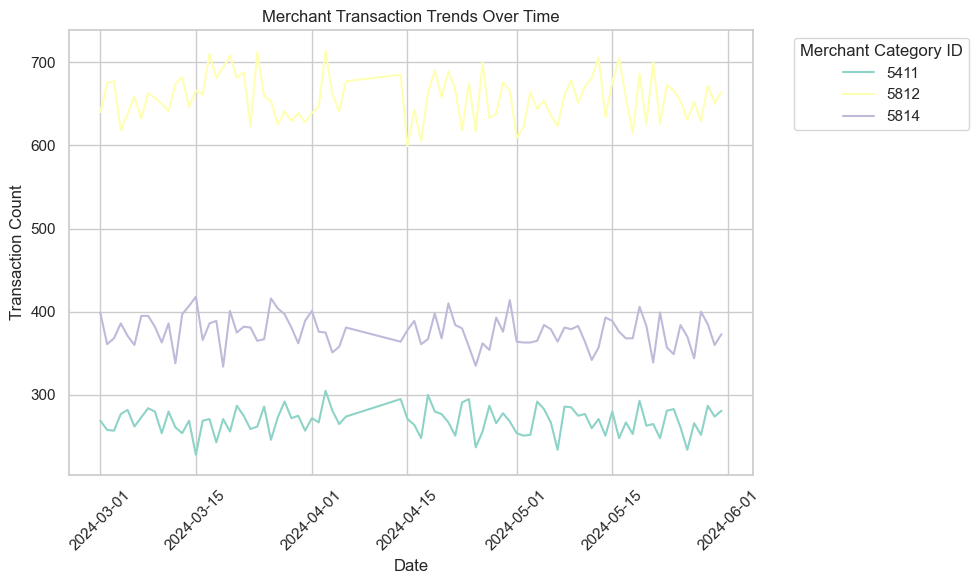

In [1182]:
# Filter the DataFrame for merchant_category_id in ['5812', '5814', '5411']
filtered_merchants = filtered_df[filtered_df['merchant_category_id'].isin(['5812', '5814', '5411'])]

# Plot the trend for each merchant_category_id
plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_merchants, x='transaction_date', y='transaction_id', hue='merchant_category_id')

# Adding titles and labels
plt.title('Merchant Transaction Trends Over Time')
plt.xlabel('Date')
plt.ylabel('Transaction Count')
plt.legend(title='Merchant Category ID', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

### **Period of high transaction**

In [1183]:
# List of dates to exclude
dates_to_include = ['2024-04-07', '2024-04-08', '2024-04-09', '2024-04-10', 
                    '2024-04-11', '2024-04-12', '2024-04-13']

# Convert 'transaction_date' to datetime if it isn't already
grouped_df_trend['transaction_date'] = pd.to_datetime(grouped_df_trend['transaction_date'])

# Filter out the dates using .isin() and negate with ~
filtered_df = grouped_df_trend[grouped_df_trend['transaction_date'].isin(dates_to_include)]

# Creating the new category column
filtered_df.insert(3,'category',filtered_df['merchant_category_id'].map(mcc_to_category))

# Creating the new category column
filtered_df.insert(4,'broad_category',filtered_df['merchant_category_id'].map(mcc_to_broad_category))

# Display the filtered dataframe
filtered_df.head()

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\3532122175.py:9: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  filtered_df = grouped_df_trend[grouped_df_trend['transaction_date'].isin(dates_to_include)]


,merchant_category_id,transaction_date,transaction_id,category,broad_category
37,4722,2024-04-07,106,Travel Agencies and Tour Operators,Travel
38,4722,2024-04-08,108,Travel Agencies and Tour Operators,Travel
39,4722,2024-04-09,121,Travel Agencies and Tour Operators,Travel
40,4722,2024-04-10,112,Travel Agencies and Tour Operators,Travel
41,4722,2024-04-11,122,Travel Agencies and Tour Operators,Travel


In [1184]:
filtered_df.groupby('merchant_category_id')[['transaction_id']].sum().sort_values(by='transaction_id',ascending=False)

,transaction_id
merchant_category_id,
5812,11388
5814,6450
5912,4506
5411,4483
5732,2318
5999,2289
5412,2234
5541,2140
5251,1341


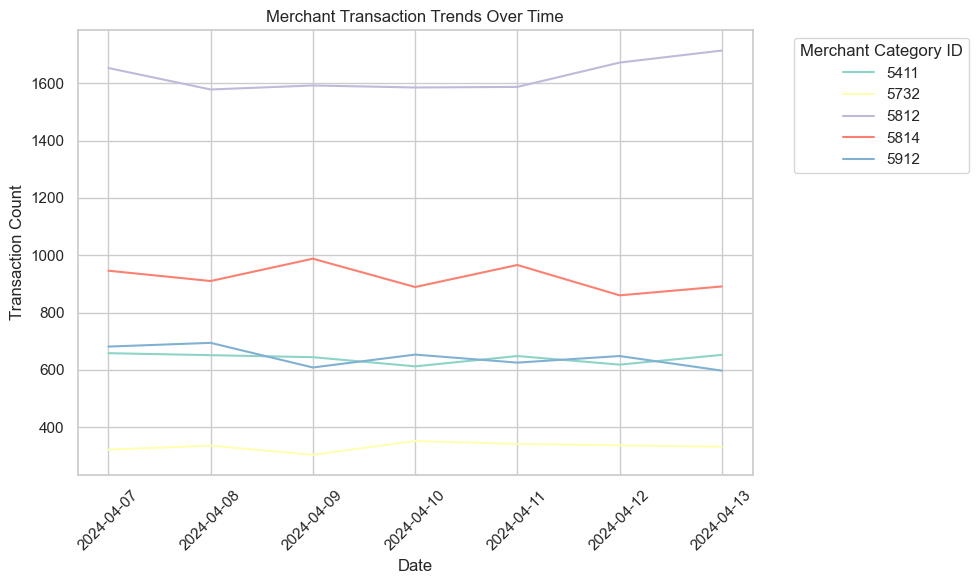

In [1185]:
# Filter the DataFrame for merchant_category_id in ['5812', '5814', '5411']
filtered_merchants = filtered_df[filtered_df['merchant_category_id'].isin(['5812', '5814', '5411','5912','5732'])]

# Plot the trend for each merchant_category_id
plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_merchants, x='transaction_date', y='transaction_id', hue='merchant_category_id')

# Adding titles and labels
plt.title('Merchant Transaction Trends Over Time')
plt.xlabel('Date')
plt.ylabel('Transaction Count')
plt.legend(title='Merchant Category ID', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

In [1186]:
df_persona_peak = df_persona[df_persona['transaction_date'].isin(dates_to_include)]
df_persona_peak.head()

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\3268104822.py:1: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  df_persona_peak = df_persona[df_persona['transaction_date'].isin(dates_to_include)]


,transaction_id,user_id,transaction_amount,transaction_date,merchant_id,merchant_name,merchant_category_id,category,broad_category,geo_location,payment_method,user_agent,loyalty_program,discount_applied,promo_amount,transaction_notes,merchant_rating,transaction_status,is_refunded,extro_mcc
4,334468df-4d71-4e4a-935c-32c17c306611,U18053,8500.0,2024-04-09,M00722,Bush Group,5411,"Grocery Stores, Supermarkets",Food and Beverage,"-6.269386, 106.979043",balance,Android 2.0.1,yes,no,0.0,no,4,completed,no,1
8,d54f8966-74af-4b90-b24b-e58662e1b20c,U04212,46000.0,2024-04-10,M01343,Brown-Hendrix,5964,Direct Marketing - Catalog Merchants,Retail,"-6.165603, 106.630090",balance,Android 5.0.1,yes,no,0.0,no,5,completed,no,0
18,ef76e69b-ec0f-421a-99aa-eaaa8c7f3f52,U21239,28300.0,2024-04-09,M00641,Cole-Walls,5812,Eating Places and Restaurants,Food and Beverage,"-7.962512, 112.624679",balance,Android 7.0,no,yes,5600.0,no,4,completed,no,1
19,208d11d4-0aaa-44db-b352-d9565a030e61,U08532,17200.0,2024-04-09,M04991,Mcknight Inc,5541,Service Stations (with or without ancillary se...,Food and Beverage,"-6.203619, 106.820160",balance,Android 7.1.2,yes,no,0.0,yes,4,failed,no,0
20,0e913a28-05b4-4cf3-8a8f-b3331f8f3a1e,U19083,47300.0,2024-04-07,M01412,Rios Ltd,7230,Beauty and Barber Shops,Health and Wellness,"-6.272990, 106.991135",balance,Android 8.1.0,no,no,0.0,no,2,failed,no,1


In [1187]:
user_features.head(3)

,user_id,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level,vehicle_ownership,gender,Age,Education,is_parent,homeownership,health_status,index,mean_latitude_work,mean_latitude_home,mean_longitude_work,mean_longitude_home,merchant_category_id,Openness,Conscientiousness,Extraversion,agreeableness,Neuroticism
0,U00001,19,8,307500.0,38437.500000,5712,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower,1,male,36-50,University,1,1,0,0,-6.311689,-6.203557,106.814724,106.813459,9,1,0,0,1,0
1,U00002,41,9,291800.0,32422.222222,5812,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower,1,male,51-79,University,1,1,0,1,-7.608149,-7.258854,112.690022,112.753964,5,0,0,1,1,0
2,U00003,10,8,517700.0,64712.500000,5814,1.0,0.0,0.0,0.875000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5814, 5812, 5912, 5964, 5411, 7994]",Up_Middle,0,female,36-50,University,1,1,0,2,-6.222149,-6.278574,106.864786,106.973935,7,1,0,1,1,1


In [1188]:
df_persona_peak = df_persona_peak.merge(user_features[['user_id', 'recency', 'device_age_user', 'Income_Level', 'gender', 'Age']],
                                        on = 'user_id',
                                        how = 'left')

In [1189]:
user_peak = pd.DataFrame(df_persona_peak.groupby('user_id')['transaction_amount'].mean()).reset_index()
user_peak.head()

,user_id,transaction_amount
0,U00001,69425.000000
1,U00002,42900.000000
2,U00003,81633.333333
3,U00004,1100.000000
4,U00005,32700.000000


### **User vs Season**

In [1190]:
# List of dates to exclude
dates_to_exclude = ['2024-04-07', '2024-04-08', '2024-04-09', '2024-04-10', 
                    '2024-04-11', '2024-04-12', '2024-04-13']

df_persona_no_peak = df_persona[~df_persona['transaction_date'].isin(dates_to_exclude)]

df_persona_no_peak.head()

C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\703337309.py:5: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  df_persona_no_peak = df_persona[~df_persona['transaction_date'].isin(dates_to_exclude)]


,transaction_id,user_id,transaction_amount,transaction_date,merchant_id,merchant_name,merchant_category_id,category,broad_category,geo_location,payment_method,user_agent,loyalty_program,discount_applied,promo_amount,transaction_notes,merchant_rating,transaction_status,is_refunded,extro_mcc
0,4a71b7d1-34fa-45cf-b40a-a730d16ce617,U10578,23500.0,2024-05-09,M04936,Cox Inc,5732,Electronics Stores,Retail,"-7.974781, 112.633863",balance,Android 9,no,no,0.0,no,5,completed,no,0
1,b29665c0-8373-4ec1-a121-a041c77ffb51,U08353,150500.0,2024-05-30,M06359,"King, Rice and Ramirez",5812,Eating Places and Restaurants,Food and Beverage,"-6.188155, 106.817086",balance,iPhone; CPU iPhone OS 3_1_3 like Mac OS X,no,no,0.0,yes,2,completed,no,1
2,3e32187b-b374-4f1b-a64e-b1ebcc856563,U04564,65800.0,2024-03-08,M01710,"Lyons, Porter and Williams",5812,Eating Places and Restaurants,Food and Beverage,"-7.962043, 112.637274",credit_card,Android 2.0.1,no,no,0.0,no,3,completed,no,1
3,df8ad42e-aaf6-46d2-8d8f-1e291a4554bd,U22797,45600.0,2024-05-14,M02852,Smith Ltd,5411,"Grocery Stores, Supermarkets",Food and Beverage,"-6.592793, 106.806543",balance,iPad; CPU iPad OS 9_3_5 like Mac OS X,no,no,0.0,no,3,completed,no,1
5,0c487b07-7d55-4faf-9fd8-7b664a457f28,U02597,8500.0,2024-05-17,M00873,Chan PLC,5812,Eating Places and Restaurants,Food and Beverage,"-6.264152, 106.992086",balance,Android 3.2.2,no,no,0.0,no,5,completed,no,1


In [1191]:
user_no_peak = pd.DataFrame(df_persona_no_peak.groupby('user_id')['transaction_amount'].median()).reset_index()
user_no_peak.head()

,user_id,transaction_amount
0,U00001,22300.0
1,U00002,19000.0
2,U00003,68700.0
3,U00004,25200.0
4,U00005,54400.0


In [1192]:
user_peak_no_peak = user_peak.merge(user_no_peak,on='user_id',how='left')

user_peak_no_peak['difference'] = (user_peak_no_peak['transaction_amount_x'] - user_peak_no_peak['transaction_amount_y']) / user_peak_no_peak['transaction_amount_y']
user_peak_no_peak.sort_values(by='difference',ascending=False)


,user_id,transaction_amount_x,transaction_amount_y,difference
3855,U04503,120400.000000,3150.0,37.222222
13907,U16293,165100.000000,4450.0,36.101124
13773,U16134,139500.000000,4200.0,32.214286
4512,U05269,139550.000000,4300.0,31.453488
15574,U18253,98600.000000,3100.0,30.806452
...,...,...,...,...
8891,U10390,1000.000000,68800.0,-0.985465
2886,U03364,1000.000000,71150.0,-0.985945
5231,U06100,1000.000000,85900.0,-0.988359
12387,U14487,1000.000000,94050.0,-0.989367


In [1193]:
user_peak_no_peak.describe()

,transaction_amount_x,transaction_amount_y,difference
count,20761.000000,20760.000000,20760.000000
mean,50071.815161,37820.833333,0.672811
std,38254.185289,17301.593844,1.864856
min,1000.000000,1050.000000,-0.989367
25%,23800.000000,25500.000000,-0.372707
50%,41833.333333,35200.000000,0.176247
75%,66050.000000,46962.500000,1.088211
max,587100.000000,171400.000000,37.222222


In [1194]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = user_peak_no_peak['difference'].quantile(0.25)
Q3 = user_peak_no_peak['difference'].quantile(0.75)

# Calculate IQR
IQR = Q3 - Q1

# Define the lower and upper bounds for detecting outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR


print(lower_bound)
print(upper_bound)

-2.5640842122023395
3.2795882375244183


In [1195]:
user_peak_no_peak['category'] = user_peak_no_peak['difference'].apply(
    lambda x: 3 if x >= 3.2795 else (2 if 1.088211 <= x < 3.2795 else (1 if 0.176247 <= x < 1.088211 else 0))
)
user_peak_no_peak.head()

,user_id,transaction_amount_x,transaction_amount_y,difference,category
0,U00001,69425.000000,22300.0,2.113229,2
1,U00002,42900.000000,19000.0,1.257895,2
2,U00003,81633.333333,68700.0,0.188258,1
3,U00004,1100.000000,25200.0,-0.956349,0
4,U00005,32700.000000,54400.0,-0.398897,0


In [1196]:
user_peak_no_peak['category'].value_counts(normalize = True) * 100

category
0    50.002408
1    24.998796
2    18.688888
3     6.309908
Name: proportion, dtype: float64

In [1197]:
user_peak_no_peak.shape

(20761, 5)

In [1198]:
user_peak_no_peak[user_peak_no_peak['difference'] >= 0.10].shape

(11008, 5)

In [1199]:
user_peak_no_peak[(user_peak_no_peak['difference'] >=0.176247) & (user_peak_no_peak['difference'] < 1.08)]

,user_id,transaction_amount_x,transaction_amount_y,difference,category
2,U00003,81633.333333,68700.0,0.188258,1
14,U00017,47400.000000,23900.0,0.983264,1
27,U00031,88700.000000,61000.0,0.454098,1
28,U00032,89000.000000,50300.0,0.769384,1
33,U00038,39725.000000,32600.0,0.218558,1
...,...,...,...,...,...
20744,U24303,43350.000000,33900.0,0.278761,1
20749,U24309,32766.666667,23750.0,0.379649,1
20753,U24313,70625.000000,58200.0,0.213488,1
20755,U24315,74825.000000,55950.0,0.337355,1


In [1200]:
user_peak_no_peak[(user_peak_no_peak['difference'] >=1.088211) & (user_peak_no_peak['difference'] < 3.2795)].describe()

,transaction_amount_x,transaction_amount_y,difference,category
count,3880.000000,3880.000000,3880.000000,3880.0
mean,80581.603062,28533.685567,1.872423,2.0
std,32912.342245,11316.820773,0.590327,0.0
min,12700.000000,4050.000000,1.088315,2.0
25%,57150.000000,20400.000000,1.375421,2.0
50%,75316.666667,26950.000000,1.739556,2.0
75%,98325.000000,35012.500000,2.262996,2.0
max,243100.000000,95000.000000,3.277143,2.0


In [1201]:
user_peak_no_peak[user_peak_no_peak['difference'] >= 3.2795]

,user_id,transaction_amount_x,transaction_amount_y,difference,category
8,U00010,64433.333333,9900.0,5.508418,3
9,U00011,51660.000000,11600.0,3.453448,3
51,U00060,277500.000000,35200.0,6.883523,3
52,U00063,279300.000000,37450.0,6.457944,3
82,U00096,118633.333333,26000.0,3.562821,3
...,...,...,...,...,...
20672,U24215,132700.000000,30600.0,3.336601,3
20681,U24225,235300.000000,40500.0,4.809877,3
20694,U24238,62200.000000,13900.0,3.474820,3
20746,U24306,85650.000000,16300.0,4.254601,3


<Axes: xlabel='difference', ylabel='Count'>

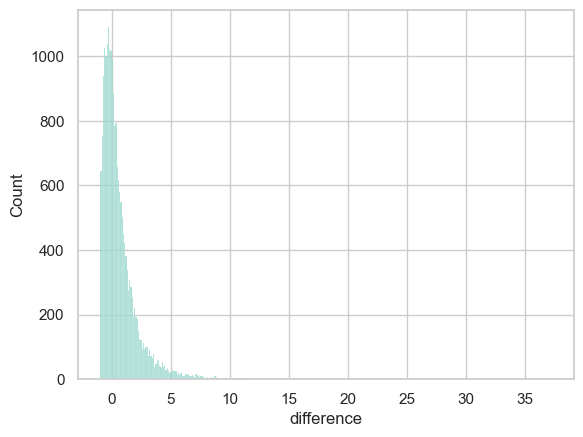

In [1202]:
sns.histplot(user_peak_no_peak,x='difference')

In [1203]:
user_features.columns

Index(['user_id', 'recency', 'transaction_count', 'total_spend',
       'avg_transaction', 'top_category', 'loyalty_participation',
       'promo_usage', 'total_promo', 'preferred_payment',
       'avg_merchant_rating', 'refund_frequency', 'os_type_user',
       'device_type_user', 'device_age_user', 'weekday', 'weekend',
       'all_top_categories', 'Income_Level', 'vehicle_ownership', 'gender',
       'Age', 'Education', 'is_parent', 'homeownership', 'health_status',
       'index', 'mean_latitude_work', 'mean_latitude_home',
       'mean_longitude_work', 'mean_longitude_home', 'merchant_category_id',
       'Openness', 'Conscientiousness', 'Extraversion', 'agreeableness',
       'Neuroticism'],
      dtype='object')

In [1204]:
user_peak_no_peak_combine = user_peak_no_peak.merge(user_features, on='user_id',how='left')
user_peak_no_peak_combine.head()

,user_id,transaction_amount_x,transaction_amount_y,difference,category,recency,transaction_count,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level,vehicle_ownership,gender,Age,Education,is_parent,homeownership,health_status,index,mean_latitude_work,mean_latitude_home,mean_longitude_work,mean_longitude_home,merchant_category_id,Openness,Conscientiousness,Extraversion,agreeableness,Neuroticism
0,U00001,69425.000000,22300.0,2.113229,2,19,8,307500.0,38437.500000,5712,0.0,0.0,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower,1,male,36-50,University,1,1,0,0,-6.311689,-6.203557,106.814724,106.813459,9,1,0,0,1,0
1,U00002,42900.000000,19000.0,1.257895,2,41,9,291800.0,32422.222222,5812,0.0,0.0,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower,1,male,51-79,University,1,1,0,1,-7.608149,-7.258854,112.690022,112.753964,5,0,0,1,1,0
2,U00003,81633.333333,68700.0,0.188258,1,10,8,517700.0,64712.500000,5814,1.0,0.0,0.0,0.875000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5814, 5812, 5912, 5964, 5411, 7994]",Up_Middle,0,female,36-50,University,1,1,0,2,-6.222149,-6.278574,106.864786,106.973935,7,1,0,1,1,1
3,U00004,1100.000000,25200.0,-0.956349,0,19,9,430800.0,47866.666667,5812,0.0,0.0,0.0,1.000000,3.0,0.000000,1.0,1.0,0.0,6.0,3.0,"[5812, 5661, 8220, 5814, 5251, 7994, 5412]",Up_Middle,0,female,36-50,University,1,1,0,3,-6.304743,-6.342578,106.811828,106.810639,7,1,0,0,1,1
4,U00005,32700.000000,54400.0,-0.398897,0,37,8,283600.0,35450.000000,5311,0.0,0.0,0.0,0.875000,4.0,0.125000,1.0,1.0,0.0,7.0,1.0,"[5311, 5912, 8211, 5999, 5812, 5732, 5412, 5814]",Lower,0,female,51-79,University,0,1,0,4,-6.243645,-6.399103,106.770801,106.803250,9,1,0,0,1,1


In [1205]:
user_peak_no_peak_combine.groupby('category')['Neuroticism'].value_counts()

category  Neuroticism
0         0              5297
          1              5084
1         0              2820
          1              2370
2         1              2062
          0              1818
3         1               955
          0               355
Name: count, dtype: int64

#### **Category Peak : 1**

User Count for category = '1': 5190
Description for category = '1':
       transaction_amount_x  transaction_amount_y   difference  category  \
count           5190.000000           5190.000000  5190.000000    5190.0   
mean           55635.302811          35603.102119     0.579278       1.0   
std            21420.695728          13398.974579     0.259301       0.0   
min             5300.000000           2600.000000     0.176264       1.0   
25%            40300.000000          26012.500000     0.352402       1.0   
50%            52900.000000          33900.000000     0.551326       1.0   
75%            67962.500000          43137.500000     0.790417       1.0   
max           189266.666667         105700.000000     1.088176       1.0   

           recency  transaction_count   total_spend  avg_transaction  \
count  5190.000000        5190.000000  5.190000e+03      5190.000000   
mean     10.509056           9.639499  4.171193e+05     43391.992262   
std      10.646758           2.

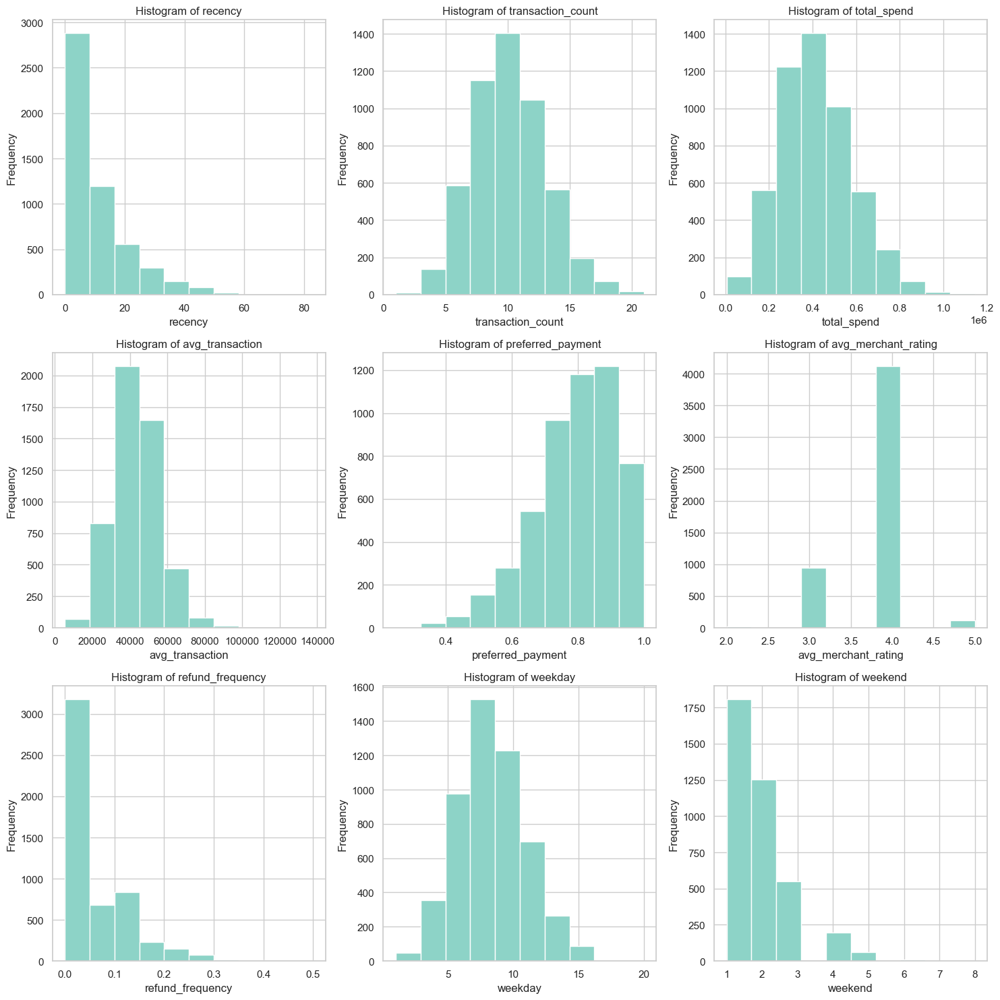

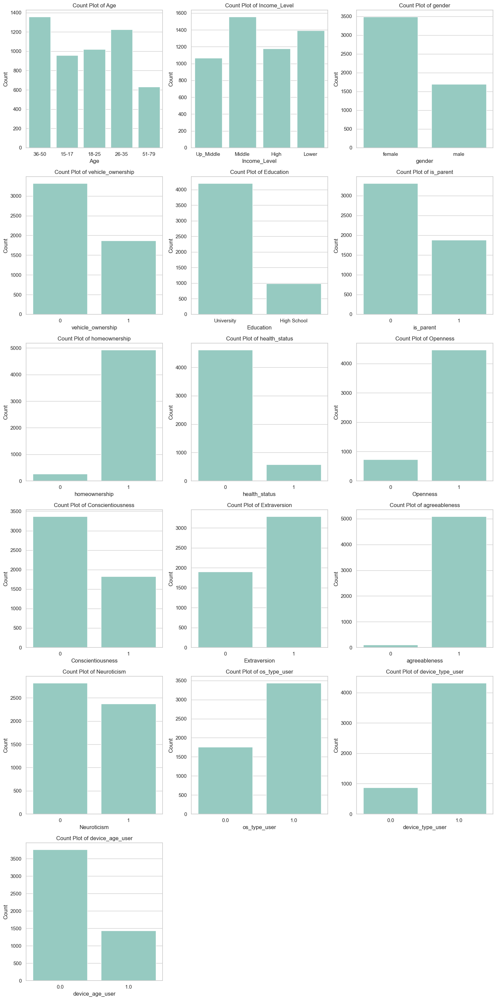

In [1206]:
def analyze_segment(df, segment_column, segment_value):
    # Filter the DataFrame based on the segment
    segment_df = df[df[segment_column] == segment_value]
    
    # Count the number of users in the segment
    user_count = segment_df['user_id'].count()
    print(f"User Count for {segment_column} = '{segment_value}': {user_count}")

    # Describe the filtered DataFrame
    print(f"Description for {segment_column} = '{segment_value}':")
    print(segment_df.describe())
    
    # Select numeric columns for histogram
    test_histogram = segment_df[['recency', 'transaction_count', 'total_spend', 'avg_transaction',
                                 'preferred_payment', 'avg_merchant_rating', 
                                 'refund_frequency', 'weekday', 'weekend']]
    
    # Calculate the number of rows and columns needed for subplots
    num_cols = 3
    num_rows = -(-len(test_histogram.columns) // num_cols)  # Ceiling division

    # Set up subplots for histograms
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    
    # Iterate over each column and plot histogram
    for idx, column in enumerate(test_histogram.columns):
        row = idx // num_cols
        col = idx % num_cols
        axs[row, col].hist(test_histogram[column], bins=10)
        axs[row, col].set_title(f'Histogram of {column}')
        axs[row, col].set_xlabel(column)
        axs[row, col].set_ylabel('Frequency')

    # Remove any unused subplots
    for idx in range(len(test_histogram.columns), num_rows * num_cols):
        row = idx // num_cols
        col = idx % num_cols
        axs[row, col].axis('off')

    plt.tight_layout()
    plt.show()

    # Define features to plot
    features = ['Age', 'Income_Level', 'gender', 'vehicle_ownership', 'Education', 'is_parent', 
                'homeownership', 'health_status', 'Openness', 'Conscientiousness', 
                'Extraversion', 'agreeableness', 'Neuroticism', 'os_type_user', 
                'device_type_user', 'device_age_user']

    # Set up the figure and axes for the count plots
    num_rows = (len(features) + num_cols - 1) // num_cols
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), facecolor='white')
    sns.set(style='whitegrid', palette='Set3')

    # Flatten the axs array for easier iteration
    axs = axs.flatten()

    # Iterate over each feature and create count plots
    for idx, feature in enumerate(features):
        sns.countplot(data=segment_df, x=feature, ax=axs[idx])
        axs[idx].set_title(f'Count Plot of {feature}')
        axs[idx].set_xlabel(feature)
        axs[idx].set_ylabel('Count')

    # Remove any unused subplots
    for idx in range(len(features), num_rows * num_cols):
        axs[idx].axis('off')

    plt.tight_layout()
    plt.show()


analyze_segment(user_peak_no_peak_combine, 'category', 1)

In [1207]:
user_peak_no_peak_combine[user_peak_no_peak_combine['category']==1]['Age'].value_counts(normalize=True) * 100

Age
36-50    26.146435
26-35    23.622351
18-25    19.653179
15-17    18.439306
51-79    12.138728
Name: proportion, dtype: float64

In [1208]:
columns = [ 'device_age_user', 'Income_Level', 'gender', 'Age']
for i in columns :
    print(df_persona_peak[i].value_counts(normalize=True)*100)
    print('----------')


device_age_user
0.0    71.810121
1.0    28.189879
Name: proportion, dtype: float64
----------
Income_Level
Middle       30.732830
Lower        26.908812
High         24.483097
Up_Middle    17.875261
Name: proportion, dtype: float64
----------
gender
female    66.442853
male      33.557147
Name: proportion, dtype: float64
----------
Age
26-35    25.039434
36-50    24.093021
18-25    20.379844
15-17    18.214179
51-79    12.273522
Name: proportion, dtype: float64
----------


User Count for category = '0': 10381
Description for category = '0':
       transaction_amount_x  transaction_amount_y    difference  category  \
count          10381.000000          10380.000000  10380.000000   10381.0   
mean           26768.252313          44691.710019     -0.381574       0.0   
std            16739.528021          18071.211211      0.318330       0.0   
min             1000.000000           3350.000000     -0.989367       0.0   
25%            13925.000000          31800.000000     -0.643169       0.0   
50%            24600.000000          41950.000000     -0.372738       0.0   
75%            36700.000000          54100.000000     -0.113444       0.0   
max           148900.000000         171400.000000      0.176230       0.0   

            recency  transaction_count   total_spend  avg_transaction  \
count  10381.000000       10381.000000  1.038100e+04     10381.000000   
mean      10.821982           9.275503  3.984050e+05     42919.389839   
std       10.90220

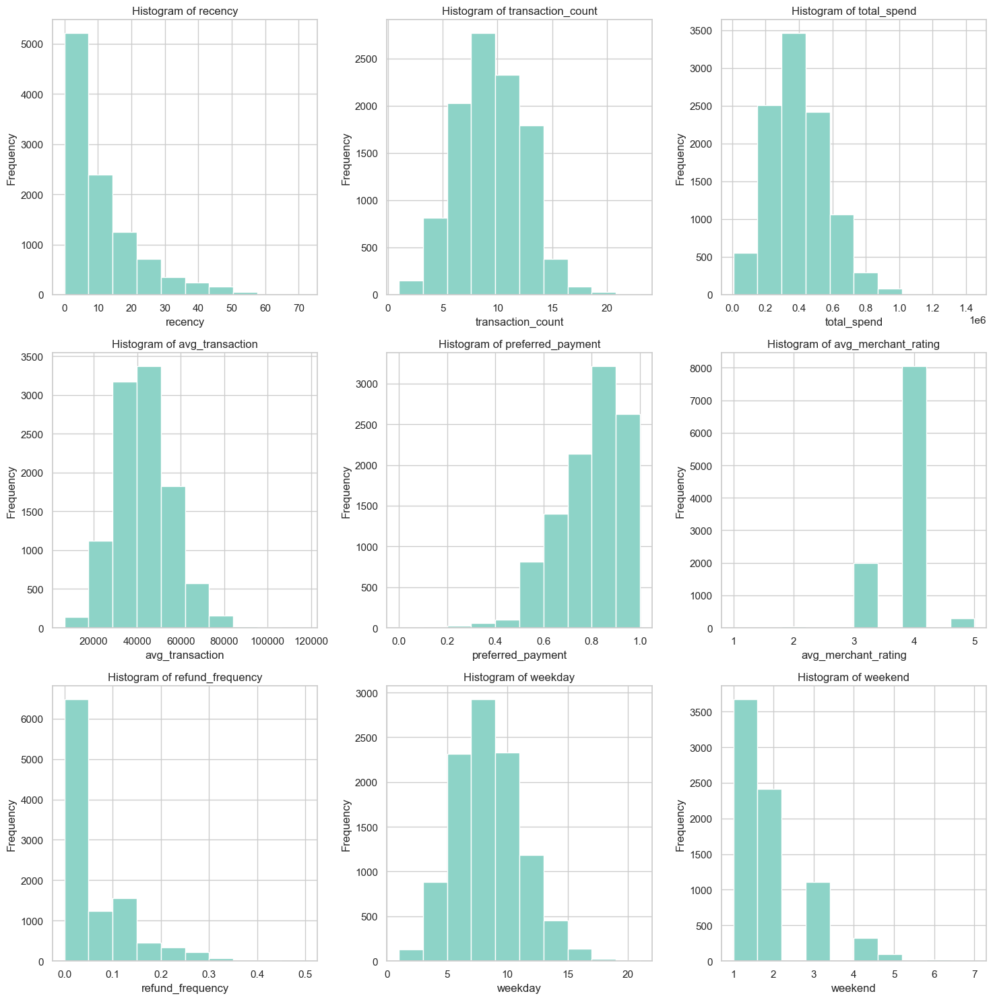

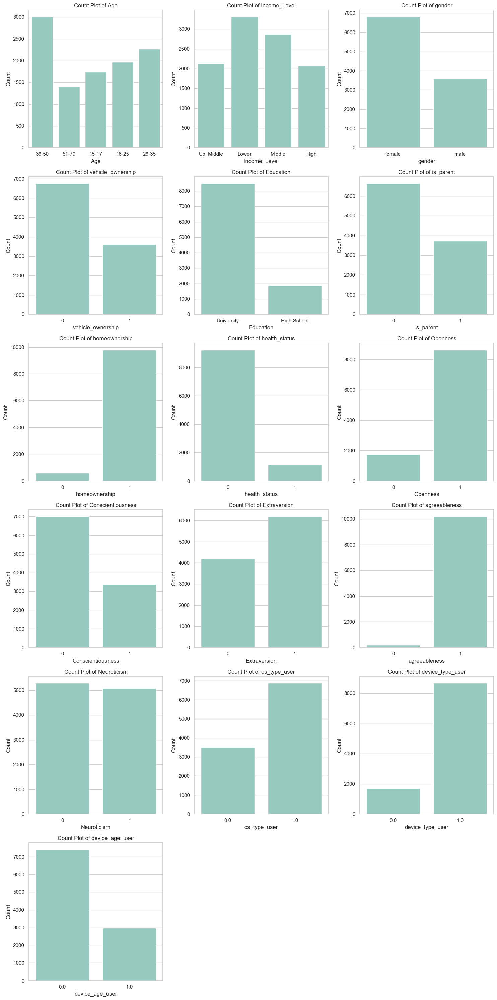

In [1209]:
analyze_segment(user_peak_no_peak_combine, 'category', 0)

In [1210]:
user_peak_no_peak_combine[user_peak_no_peak_combine['category']==0]['Income_Level'].value_counts(normalize=True) * 100

Income_Level
Lower        31.904441
Middle       27.646662
Up_Middle    20.479723
High         19.969174
Name: proportion, dtype: float64

#### **Category Pick 2**

User Count for category = '2': 3880
Description for category = '2':
       transaction_amount_x  transaction_amount_y   difference  category  \
count           3880.000000           3880.000000  3880.000000    3880.0   
mean           80581.603062          28533.685567     1.872423       2.0   
std            32912.342245          11316.820773     0.590327       0.0   
min            12700.000000           4050.000000     1.088315       2.0   
25%            57150.000000          20400.000000     1.375421       2.0   
50%            75316.666667          26950.000000     1.739556       2.0   
75%            98325.000000          35012.500000     2.262996       2.0   
max           243100.000000          95000.000000     3.277143       2.0   

           recency  transaction_count   total_spend  avg_transaction  \
count  3880.000000        3880.000000  3.880000e+03      3880.000000   
mean     10.505412           9.366237  3.897364e+05     41670.834815   
std      10.699918           2.

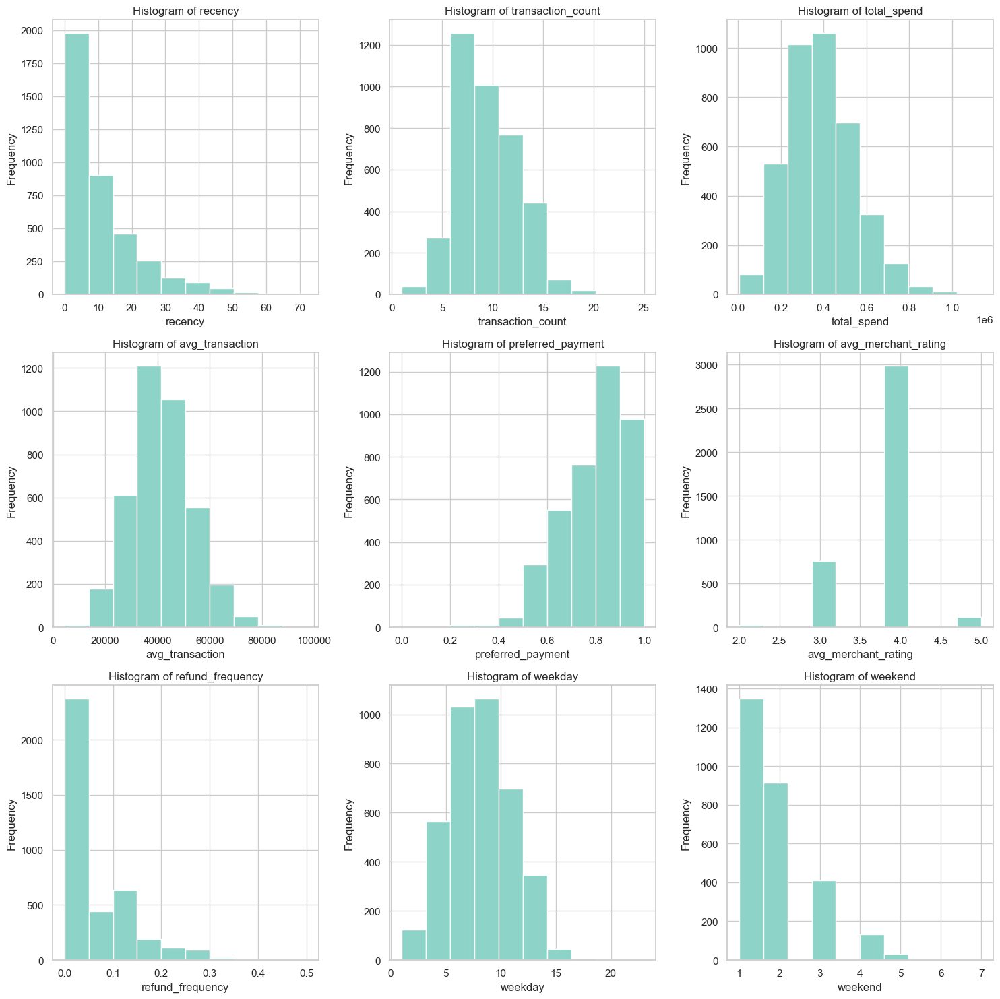

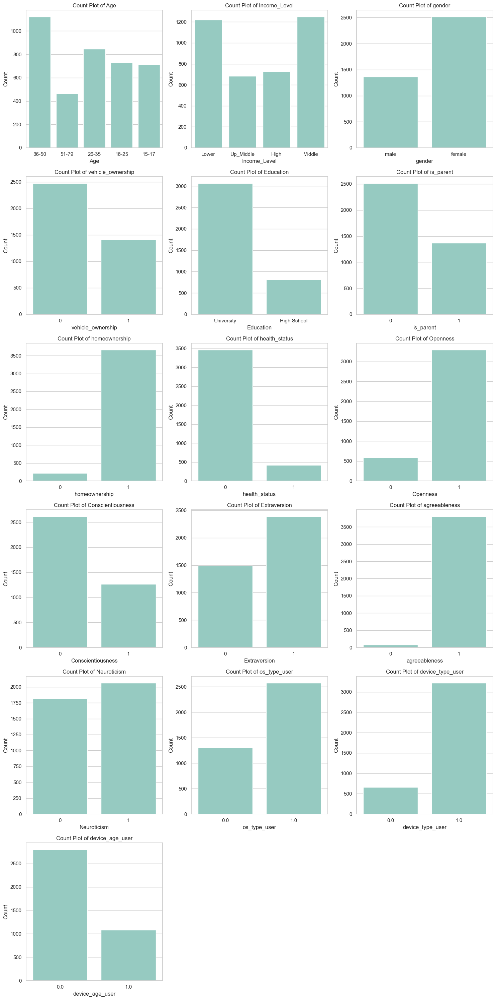

In [1211]:
analyze_segment(user_peak_no_peak_combine, 'category', 2)

In [1212]:
user_peak_no_peak_combine[user_peak_no_peak_combine['category']==2]['Income_Level'].value_counts(normalize=True) * 100

Income_Level
Middle       32.190722
Lower        31.417526
High         18.737113
Up_Middle    17.654639
Name: proportion, dtype: float64

#### **Category Pick : 3**

User Count for category = '3': 1310
Description for category = '3':
       transaction_amount_x  transaction_amount_y   difference  category  \
count           1310.000000           1310.000000  1310.000000    1310.0   
mean          122332.737277          19671.564885     5.844922       3.0   
std            59526.460001           9354.744460     3.627915       0.0   
min            18400.000000           1050.000000     3.282150       3.0   
25%            82125.000000          12912.500000     3.857454       3.0   
50%           112900.000000          18500.000000     4.663854       3.0   
75%           151575.000000          25087.500000     6.420655       3.0   
max           587100.000000          85300.000000    37.222222       3.0   

           recency  transaction_count   total_spend  avg_transaction  \
count  1310.000000        1310.000000    1310.00000      1310.000000   
mean     10.990840           8.488550  312403.51145     36609.657717   
std      11.463893           2.

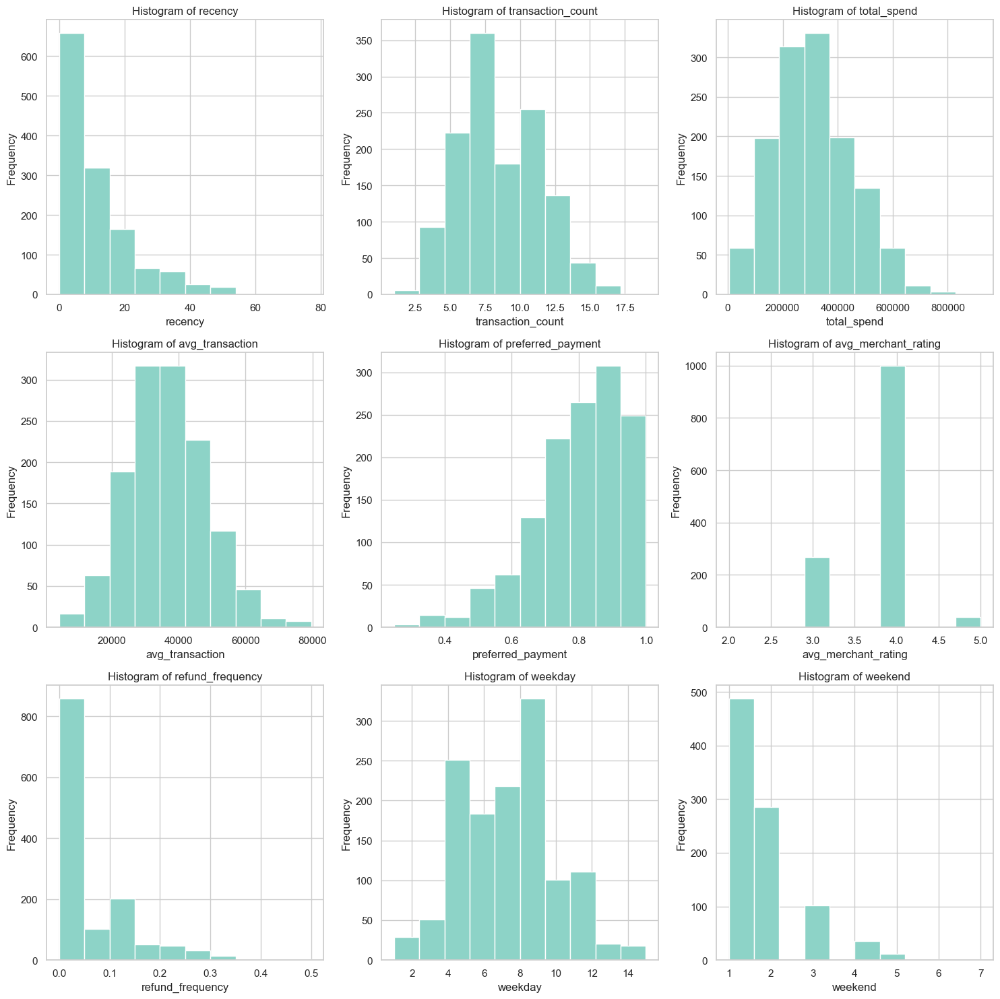

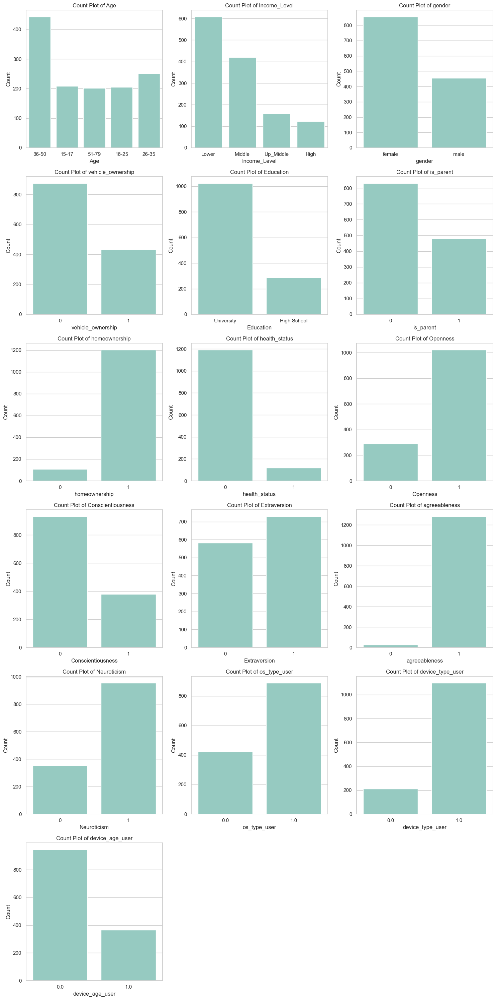

In [1213]:
analyze_segment(user_peak_no_peak_combine, 'category', 3)

In [1214]:
user_peak_no_peak_combine[user_peak_no_peak_combine['category']==3]['Income_Level'].value_counts(normalize=True) * 100

Income_Level
Lower        46.412214
Middle       32.061069
Up_Middle    12.137405
High          9.389313
Name: proportion, dtype: float64

In [1215]:
df_persona_peak['Age'].value_counts()

Age
26-35    11747
36-50    11303
18-25     9561
15-17     8545
51-79     5758
Name: count, dtype: int64

In [1216]:
user_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24321 entries, 0 to 24320
Data columns (total 37 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                24321 non-null  object 
 1   recency                24321 non-null  int64  
 2   transaction_count      24321 non-null  int64  
 3   total_spend            24321 non-null  float64
 4   avg_transaction        24321 non-null  float64
 5   top_category           24321 non-null  object 
 6   loyalty_participation  24321 non-null  float64
 7   promo_usage            24321 non-null  float64
 8   total_promo            24321 non-null  float64
 9   preferred_payment      24321 non-null  float64
 10  avg_merchant_rating    24321 non-null  float64
 11  refund_frequency       24321 non-null  float64
 12  os_type_user           24321 non-null  float64
 13  device_type_user       24321 non-null  float64
 14  device_age_user        24321 non-null  float64
 15  we

In [1217]:
user_features['gender'].value_counts() 

gender
female    15931
male       8390
Name: count, dtype: int64

In [1218]:
user_features['Education'].value_counts(normalize=True) * 100

Education
University     81.156202
High School    18.843798
Name: proportion, dtype: float64

## **Segmentation**

In [1219]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 220461 entries, 0 to 278931
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   transaction_id        220461 non-null  object        
 1   user_id               220461 non-null  object        
 2   transaction_amount    220461 non-null  float64       
 3   transaction_date      220461 non-null  datetime64[ns]
 4   merchant_id           220461 non-null  object        
 5   merchant_name         220461 non-null  object        
 6   merchant_category_id  220461 non-null  object        
 7   category              220461 non-null  object        
 8   broad_category        220461 non-null  object        
 9   geo_location          220461 non-null  object        
 10  payment_method        220461 non-null  object        
 11  user_agent            220461 non-null  object        
 12  loyalty_program       220461 non-null  object        
 13  disc

<Axes: xlabel='transaction_amount', ylabel='Count'>

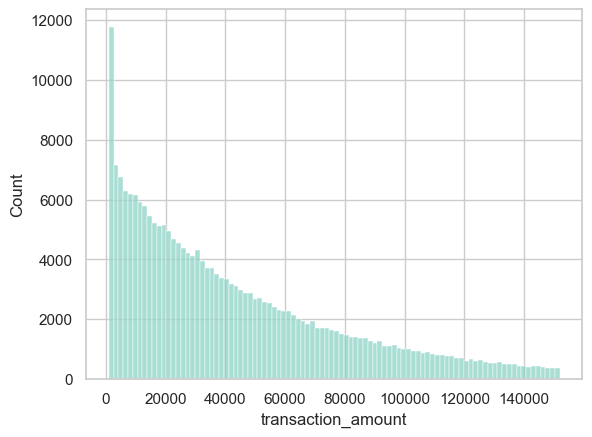

In [1220]:
sns.histplot(data=df,x='transaction_amount')

In [1221]:

# Step 1: Calculate average transaction value and frequency for each customer
customer_stats = df.groupby('user_id').agg({
    'transaction_amount': ['median', 'count'],  # Mean and number of transactions
    'transaction_date': ['min', 'max']  # First and last transaction date for lifespan calculation
})

# Rename columns for easier access
customer_stats.columns = ['avg_transaction_value', 'transaction_count', 'first_purchase', 'last_purchase']

# Step 2: Calculate the customer lifespan in months 
customer_stats['customer_lifespan'] = (customer_stats['last_purchase'] - customer_stats['first_purchase']).dt.days / 30

# Handle any cases where lifespan might be zero (e.g., customers with only one transaction)
customer_stats['customer_lifespan'] = customer_stats['customer_lifespan'].apply(lambda x: max(1, x))  # Avoid zero lifespan

# Step 3: Calculate CLV for each customer
customer_stats['CLV'] = customer_stats['avg_transaction_value'] * customer_stats['transaction_count'] * customer_stats['customer_lifespan']

customer_stats[['avg_transaction_value', 'transaction_count', 'customer_lifespan', 'CLV']]



,avg_transaction_value,transaction_count,customer_lifespan,CLV
user_id,,,,
U00001,36050.0,8,2.200000,634480.0
U00002,19000.0,9,1.466667,250800.0
U00003,68700.0,8,2.300000,1264080.0
U00004,22500.0,9,2.000000,405000.0
U00005,26300.0,8,1.600000,336640.0
...,...,...,...,...
U24317,20700.0,13,2.100000,565110.0
U24318,25000.0,9,1.533333,345000.0
U24319,32300.0,9,1.333333,387600.0


In [1222]:
customer_stats.describe()

,avg_transaction_value,transaction_count,first_purchase,last_purchase,customer_lifespan,CLV
count,24321.000000,24321.000000,24321,24321,24321.000000,2.432100e+04
mean,34843.094445,9.064636,2024-03-11 16:10:00.370050560,2024-05-20 05:57:19.250030848,2.325839,7.508581e+05
min,1100.000000,1.000000,2024-03-01 00:00:00,2024-03-03 00:00:00,1.000000,1.100000e+03
25%,23650.000000,7.000000,2024-03-04 00:00:00,2024-05-16 00:00:00,2.066667,4.099200e+05
50%,32600.000000,9.000000,2024-03-08 00:00:00,2024-05-24 00:00:00,2.433333,6.703200e+05
75%,43500.000000,11.000000,2024-03-16 00:00:00,2024-05-28 00:00:00,2.700000,1.004000e+06
max,145100.000000,25.000000,2024-05-31 00:00:00,2024-05-31 00:00:00,3.033333,4.065240e+06
std,15563.634547,2.994886,NaN,NaN,0.483168,4.556548e+05


In [1223]:
customer_stats[customer_stats['CLV'] > 670000]

,avg_transaction_value,transaction_count,first_purchase,last_purchase,customer_lifespan,CLV
user_id,,,,,,
U00003,68700.0,8,2024-03-13,2024-05-21,2.300000,1.264080e+06
U00008,44700.0,7,2024-03-17,2024-05-24,2.266667,7.092400e+05
U00009,25800.0,13,2024-03-07,2024-05-24,2.600000,8.720400e+05
U00011,26600.0,10,2024-03-04,2024-05-24,2.700000,7.182000e+05
U00017,30750.0,12,2024-03-06,2024-05-05,2.000000,7.380000e+05
...,...,...,...,...,...,...
U24312,39800.0,11,2024-03-20,2024-05-28,2.300000,1.006940e+06
U24313,26550.0,14,2024-03-01,2024-05-30,3.000000,1.115100e+06
U24314,31450.0,10,2024-03-18,2024-05-28,2.366667,7.443167e+05


<Axes: xlabel='CLV'>

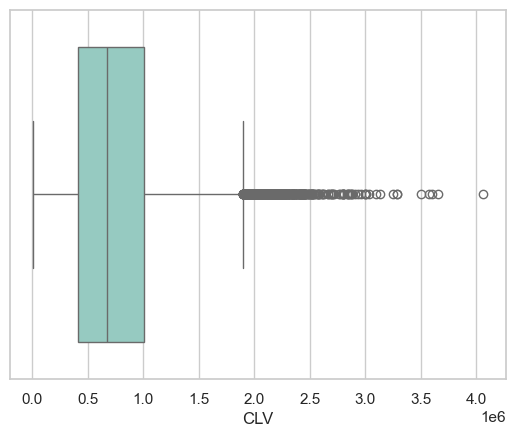

In [1224]:
sns.boxplot(data=customer_stats,x='CLV')

In [1225]:
def remove_outliers(df, column):
    # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    
    # Calculate the Interquartile Range (IQR)
    IQR = Q3 - Q1
    
    # Define the range for non-outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Filter out the outliers
    df_filtered = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    
    print(f"Original data size: {len(df)}")
    print(f"Filtered data size: {len(df_filtered)}")
    
    return df_filtered

# Remove outliers from the 'CLV' column in the customer_stats dataframe
customer_stats_filtered = remove_outliers(customer_stats, 'CLV')


Original data size: 24321
Filtered data size: 23806


In [1226]:


def create_binned_feature(df, feature):
    # Calculate the minimum and maximum values
    min_value = df[feature].min()
    max_value = df[feature].max()
    
    # Calculate the width of each bin
    bin_width = round((max_value - min_value) / 4)

    # Define the bin ranges
    bins = [min_value + i * bin_width for i in range(5)]  # 5 edges create 4 bins
    bins[-1] = max_value + 1e-5  # Ensure the max value is included in the last bin

    # Corresponding bin numbers
    bin_numbers = [1, 2, 3, 4]

    # Create a new column with binned feature values
    binned_column_name = f'{feature}_bin'
    df[binned_column_name] = pd.cut(df[feature], bins=bins, labels=bin_numbers, include_lowest=True)

    # Calculate the proportion of users in each bin
    proportions = (df[binned_column_name].value_counts(normalize=True) * 100).sort_index()

    # Print the proportion for each bin
    print(f"Proportion of users by {feature} range:")
    print(proportions)
    print("Bin edges (min, max):", bins)

    # Return the updated DataFrame
    return df

# Initialize a list to store results for each feature
results = []


create_binned_feature(customer_stats_filtered,'CLV')



Proportion of users by CLV range:
CLV_bin
1    31.781904
2    41.367722
3    20.234395
4     6.615979
Name: proportion, dtype: float64
Bin edges (min, max): [1100.0, 474225.0, 947350.0, 1420475.0, 1893600.00001]


C:\Users\Intania\AppData\Local\Temp\ipykernel_31680\775755492.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[binned_column_name] = pd.cut(df[feature], bins=bins, labels=bin_numbers, include_lowest=True)


,avg_transaction_value,transaction_count,first_purchase,last_purchase,customer_lifespan,CLV,CLV_bin
user_id,,,,,,,
U00001,36050.0,8,2024-03-07,2024-05-12,2.200000,634480.0,2
U00002,19000.0,9,2024-03-07,2024-04-20,1.466667,250800.0,1
U00003,68700.0,8,2024-03-13,2024-05-21,2.300000,1264080.0,3
U00004,22500.0,9,2024-03-13,2024-05-12,2.000000,405000.0,1
U00005,26300.0,8,2024-03-07,2024-04-24,1.600000,336640.0,1
...,...,...,...,...,...,...,...
U24317,20700.0,13,2024-03-05,2024-05-07,2.100000,565110.0,2
U24318,25000.0,9,2024-04-10,2024-05-26,1.533333,345000.0,1
U24319,32300.0,9,2024-03-22,2024-05-01,1.333333,387600.0,1


In [1227]:
customer_stats_filtered.describe()

,avg_transaction_value,transaction_count,first_purchase,last_purchase,customer_lifespan,CLV
count,23806.000000,23806.000000,23806,23806,23806.000000,2.380600e+04
mean,34297.593044,8.961942,2024-03-11 19:32:45.588507136,2024-05-20 02:29:53.497437696,2.316489,7.195232e+05
min,1100.000000,1.000000,2024-03-01 00:00:00,2024-03-03 00:00:00,1.000000,1.100000e+03
25%,23500.000000,7.000000,2024-03-04 00:00:00,2024-05-16 00:00:00,2.033333,4.050417e+05
50%,32100.000000,9.000000,2024-03-09 00:00:00,2024-05-23 00:00:00,2.433333,6.596333e+05
75%,42800.000000,11.000000,2024-03-17 00:00:00,2024-05-28 00:00:00,2.700000,9.764650e+05
max,145100.000000,21.000000,2024-05-31 00:00:00,2024-05-31 00:00:00,3.033333,1.893600e+06
std,15149.716436,2.913350,NaN,NaN,0.483395,4.047073e+05


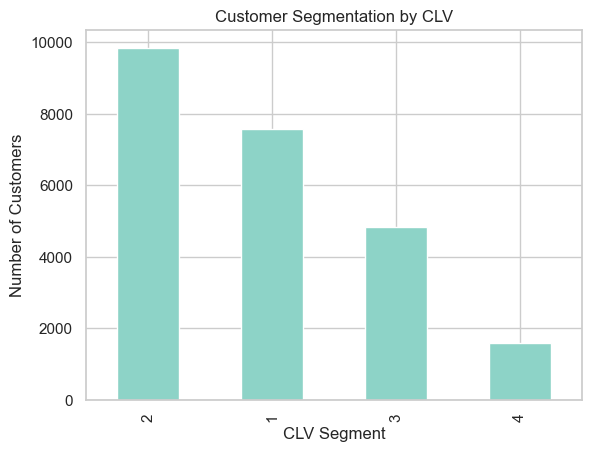

In [1228]:
import matplotlib.pyplot as plt

# Plot the distribution of CLV segments
customer_stats_filtered['CLV_bin'].value_counts().plot(kind='bar', title='Customer Segmentation by CLV')
plt.xlabel('CLV Segment')
plt.ylabel('Number of Customers')
plt.show()


In [1229]:
customer_stats_filtered['CLV_bin'].value_counts(normalize=True)*100

CLV_bin
2    41.367722
1    31.781904
3    20.234395
4     6.615979
Name: proportion, dtype: float64

In [1230]:
customer_stats_filtered

,avg_transaction_value,transaction_count,first_purchase,last_purchase,customer_lifespan,CLV,CLV_bin
user_id,,,,,,,
U00001,36050.0,8,2024-03-07,2024-05-12,2.200000,634480.0,2
U00002,19000.0,9,2024-03-07,2024-04-20,1.466667,250800.0,1
U00003,68700.0,8,2024-03-13,2024-05-21,2.300000,1264080.0,3
U00004,22500.0,9,2024-03-13,2024-05-12,2.000000,405000.0,1
U00005,26300.0,8,2024-03-07,2024-04-24,1.600000,336640.0,1
...,...,...,...,...,...,...,...
U24317,20700.0,13,2024-03-05,2024-05-07,2.100000,565110.0,2
U24318,25000.0,9,2024-04-10,2024-05-26,1.533333,345000.0,1
U24319,32300.0,9,2024-03-22,2024-05-01,1.333333,387600.0,1


In [1231]:
user_features.shape

(24321, 37)

In [1232]:
df_clv_user =  customer_stats_filtered.reset_index().merge(user_features, on ='user_id',how ='left')

In [1233]:
df_clv_user

,user_id,avg_transaction_value,transaction_count_x,first_purchase,last_purchase,customer_lifespan,CLV,CLV_bin,recency,transaction_count_y,total_spend,avg_transaction,top_category,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,all_top_categories,Income_Level,vehicle_ownership,gender,Age,Education,is_parent,homeownership,health_status,index,mean_latitude_work,mean_latitude_home,mean_longitude_work,mean_longitude_home,merchant_category_id,Openness,Conscientiousness,Extraversion,agreeableness,Neuroticism
0,U00001,36050.0,8,2024-03-07,2024-05-12,2.200000,634480.0,2,19,8,307500.0,38437.500000,5712,0.0,0.000000,0.0,0.750000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5712, 5912, 5999, 5541, 5812, 8211, 8220, 5732]",Lower,1,male,36-50,University,1,1,0,0,-6.311689,-6.203557,106.814724,106.813459,9,1,0,0,1,0
1,U00002,19000.0,9,2024-03-07,2024-04-20,1.466667,250800.0,1,41,9,291800.0,32422.222222,5812,0.0,0.000000,0.0,0.777778,4.0,0.111111,1.0,1.0,1.0,8.0,1.0,"[5812, 5541, 5814, 5411, 4722]",Lower,1,male,51-79,University,1,1,0,1,-7.608149,-7.258854,112.690022,112.753964,5,0,0,1,1,0
2,U00003,68700.0,8,2024-03-13,2024-05-21,2.300000,1264080.0,3,10,8,517700.0,64712.500000,5814,1.0,0.000000,0.0,0.875000,4.0,0.000000,1.0,1.0,0.0,7.0,1.0,"[5814, 5812, 5912, 5964, 5411, 7994]",Up_Middle,0,female,36-50,University,1,1,0,2,-6.222149,-6.278574,106.864786,106.973935,7,1,0,1,1,1
3,U00004,22500.0,9,2024-03-13,2024-05-12,2.000000,405000.0,1,19,9,430800.0,47866.666667,5812,0.0,0.000000,0.0,1.000000,3.0,0.000000,1.0,1.0,0.0,6.0,3.0,"[5812, 5661, 8220, 5814, 5251, 7994, 5412]",Up_Middle,0,female,36-50,University,1,1,0,3,-6.304743,-6.342578,106.811828,106.810639,7,1,0,0,1,1
4,U00005,26300.0,8,2024-03-07,2024-04-24,1.600000,336640.0,1,37,8,283600.0,35450.000000,5311,0.0,0.000000,0.0,0.875000,4.0,0.125000,1.0,1.0,0.0,7.0,1.0,"[5311, 5912, 8211, 5999, 5812, 5732, 5412, 5814]",Lower,0,female,51-79,University,0,1,0,4,-6.243645,-6.399103,106.770801,106.803250,9,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23801,U24317,20700.0,13,2024-03-05,2024-05-07,2.100000,565110.0,2,24,13,446400.0,34338.461538,5912,0.0,0.000000,0.0,0.769231,4.0,0.000000,0.0,1.0,0.0,12.0,1.0,"[5912, 5812, 7230, 5412, 5311, 5814, 5411, 5651]",Middle,0,female,18-25,High School,0,1,0,24316,-6.321744,-6.190229,106.828839,106.816870,8,1,0,1,1,0
23802,U24318,25000.0,9,2024-04-10,2024-05-26,1.533333,345000.0,1,5,9,347000.0,38555.555556,5812,0.0,0.000000,0.0,0.666667,4.0,0.000000,1.0,1.0,0.0,8.0,1.0,"[5812, 5814, 5912, 5411, 5251]",Middle,0,male,36-50,University,1,1,0,24317,-6.278418,-6.169706,106.838849,106.641183,5,0,0,1,1,0
23803,U24319,32300.0,9,2024-03-22,2024-05-01,1.333333,387600.0,1,30,9,273600.0,30400.000000,5812,0.0,0.111111,0.0,0.666667,4.0,0.000000,1.0,1.0,0.0,9.0,NaN,"[5812, 5411, 5814, 5912, 5732]",Lower,0,male,51-79,University,1,1,0,24318,-6.291882,NaN,106.840714,NaN,5,0,1,1,1,0
23804,U24320,42900.0,14,2024-03-05,2024-05-27,2.766667,1661660.0,4,4,14,599700.0,42835.714286,5812,0.0,0.000000,0.0,0.714286,3.0,0.000000,1.0,1.0,0.0,14.0,NaN,"[5812, 5814, 5411, 5999, 5251, 5712, 5412]",High,0,female,26-35,University,1,1,0,24319,-7.610460,NaN,112.694864,NaN,8,1,0,1,1,0


In [1234]:
df_clv_user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23806 entries, 0 to 23805
Data columns (total 44 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   user_id                23806 non-null  object        
 1   avg_transaction_value  23806 non-null  float64       
 2   transaction_count_x    23806 non-null  int64         
 3   first_purchase         23806 non-null  datetime64[ns]
 4   last_purchase          23806 non-null  datetime64[ns]
 5   customer_lifespan      23806 non-null  float64       
 6   CLV                    23806 non-null  float64       
 7   CLV_bin                23806 non-null  category      
 8   recency                23806 non-null  int64         
 9   transaction_count_y    23806 non-null  int64         
 10  total_spend            23806 non-null  float64       
 11  avg_transaction        23806 non-null  float64       
 12  top_category           23806 non-null  object        
 13  l

In [1235]:
# Divide feature numeric vs categoric
num_feature = df_clv_user.select_dtypes(include = ['int64','Float64']).columns
print('Numeric features : ')
print(num_feature)

cat_feature = [fea for fea in df_clv_user.columns if fea not in num_feature] 
print('Categoric features :')
print(cat_feature)

Numeric features : 
Index(['avg_transaction_value', 'transaction_count_x', 'customer_lifespan',
       'CLV', 'recency', 'transaction_count_y', 'total_spend',
       'avg_transaction', 'loyalty_participation', 'promo_usage',
       'total_promo', 'preferred_payment', 'avg_merchant_rating',
       'refund_frequency', 'os_type_user', 'device_type_user',
       'device_age_user', 'weekday', 'weekend', 'vehicle_ownership',
       'is_parent', 'index', 'mean_latitude_work', 'mean_latitude_home',
       'mean_longitude_work', 'mean_longitude_home', 'merchant_category_id',
       'Openness', 'Conscientiousness', 'Extraversion', 'agreeableness',
       'Neuroticism'],
      dtype='object')
Categoric features :
['user_id', 'first_purchase', 'last_purchase', 'CLV_bin', 'top_category', 'all_top_categories', 'Income_Level', 'gender', 'Age', 'Education', 'homeownership', 'health_status']


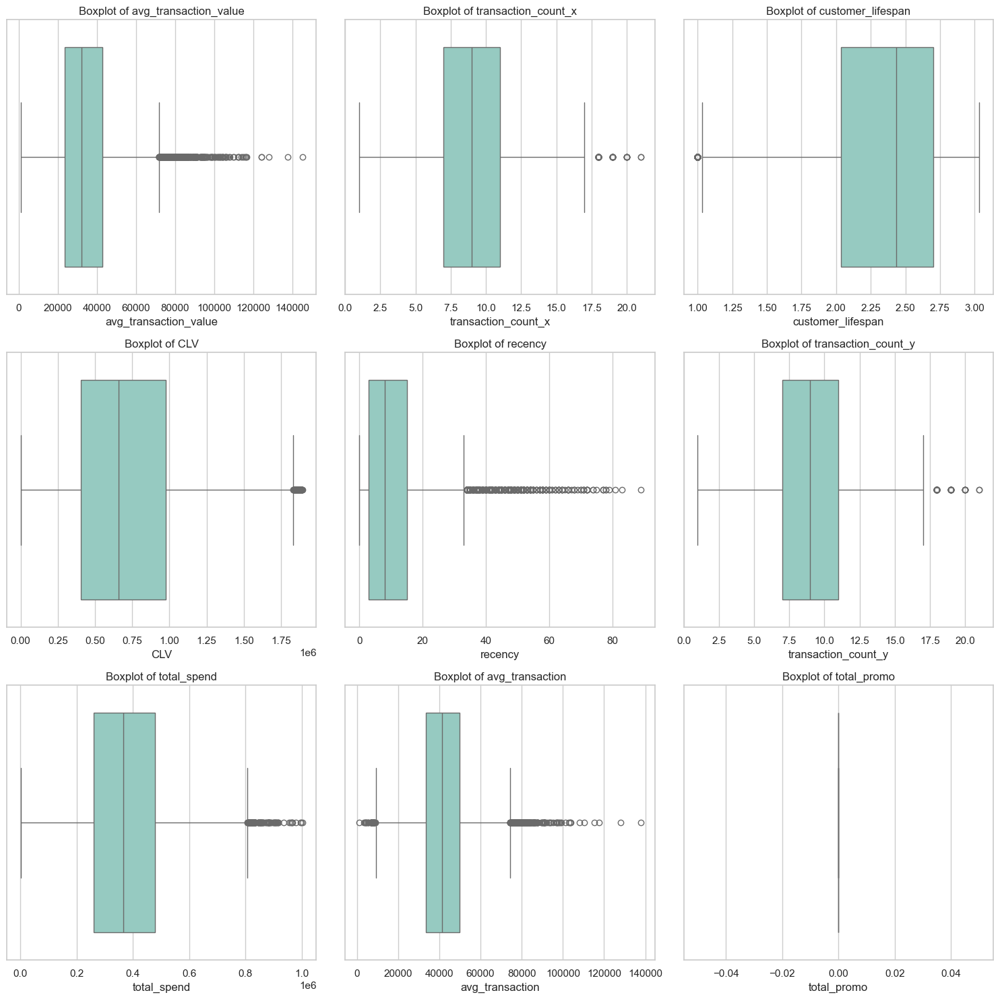

In [1236]:
# Select integer-type columns
test_boxplot = df_clv_user[['avg_transaction_value', 'transaction_count_x', 'customer_lifespan',
       'CLV', 'recency', 'transaction_count_y', 'total_spend',
       'avg_transaction',  'total_promo', ]]

# Calculate the number of rows and columns needed for subplots
num_cols = 3
num_rows = -(-len(test_boxplot.columns) // num_cols)  # Ceiling division to ensure enough rows for all columns

# Set up subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))  # Adjust figsize based on the number of rows

# Iterate over each column and plot boxplot
for idx, column in enumerate(test_boxplot.columns):
    row = idx // num_cols
    col = idx % num_cols
    sns.boxplot(x=test_boxplot[column], ax=axs[row, col])
    axs[row, col].set_title(f'Boxplot of {column}')
    axs[row, col].set_xlabel(column)

# Remove any unused subplots
for idx in range(len(test_boxplot.columns), num_rows*num_cols):
    row = idx // num_cols
    col = idx % num_cols
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

In [1237]:
cat_feature = ['user_id','CLV_bin', 'top_category','Income_Level','gender','Age','Education','homeownership','health_status']

for i in cat_feature : 
    print (i)
    print ("Number of unique value", df_clv_user[i].nunique())
    print (df_clv_user[i].unique(),'\n')

user_id
Number of unique value 23806
['U00001' 'U00002' 'U00003' ... 'U24319' 'U24320' 'U24321'] 

CLV_bin
Number of unique value 4
[2, 1, 3, 4]
Categories (4, int64): [1 < 2 < 3 < 4] 

top_category
Number of unique value 21
['5712' '5812' '5814' '5311' '5412' '5999' '5411' '5912' '5732' '7230'
 '5541' '5251' '5942' '5941' '5661' '5651' '8211' '8220' '5964' '7994'
 '4722'] 

Income_Level
Number of unique value 4
['Lower' 'Up_Middle' 'High' 'Middle'] 

gender
Number of unique value 2
['male' 'female'] 

Age
Number of unique value 5
['36-50' '51-79' '26-35' '15-17' '18-25'] 

Education
Number of unique value 2
['University' 'High School'] 

homeownership
Number of unique value 2
[1 0] 

health_status
Number of unique value 2
[0 1] 



In [1238]:
df_clv_user.columns

Index(['user_id', 'avg_transaction_value', 'transaction_count_x',
       'first_purchase', 'last_purchase', 'customer_lifespan', 'CLV',
       'CLV_bin', 'recency', 'transaction_count_y', 'total_spend',
       'avg_transaction', 'top_category', 'loyalty_participation',
       'promo_usage', 'total_promo', 'preferred_payment',
       'avg_merchant_rating', 'refund_frequency', 'os_type_user',
       'device_type_user', 'device_age_user', 'weekday', 'weekend',
       'all_top_categories', 'Income_Level', 'vehicle_ownership', 'gender',
       'Age', 'Education', 'is_parent', 'homeownership', 'health_status',
       'index', 'mean_latitude_work', 'mean_latitude_home',
       'mean_longitude_work', 'mean_longitude_home', 'merchant_category_id',
       'Openness', 'Conscientiousness', 'Extraversion', 'agreeableness',
       'Neuroticism'],
      dtype='object')

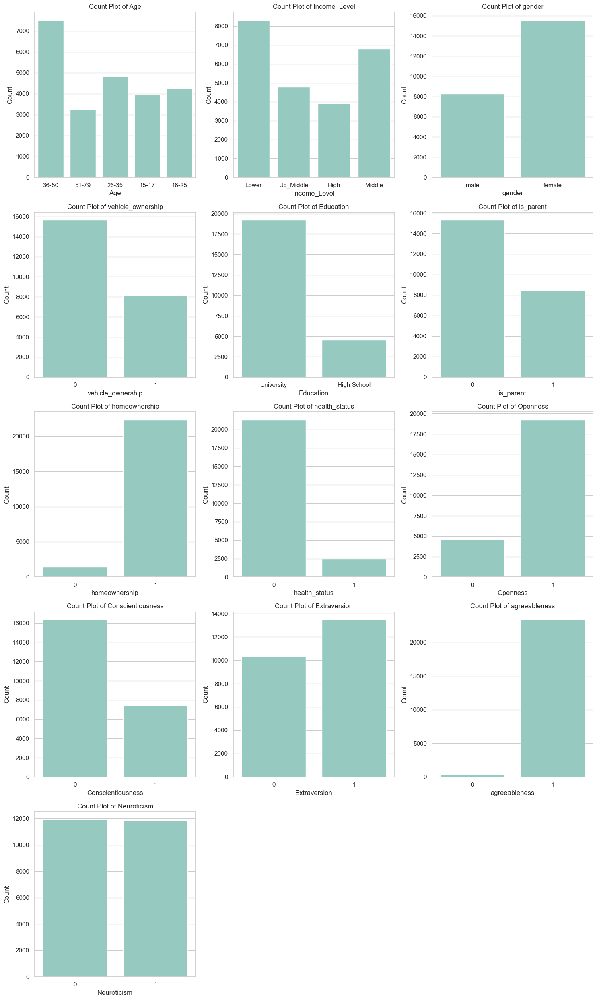

In [1239]:
# Define features to plot
features = ['Age', 'Income_Level', 'gender','vehicle_ownership','Education', 'is_parent', 'homeownership', 'health_status',
             'Openness', 'Conscientiousness', 'Extraversion', 'agreeableness', 'Neuroticism']

# Set up the figure and axes for the subplots
num_cols = 3
num_rows = (len(features) + num_cols - 1) // num_cols  # Calculate number of rows needed
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), facecolor='white')
sns.set(style='whitegrid', palette='Set3')

# Flatten the axs array for easier iteration
axs = axs.flatten()

# Iterate over each feature and create count plots
for idx, feature in enumerate(features):
    sns.countplot(data=df_clv_user, x=feature, ax=axs[idx])
    axs[idx].set_title(f'Count Plot of {feature}')
    axs[idx].set_xlabel(feature)
    axs[idx].set_ylabel('Count')

# Remove any unused subplots if the number of features is less than the grid size
for idx in range(len(features), num_rows * num_cols):
    axs[idx].axis('off')

plt.tight_layout()
plt.show()

### **CLV 1**

User Count for CLV_bin = '1': 7566
Description for CLV_bin = '1':
       avg_transaction_value  transaction_count_x  \
count            7566.000000          7566.000000   
mean            24591.627016             6.732620   
min              1100.000000             1.000000   
25%             16000.000000             5.000000   
50%             21900.000000             7.000000   
75%             30100.000000             8.000000   
max            137800.000000            17.000000   
std             12930.216368             2.213881   

                      first_purchase                  last_purchase  \
count                           7566                           7566   
mean   2024-03-16 22:19:07.660587008  2024-05-14 16:09:19.555908096   
min              2024-03-01 00:00:00            2024-03-03 00:00:00   
25%              2024-03-06 00:00:00            2024-05-07 00:00:00   
50%              2024-03-14 00:00:00            2024-05-19 00:00:00   
75%              2024-03-25 00

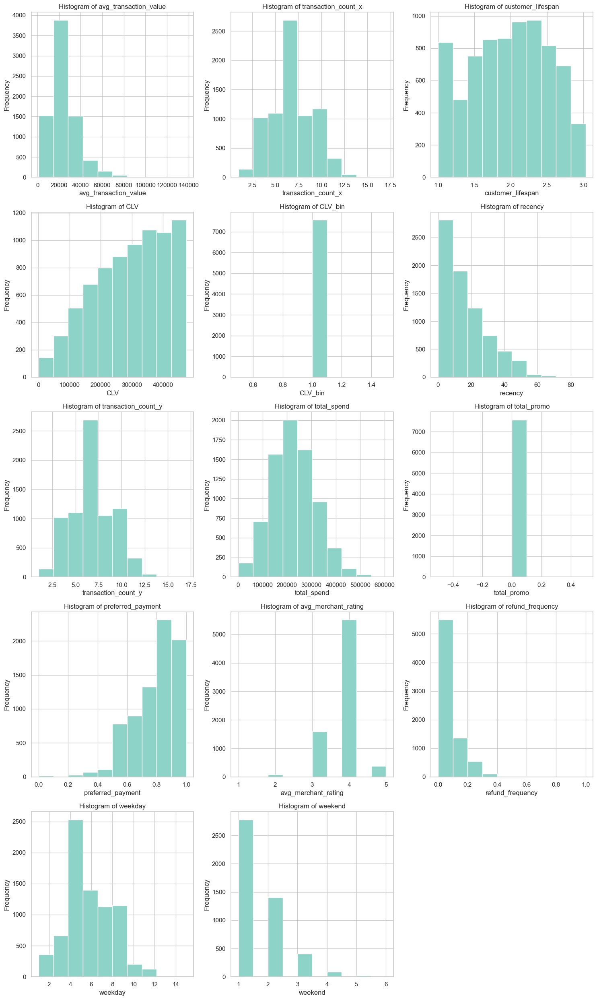

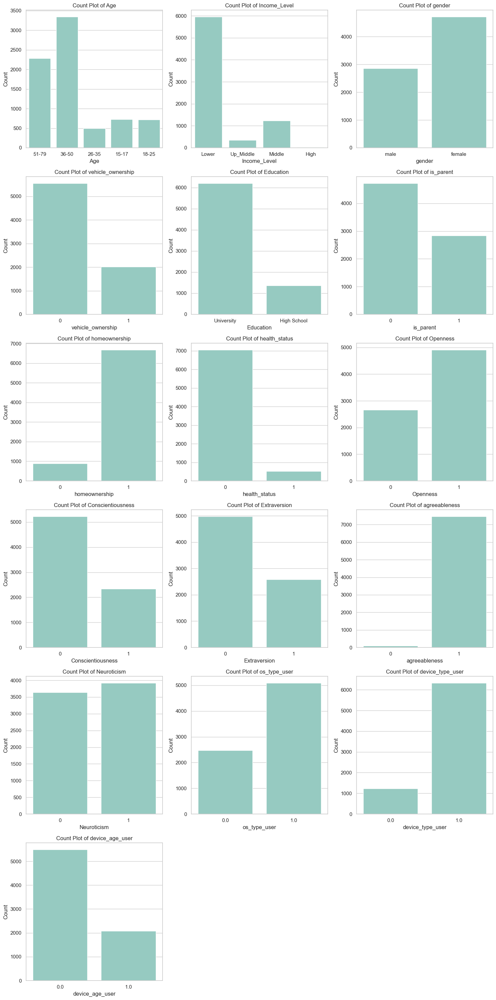

In [1240]:

def analyze_segment(df, segment_column, segment_value):
    # Filter the DataFrame based on the segment
    segment_df = df[df[segment_column] == segment_value]
    
    # Count the number of users in the segment
    user_count = segment_df['user_id'].count()
    print(f"User Count for {segment_column} = '{segment_value}': {user_count}")

    # Describe the filtered DataFrame
    print(f"Description for {segment_column} = '{segment_value}':")
    print(segment_df.describe())
    
    # Select numeric columns for histogram
    test_histogram = segment_df[['avg_transaction_value', 'transaction_count_x', 'customer_lifespan', 'CLV',
                                  'CLV_bin', 'recency', 'transaction_count_y', 'total_spend', 
                                  'total_promo', 'preferred_payment', 'avg_merchant_rating', 
                                  'refund_frequency', 'weekday', 'weekend']]
    
    # Calculate the number of rows and columns needed for subplots
    num_cols = 3
    num_rows = -(-len(test_histogram.columns) // num_cols)  # Ceiling division

    # Set up subplots for histograms
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    
    # Iterate over each column and plot histogram
    for idx, column in enumerate(test_histogram.columns):
        row = idx // num_cols
        col = idx % num_cols
        axs[row, col].hist(test_histogram[column], bins=10)
        axs[row, col].set_title(f'Histogram of {column}')
        axs[row, col].set_xlabel(column)
        axs[row, col].set_ylabel('Frequency')

    # Remove any unused subplots
    for idx in range(len(test_histogram.columns), num_rows * num_cols):
        row = idx // num_cols
        col = idx % num_cols
        axs[row, col].axis('off')

    plt.tight_layout()
    plt.show()

    # Define features to plot
    features = ['Age', 'Income_Level', 'gender', 'vehicle_ownership', 'Education', 'is_parent', 
                'homeownership', 'health_status', 'Openness', 'Conscientiousness', 
                'Extraversion', 'agreeableness', 'Neuroticism', 'os_type_user', 
                'device_type_user', 'device_age_user']

    # Set up the figure and axes for the count plots
    num_rows = (len(features) + num_cols - 1) // num_cols
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), facecolor='white')
    sns.set(style='whitegrid', palette='Set3')

    # Flatten the axs array for easier iteration
    axs = axs.flatten()

    # Iterate over each feature and create count plots
    for idx, feature in enumerate(features):
        sns.countplot(data=segment_df, x=feature, ax=axs[idx])
        axs[idx].set_title(f'Count Plot of {feature}')
        axs[idx].set_xlabel(feature)
        axs[idx].set_ylabel('Count')

    # Remove any unused subplots
    for idx in range(len(features), num_rows * num_cols):
        axs[idx].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage:
analyze_segment(df_clv_user, 'CLV_bin', 1)

In [1241]:
df_clv_user[df_clv_user['CLV_bin']==4]['gender'].value_counts(normalize=True) * 100

gender
female    68.31746
male      31.68254
Name: proportion, dtype: float64

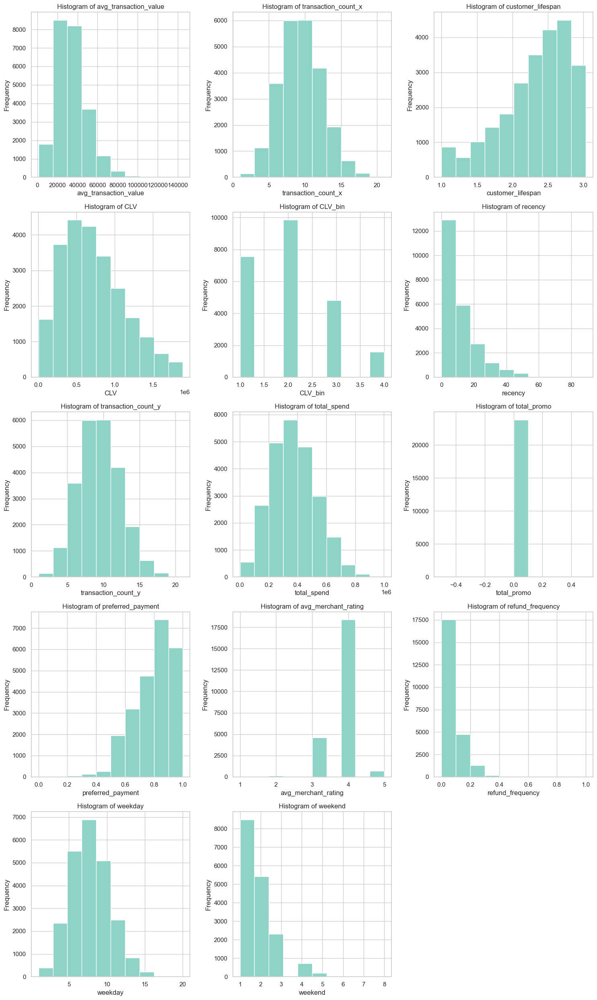

In [1242]:
# Select integer-type columns
test_histogram = df_clv_user[['avg_transaction_value', 'transaction_count_x', 'customer_lifespan', 'CLV',
       'CLV_bin', 'recency', 'transaction_count_y', 'total_spend', 'total_promo', 'preferred_payment',
       'avg_merchant_rating', 'refund_frequency','weekday', 'weekend'
]]
# Calculate the number of rows and columns needed for subplots
num_cols = 3
num_rows = -(-len(test_histogram.columns) // num_cols)  # Ceiling division to ensure enough rows for all columns

# Set up subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))  # Adjust figsize based on the number of rows

# Iterate over each column and plot histogram
for idx, column in enumerate(test_histogram.columns):
    row = idx // num_cols
    col = idx % num_cols
    axs[row, col].hist(test_histogram[column], bins=10)
    axs[row, col].set_title(f'Histogram of {column}')
    axs[row, col].set_xlabel(column)
    axs[row, col].set_ylabel('Frequency')

# Remove any unused subplots
for idx in range(len(test_histogram.columns), num_rows*num_cols):
    row = idx // num_cols
    col = idx % num_cols
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()


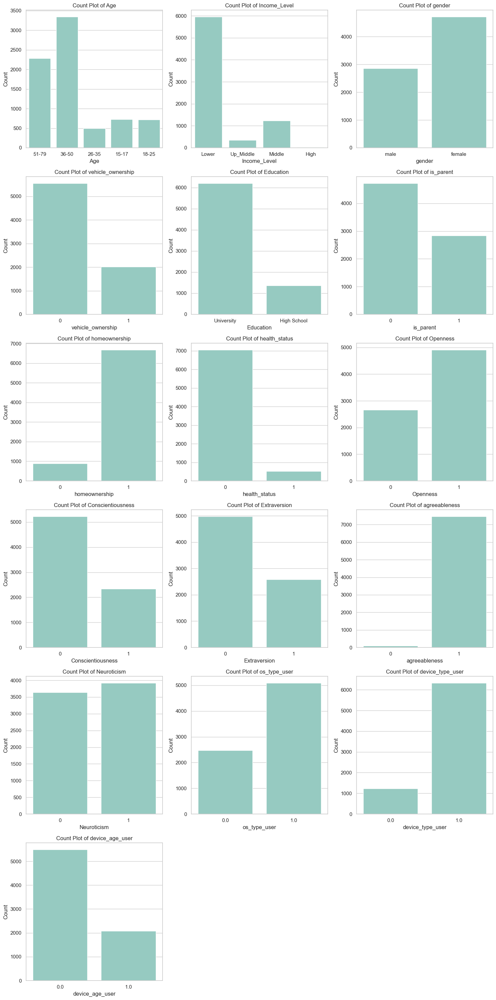

In [1243]:
# Define features to plot
features = ['Age', 'Income_Level', 'gender','vehicle_ownership','Education', 'is_parent', 'homeownership', 'health_status',
             'Openness', 'Conscientiousness', 'Extraversion', 'agreeableness', 'Neuroticism','os_type_user',
       'device_type_user', 'device_age_user', 
]

# Set up the figure and axes for the subplots
num_cols = 3
num_rows = (len(features) + num_cols - 1) // num_cols  # Calculate number of rows needed
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), facecolor='white')
sns.set(style='whitegrid', palette='Set3')

# Flatten the axs array for easier iteration
axs = axs.flatten()

# Iterate over each feature and create count plots
for idx, feature in enumerate(features):
    sns.countplot(data=df_clv_user[df_clv_user['CLV_bin'] == 1], x=feature, ax=axs[idx])
    axs[idx].set_title(f'Count Plot of {feature}')
    axs[idx].set_xlabel(feature)
    axs[idx].set_ylabel('Count')

# Remove any unused subplots if the number of features is less than the grid size
for idx in range(len(features), num_rows * num_cols):
    axs[idx].axis('off')

plt.tight_layout()
plt.show()

### **CLV 2**

In [1244]:
df_clv_user[df_clv_user['CLV_bin']==2]['user_id'].count()

9848

In [1245]:
df_clv_user[df_clv_user['CLV_bin']==2].describe()

,avg_transaction_value,transaction_count_x,first_purchase,last_purchase,customer_lifespan,CLV,recency,transaction_count_y,total_spend,avg_transaction,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,vehicle_ownership,is_parent,homeownership,health_status,index,mean_latitude_work,mean_latitude_home,mean_longitude_work,mean_longitude_home,merchant_category_id,Openness,Conscientiousness,Extraversion,agreeableness,Neuroticism
count,9848.000000,9848.000000,9848,9848,9848.000000,9848.000000,9848.000000,9848.000000,9848.000000,9848.000000,9848.000000,9848.000000,9848.0,9848.000000,9848.000000,9848.000000,9848.000000,9848.000000,9848.000000,9848.000000,7280.000000,9848.000000,9848.000000,9848.000000,9848.000000,9848.000000,9848.000000,7280.000000,9848.000000,7280.000000,9848.000000,9848.000000,9848.000000,9848.000000,9848.000000,9848.000000
mean,34306.209383,9.224716,2024-03-10 15:25:00.243704320,2024-05-21 09:25:35.337124096,2.391826,694239.629705,9.607230,9.224716,379127.528432,42491.055338,0.246548,0.000966,0.0,0.799898,3.828899,0.050747,0.658916,0.832859,0.281885,7.911353,1.776648,0.362307,0.348903,0.942120,0.109261,12143.475934,-6.713483,-6.715202,108.543262,108.540959,7.278128,0.850934,0.314785,0.601848,0.981824,0.489439
min,11000.000000,3.000000,2024-03-01 00:00:00,2024-04-04 00:00:00,1.000000,474240.000000,0.000000,3.000000,136000.000000,15627.272727,0.000000,0.000000,0.0,0.166667,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-7.976269,-7.977220,106.649466,106.629891,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25600.000000,8.000000,2024-03-04 00:00:00,2024-05-17 00:00:00,2.133333,578550.000000,3.000000,8.000000,311800.000000,34968.589744,0.000000,0.000000,0.0,0.714286,4.000000,0.000000,0.000000,1.000000,0.000000,6.000000,1.000000,0.000000,0.000000,1.000000,0.000000,6024.500000,-7.415090,-7.258834,106.803052,106.806901,6.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,31700.000000,9.000000,2024-03-08 00:00:00,2024-05-24 00:00:00,2.433333,684791.666667,7.000000,9.000000,371500.000000,41090.833333,0.000000,0.000000,0.0,0.818182,4.000000,0.000000,1.000000,1.000000,0.000000,8.000000,2.000000,0.000000,0.000000,1.000000,0.000000,12167.500000,-6.329167,-6.392508,106.837503,106.831435,7.000000,1.000000,0.000000,1.000000,1.000000,0.000000
75%,40150.000000,11.000000,2024-03-15 00:00:00,2024-05-28 00:00:00,2.700000,806150.000000,14.000000,11.000000,437300.000000,48616.269841,0.000000,0.000000,0.0,0.888889,4.000000,0.100000,1.000000,1.000000,1.000000,9.000000,2.000000,1.000000,1.000000,1.000000,0.000000,18217.750000,-6.271964,-6.203195,110.421952,110.423637,8.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,145100.000000,19.000000,2024-04-23 00:00:00,2024-05-31 00:00:00,3.033333,946960.000000,57.000000,19.000000,811300.000000,115233.333333,1.000000,0.166667,0.0,1.000000,5.000000,0.500000,1.000000,1.000000,1.000000,17.000000,7.000000,1.000000,1.000000,1.000000,1.000000,24316.000000,-6.171291,-6.159461,112.758563,112.762527,15.000000,1.000000,1.000000,1.000000,1.000000,1.000000
std,12508.674812,2.329244,NaN,NaN,0.380869,134347.652372,8.897112,2.329244,93902.585636,10786.664869,0.431023,0.010082,0.0,0.137602,0.441649,0.074437,0.474098,0.373120,0.449940,2.249711,0.936714,0.480691,0.476648,0.233528,0.311982,7034.673683,0.580310,0.615447,2.441607,2.438983,1.728065,0.356171,0.464454,0.489542,0.133595,0.499914


In [1246]:
df_clv_user[df_clv_user['CLV_bin']==4]['is_parent'].value_counts(normalize=True) * 100

is_parent
0    63.301587
1    36.698413
Name: proportion, dtype: float64

User Count for CLV_bin = '2': 9848
Description for CLV_bin = '2':
       avg_transaction_value  transaction_count_x  \
count            9848.000000          9848.000000   
mean            34306.209383             9.224716   
min             11000.000000             3.000000   
25%             25600.000000             8.000000   
50%             31700.000000             9.000000   
75%             40150.000000            11.000000   
max            145100.000000            19.000000   
std             12508.674812             2.329244   

                      first_purchase                  last_purchase  \
count                           9848                           9848   
mean   2024-03-10 15:25:00.243704320  2024-05-21 09:25:35.337124096   
min              2024-03-01 00:00:00            2024-04-04 00:00:00   
25%              2024-03-04 00:00:00            2024-05-17 00:00:00   
50%              2024-03-08 00:00:00            2024-05-24 00:00:00   
75%              2024-03-15 00

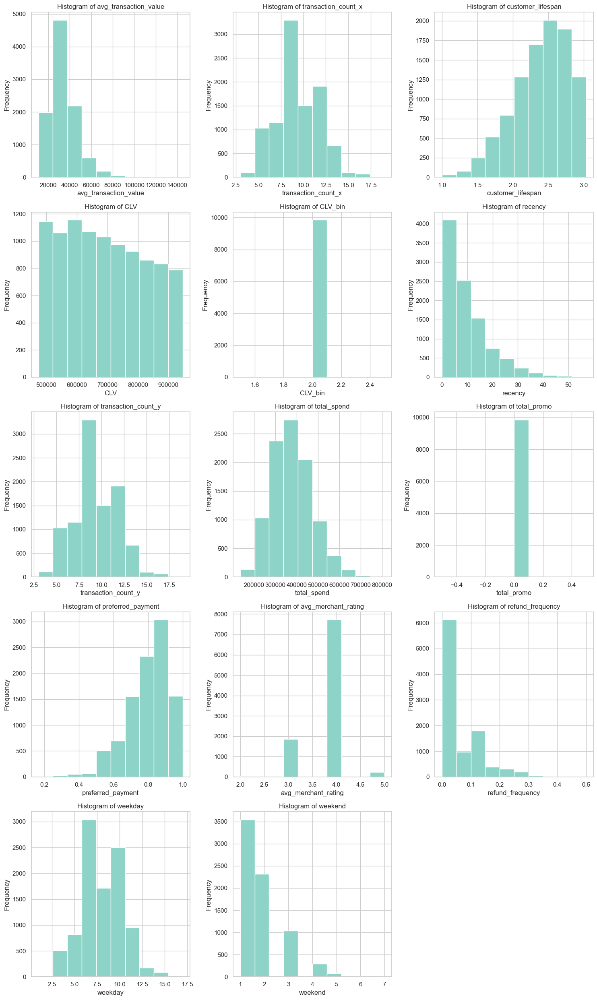

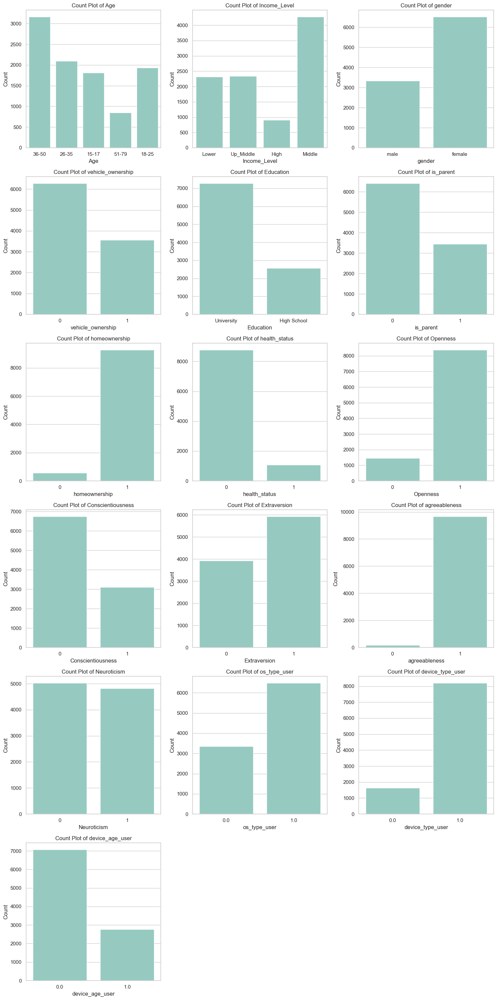

In [1247]:

analyze_segment(df_clv_user, 'CLV_bin', 2)

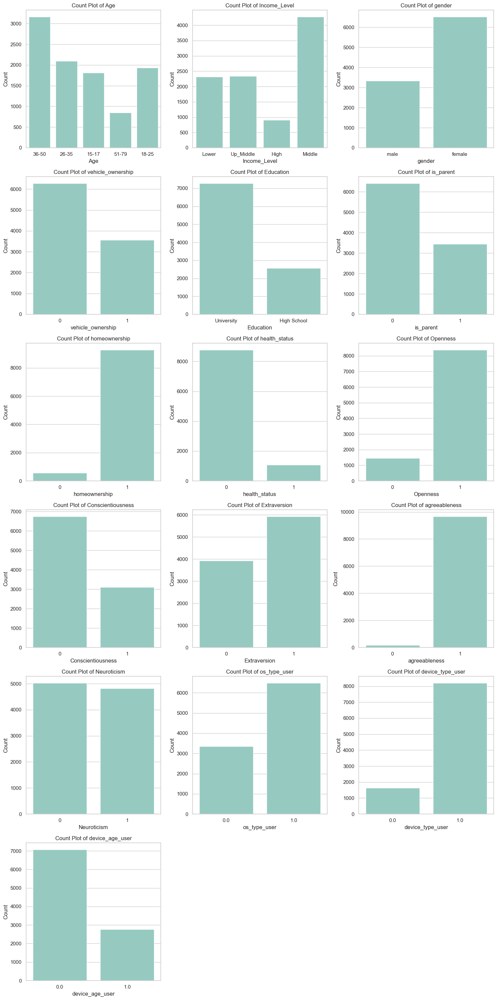

In [1248]:
# Define features to plot
features = ['Age', 'Income_Level', 'gender','vehicle_ownership','Education', 'is_parent', 'homeownership', 'health_status',
             'Openness', 'Conscientiousness', 'Extraversion', 'agreeableness', 'Neuroticism','os_type_user',
       'device_type_user', 'device_age_user', 
]

# Set up the figure and axes for the subplots
num_cols = 3
num_rows = (len(features) + num_cols - 1) // num_cols  # Calculate number of rows needed
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), facecolor='white')
sns.set(style='whitegrid', palette='Set3')

# Flatten the axs array for easier iteration
axs = axs.flatten()

# Iterate over each feature and create count plots
for idx, feature in enumerate(features):
    sns.countplot(data=df_clv_user[df_clv_user['CLV_bin'] == 2], x=feature, ax=axs[idx])
    axs[idx].set_title(f'Count Plot of {feature}')
    axs[idx].set_xlabel(feature)
    axs[idx].set_ylabel('Count')

# Remove any unused subplots if the number of features is less than the grid size
for idx in range(len(features), num_rows * num_cols):
    axs[idx].axis('off')

plt.tight_layout()
plt.show()

### **CLV 3**

In [1249]:
df_clv_user[df_clv_user['CLV_bin']==3]['user_id'].count()

4817

In [1250]:
df_clv_user[df_clv_user['CLV_bin']==3].describe()

,avg_transaction_value,transaction_count_x,first_purchase,last_purchase,customer_lifespan,CLV,recency,transaction_count_y,total_spend,avg_transaction,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,vehicle_ownership,is_parent,homeownership,health_status,index,mean_latitude_work,mean_latitude_home,mean_longitude_work,mean_longitude_home,merchant_category_id,Openness,Conscientiousness,Extraversion,agreeableness,Neuroticism
count,4817.000000,4817.000000,4817,4817,4817.000000,4.817000e+03,4817.000000,4817.000000,4817.000000,4817.000000,4817.000000,4817.000000,4817.0,4817.000000,4817.000000,4817.000000,4817.000000,4817.000000,4817.000000,4817.000000,3874.000000,4817.000000,4817.000000,4817.000000,4817.000000,4817.000000,4817.000000,3874.000000,4817.000000,3874.000000,4817.000000,4817.000000,4817.000000,4817.000000,4817.000000,4817.000000
mean,43818.320531,10.866307,2024-03-07 21:44:34.776832,2024-05-24 01:10:50.944571136,2.571441,1.146606e+06,6.950799,10.866307,516504.837035,48975.242791,0.242267,0.000604,0.0,0.802454,3.832676,0.050136,0.658501,0.833506,0.288977,9.311190,1.933660,0.396720,0.338800,0.998132,0.128711,12279.216525,-6.693882,-6.694084,108.482592,108.499243,7.895786,0.922774,0.310567,0.757525,0.977164,0.494083
min,15900.000000,4.000000,2024-03-01 00:00:00,2024-04-16 00:00:00,1.300000,9.474300e+05,0.000000,4.000000,248000.000000,24345.454545,0.000000,0.000000,0.0,0.285714,2.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,-7.880526,-7.976948,106.662684,106.629702,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,34800.000000,9.000000,2024-03-03 00:00:00,2024-05-21 00:00:00,2.400000,1.029600e+06,2.000000,9.000000,448000.000000,41841.666667,0.000000,0.000000,0.0,0.722222,4.000000,0.000000,0.000000,1.000000,0.000000,8.000000,1.000000,0.000000,0.000000,1.000000,0.000000,6281.000000,-7.399715,-7.257356,106.800477,106.807664,7.000000,1.000000,0.000000,1.000000,1.000000,0.000000
50%,41500.000000,11.000000,2024-03-06 00:00:00,2024-05-26 00:00:00,2.633333,1.126773e+06,5.000000,11.000000,508100.000000,47783.333333,0.000000,0.000000,0.0,0.818182,4.000000,0.000000,1.000000,1.000000,0.000000,9.000000,2.000000,0.000000,0.000000,1.000000,0.000000,12261.000000,-6.321756,-6.384173,106.832044,106.831526,8.000000,1.000000,0.000000,1.000000,1.000000,0.000000
75%,50300.000000,12.000000,2024-03-11 00:00:00,2024-05-29 00:00:00,2.800000,1.258740e+06,10.000000,12.000000,577700.000000,54890.000000,0.000000,0.000000,0.0,0.900000,4.000000,0.090909,1.000000,1.000000,1.000000,11.000000,2.000000,1.000000,1.000000,1.000000,0.000000,18469.000000,-6.273131,-6.213668,110.421593,110.422119,9.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,116400.000000,21.000000,2024-04-13 00:00:00,2024-05-31 00:00:00,3.033333,1.420240e+06,45.000000,21.000000,916100.000000,103866.666667,1.000000,0.125000,0.0,1.000000,5.000000,0.400000,1.000000,1.000000,1.000000,20.000000,7.000000,1.000000,1.000000,1.000000,1.000000,24314.000000,-6.172405,-6.159700,112.756732,112.762855,14.000000,1.000000,1.000000,1.000000,1.000000,1.000000
std,12682.272037,2.470587,NaN,NaN,0.290754,1.338143e+05,6.641185,2.470587,96666.733634,10091.088422,0.428499,0.007322,0.0,0.126504,0.418414,0.067485,0.474262,0.372562,0.453334,2.415625,1.033889,0.489268,0.473351,0.043189,0.334914,6994.609246,0.572445,0.596961,2.437198,2.441201,1.748022,0.266978,0.462774,0.428624,0.149395,0.500017


In [1251]:
df_clv_user[df_clv_user['CLV_bin']==3]['Age'].value_counts(normalize=True) * 100

Age
26-35    33.091136
18-25    24.019099
15-17    22.752751
36-50    17.811916
51-79     2.325099
Name: proportion, dtype: float64

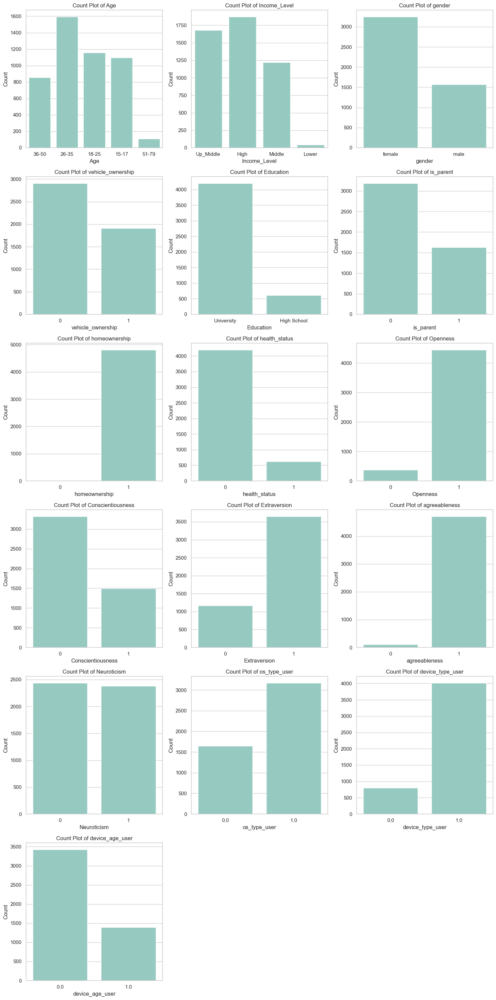

In [1252]:
# Define features to plot
features = ['Age', 'Income_Level', 'gender','vehicle_ownership','Education', 'is_parent', 'homeownership', 'health_status',
             'Openness', 'Conscientiousness', 'Extraversion', 'agreeableness', 'Neuroticism','os_type_user',
       'device_type_user', 'device_age_user', 
]

# Set up the figure and axes for the subplots
num_cols = 3
num_rows = (len(features) + num_cols - 1) // num_cols  # Calculate number of rows needed
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), facecolor='white')
sns.set(style='whitegrid', palette='Set3')

# Flatten the axs array for easier iteration
axs = axs.flatten()

# Iterate over each feature and create count plots
for idx, feature in enumerate(features):
    sns.countplot(data=df_clv_user[df_clv_user['CLV_bin'] == 3], x=feature, ax=axs[idx])
    axs[idx].set_title(f'Count Plot of {feature}')
    axs[idx].set_xlabel(feature)
    axs[idx].set_ylabel('Count')

# Remove any unused subplots if the number of features is less than the grid size
for idx in range(len(features), num_rows * num_cols):
    axs[idx].axis('off')

plt.tight_layout()
plt.show()

### **CLV 4**

<Axes: xlabel='customer_lifespan', ylabel='Count'>

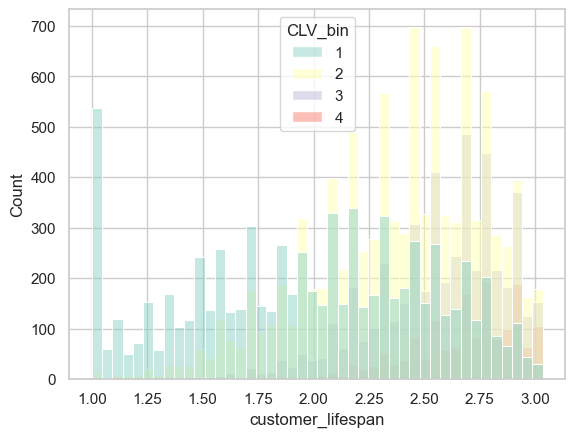

In [1253]:
sns.histplot(data=df_clv_user,x='customer_lifespan',hue='CLV_bin')

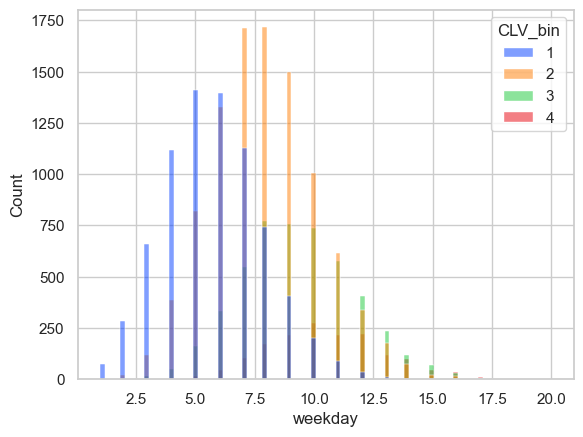

In [1254]:
# Set a more contrasting color palette
sns.set_palette("bright")  # You can also try "deep", "Set2", or other palettes

# Create the histogram with the new palette
sns.histplot(data=df_clv_user, x='weekday', hue='CLV_bin', palette="bright")

# Show the plot
plt.show()

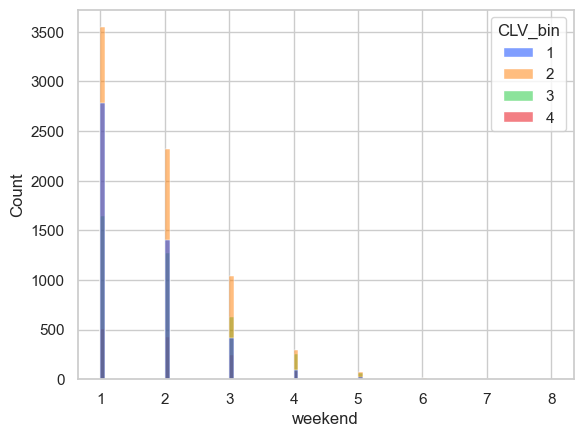

In [1255]:
# Set a more contrasting color palette
sns.set_palette("bright")  # You can also try "deep", "Set2", or other palettes

# Create the histogram with the new palette
sns.histplot(data=df_clv_user, x='weekend', hue='CLV_bin', palette="bright")

# Show the plot
plt.show()

In [1256]:
df_clv_user[df_clv_user['CLV_bin']==1]['weekday'].value_counts(normalize=True) * 100

weekday
5.0     18.690476
6.0     18.452381
7.0     14.920635
4.0     14.788360
8.0      9.814815
3.0      8.743386
9.0      5.370370
2.0      3.743386
10.0     2.658730
11.0     1.150794
1.0      1.005291
12.0     0.462963
13.0     0.132275
14.0     0.039683
15.0     0.026455
Name: proportion, dtype: float64

User Count for CLV_bin = '4': 1575
Description for CLV_bin = '4':
       avg_transaction_value  transaction_count_x  \
count            1575.000000          1575.000000   
mean            51751.015873            12.203810   
min             26400.000000             6.000000   
25%             42700.000000            10.000000   
50%             49900.000000            12.000000   
75%             58550.000000            14.000000   
max            116100.000000            20.000000   
std             12710.047611             2.501026   

                      first_purchase                  last_purchase  \
count                           1575                           1575   
mean   2024-03-06 12:32:27.428571136  2024-05-26 01:40:34.285714432   
min              2024-03-01 00:00:00            2024-04-25 00:00:00   
25%              2024-03-02 00:00:00            2024-05-24 00:00:00   
50%              2024-03-05 00:00:00            2024-05-27 00:00:00   
75%              2024-03-09 00

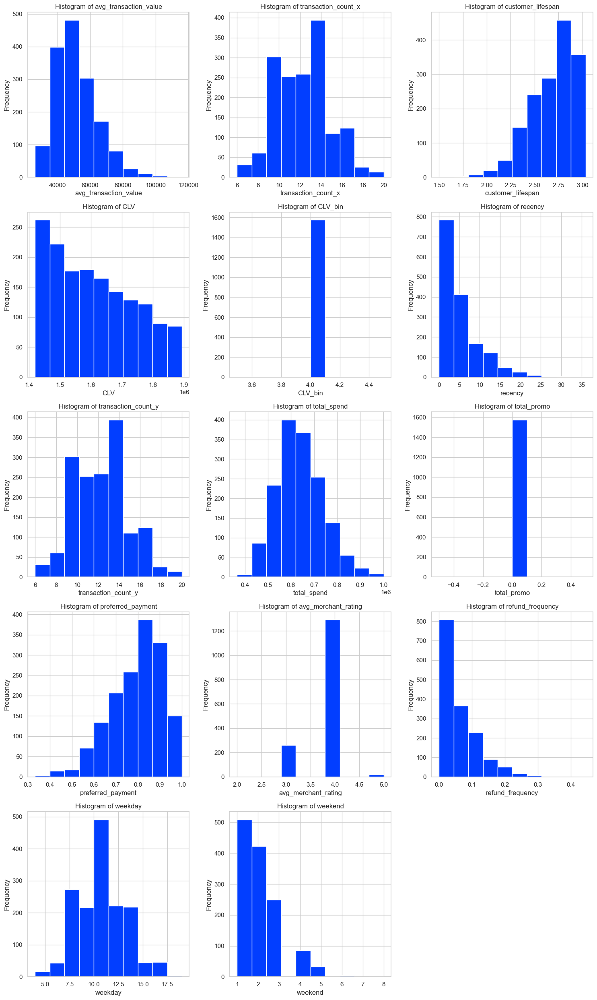

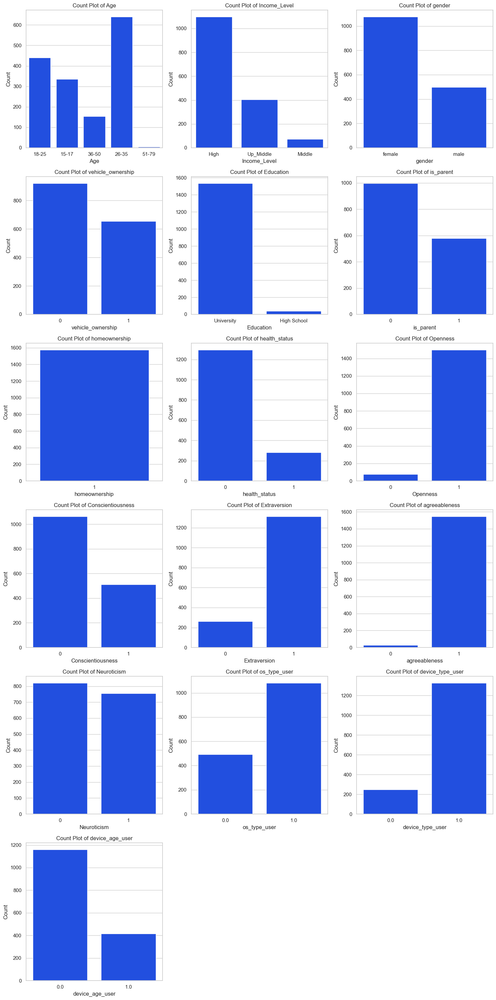

In [1257]:
analyze_segment(df_clv_user, 'CLV_bin', 4)

In [1258]:
df_clv_user[df_clv_user['CLV_bin']==4]['user_id'].count()

1575

In [1259]:
df_clv_user[df_clv_user['CLV_bin']==4].describe()

,avg_transaction_value,transaction_count_x,first_purchase,last_purchase,customer_lifespan,CLV,recency,transaction_count_y,total_spend,avg_transaction,loyalty_participation,promo_usage,total_promo,preferred_payment,avg_merchant_rating,refund_frequency,os_type_user,device_type_user,device_age_user,weekday,weekend,vehicle_ownership,is_parent,homeownership,health_status,index,mean_latitude_work,mean_latitude_home,mean_longitude_work,mean_longitude_home,merchant_category_id,Openness,Conscientiousness,Extraversion,agreeableness,Neuroticism
count,1575.000000,1575.000000,1575,1575,1575.000000,1.575000e+03,1575.000000,1575.000000,1.575000e+03,1575.000000,1575.000000,1575.000000,1575.0,1575.000000,1575.000000,1575.000000,1575.000000,1575.000000,1575.000000,1575.000000,1304.000000,1575.000000,1575.000000,1575.0,1575.000000,1575.000000,1575.000000,1304.000000,1575.000000,1304.000000,1575.000000,1575.000000,1575.000000,1575.000000,1575.000000,1575.000000
mean,51751.015873,12.203810,2024-03-06 12:32:27.428571136,2024-05-26 01:40:34.285714432,2.684910,1.612087e+06,4.930159,12.203810,6.385644e+05,53668.503099,0.230476,0.000746,0.0,0.797834,3.845079,0.051760,0.686984,0.841905,0.263492,10.528254,2.023773,0.415238,0.366984,1.0,0.177778,11989.437460,-6.712673,-6.729300,108.548678,108.613011,8.328889,0.951111,0.325079,0.834286,0.981587,0.479365
min,26400.000000,6.000000,2024-03-01 00:00:00,2024-04-25 00:00:00,1.500000,1.420720e+06,0.000000,6.000000,3.660000e+05,27594.736842,0.000000,0.000000,0.0,0.333333,2.000000,0.000000,0.000000,0.000000,0.000000,4.000000,1.000000,0.000000,0.000000,1.0,0.000000,21.000000,-7.876674,-7.975503,106.714912,106.631631,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,42700.000000,10.000000,2024-03-02 00:00:00,2024-05-24 00:00:00,2.533333,1.494113e+06,1.000000,10.000000,5.703500e+05,46532.051282,0.000000,0.000000,0.0,0.727273,4.000000,0.000000,0.000000,1.000000,0.000000,9.000000,1.000000,0.000000,0.000000,1.0,0.000000,5860.500000,-7.423029,-7.262424,106.800752,106.808461,7.000000,1.000000,0.000000,1.000000,1.000000,0.000000
50%,49900.000000,12.000000,2024-03-05 00:00:00,2024-05-27 00:00:00,2.733333,1.593900e+06,4.000000,12.000000,6.281000e+05,52908.333333,0.000000,0.000000,0.0,0.800000,4.000000,0.000000,1.000000,1.000000,0.000000,10.000000,2.000000,0.000000,0.000000,1.0,0.000000,12107.000000,-6.320808,-6.394337,106.832564,106.832706,8.000000,1.000000,0.000000,1.000000,1.000000,0.000000
75%,58550.000000,14.000000,2024-03-09 00:00:00,2024-05-30 00:00:00,2.866667,1.715725e+06,7.000000,14.000000,7.005000e+05,59363.333333,0.000000,0.000000,0.0,0.888889,4.000000,0.090909,1.000000,1.000000,1.000000,12.000000,3.000000,1.000000,1.000000,1.0,0.000000,18080.500000,-6.272153,-6.212486,110.422018,110.425251,9.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,116100.000000,20.000000,2024-04-12 00:00:00,2024-05-31 00:00:00,3.033333,1.893600e+06,36.000000,20.000000,1.002100e+06,103566.666667,1.000000,0.200000,0.0,1.000000,5.000000,0.444444,1.000000,1.000000,1.000000,19.000000,8.000000,1.000000,1.000000,1.0,1.000000,24319.000000,-6.188266,-6.160075,112.754708,112.762654,14.000000,1.000000,1.000000,1.000000,1.000000,1.000000
std,12710.047611,2.501026,NaN,NaN,0.240212,1.315292e+05,4.989972,2.501026,1.003468e+05,9768.286014,0.421271,0.008732,0.0,0.119205,0.397098,0.063534,0.463868,0.364946,0.440667,2.454735,1.070881,0.492920,0.482135,0.0,0.382447,7118.976958,0.582054,0.614263,2.451982,2.478387,1.752043,0.215704,0.468553,0.371942,0.134481,0.499733


In [1260]:
df_clv_user[df_clv_user['CLV_bin']==4]['Income_Level'].value_counts(normalize=True) * 100

Income_Level
High         69.714286
Up_Middle    25.650794
Middle        4.634921
Name: proportion, dtype: float64

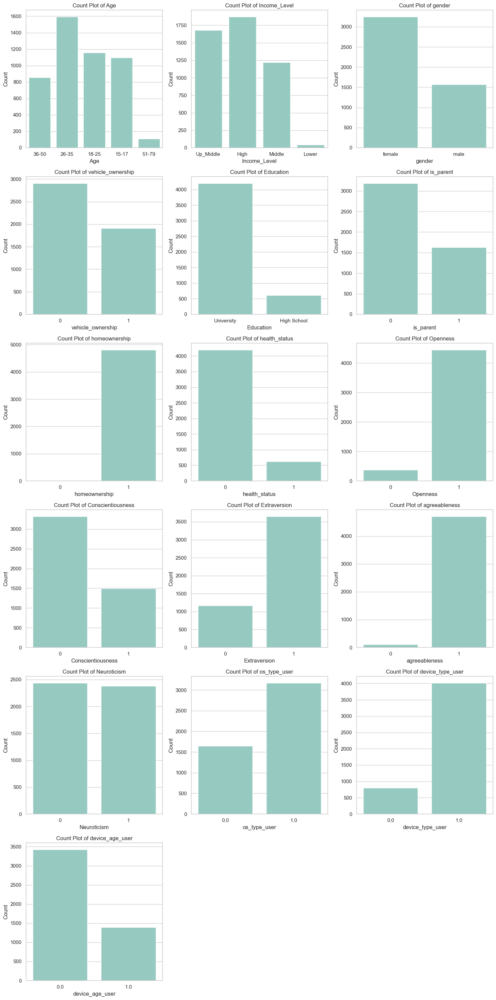

In [1261]:
# Define features to plot
features = ['Age', 'Income_Level', 'gender','vehicle_ownership','Education', 'is_parent', 'homeownership', 'health_status',
             'Openness', 'Conscientiousness', 'Extraversion', 'agreeableness', 'Neuroticism','os_type_user',
       'device_type_user', 'device_age_user', 
]

# Set up the figure and axes for the subplots
num_cols = 3
num_rows = (len(features) + num_cols - 1) // num_cols  # Calculate number of rows needed
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), facecolor='white')
sns.set(style='whitegrid', palette='Set3')

# Flatten the axs array for easier iteration
axs = axs.flatten()

# Iterate over each feature and create count plots
for idx, feature in enumerate(features):
    sns.countplot(data=df_clv_user[df_clv_user['CLV_bin'] == 3], x=feature, ax=axs[idx])
    axs[idx].set_title(f'Count Plot of {feature}')
    axs[idx].set_xlabel(feature)
    axs[idx].set_ylabel('Count')

# Remove any unused subplots if the number of features is less than the grid size
for idx in range(len(features), num_rows * num_cols):
    axs[idx].axis('off')

plt.tight_layout()
plt.show()